In [26]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import trompy as tp
import csv
from datetime import datetime, timedelta
from matplotlib.lines import Line2D


# the next two lines will expand the printed tables
pd.options.display.max_rows= 40000
pd.options.display.max_columns= 40000


ctl_color= "gray"
exp_color="deepskyblue"
# Define the color values
high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.25)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.25)


from matplotlib import rc

plt.rcParams.update({
    'font.family': 'Arial',   # Font family
    'font.size': 20,          # Global font size
    
    'axes.titlesize': 20,     # Font size of the axes title
   
    'axes.labelsize': 20,     # Font size of the x and y labels
  
    'xtick.labelsize': 18,    # Font size of the x tick labels
    'ytick.labelsize': 18,    # Font size of the y tick labels
    'legend.fontsize': 20,    # Font size of the legend
    'figure.titlesize': 20,   # Font size of the figure title
 
})

rc('axes', titlesize=20, labelsize=20,)
rc('xtick', labelsize=18)
rc('ytick', labelsize=18)
rc('legend', fontsize=18, frameon=True, fancybox=True)
# rc('font', weight='bold')


# fig_folder=r"../plots/FINAL_PLOTS_FOR_FENS24\\"
READ_METAFILE= pd.read_excel(r"../FEDXD_METAFILE.xls" ,sheet_name="METAFILE" )

READ_METAFILE


,MOUSEID,SEX,BATCH,FEDFILE,CHOICE_SESSION,FED_PELLET,MODE,DIET
0,FEDXDF1,F,1,FED001_032923_02.CSV,0,MIX,FF,PR
1,FEDXDF1,F,1,FED001_033023_01.CSV,0,MIX,FR,PR
2,FEDXDF1,F,1,FED001_040923_00.CSV,1,CAS20,FR,PR
3,FEDXDF1,F,1,FED002_040923_00.CSV,1,CAS5,FR,PR
4,FEDXDF1,F,1,FED001_041323_00.CSV,2,CAS20,FR,PR
5,FEDXDF1,F,1,FED002_041323_00.CSV,2,SUC,FR,PR
6,FEDXDF1,F,1,FED001_041723_00.CSV,3,CAS5,FR,PR
7,FEDXDF1,F,1,FED002_041723_00.CSV,3,SUC,FR,PR
8,FEDXDF1,F,1,FED001_042123_03.CSV,4,CAS5,CE,PR
9,FEDXDF1,F,1,FED002_042123_02.CSV,4,SUC,CE,PR


[Link to Choice_1_MEAL_COMPONENT](#Choice_1_MEAL_COMPONENT)

[Link to Choice_1_SNACK_COMPONENT](#Choice_1_SNACK_COMPONENT)


[Link to Choice_2_MEAL_COMPONENT](#Choice_2_MEAL_COMPONENT)

[Link to Choice_2_SNACK_COMPONENT](#Choice_2_SNACK_COMPONENT)


[Link to Choice_3_MEAL_COMPONENT](#Choice_3_MEAL_COMPONENT)

[Link to Choice_3_SNACK_COMPONENT](#Choice_3_SNACK_COMPONENT)

[Link to Choice_4_MEAL_COMPONENT](#Choice_4_MEAL_COMPONENT)

[Link to Choice_4_SNACK_COMPONENT](#Choice_4_SNACK_COMPONENT)




[Link to HOURLY_INTAKE_DATA](#HOURLY_INTAKE_DATA)

In [5]:
# this csv file is used to plot meal component data
data= pd.read_csv("../results/MEGAMEAL_FREQUENCY.csv")
data

,Unnamed: 0,MOUSEID,SEX,DIET,CHOICE_SESSION,PELLET_TYPE,COUNT,MEAL_SIZE,SNACK_SIZE,NUMBER_OF_MEALS,MEAL_FREQUENCY,NUMBER_OF_SNACKS,SNACK_FREQUENCY,NUMBER_OF_MEGA_MEALS,AVERAGE_MEGA_MEAL_SIZE,MEGA_MEAL_FREQUENCY,MEALS_HOUR_0,MEALS_HOUR_1,MEALS_HOUR_2,MEALS_HOUR_3,MEALS_HOUR_4,MEALS_HOUR_5,MEALS_HOUR_6,MEALS_HOUR_7,MEALS_HOUR_8,MEALS_HOUR_9,MEALS_HOUR_10,MEALS_HOUR_11,MEALS_HOUR_12,MEALS_HOUR_13,MEALS_HOUR_14,MEALS_HOUR_15,MEALS_HOUR_16,MEALS_HOUR_17,MEALS_HOUR_18,MEALS_HOUR_19,MEALS_HOUR_20,MEALS_HOUR_21,MEALS_HOUR_22,MEALS_HOUR_23
0,0,FEDXDF1,F,PR,0.0,MIX,210,4.666667,1.0,42,1.932688,14,0.644229,10,7.400000,0.460164,2.0,1.0,0.0,3.0,3.0,1.0,1.0,4.0,0.0,0.0,1.0,3.0,1.0,2.0,3.0,2.0,2.0,3.0,2.0,2.0,1.0,1.0,2.0,2.0
1,1,FEDXDF1,F,PR,0.0,MIX,296,3.271429,1.0,70,1.471112,67,1.408064,5,7.600000,0.105079,7.0,3.0,5.0,0.0,0.0,3.0,2.0,0.0,2.0,1.0,1.0,2.0,4.0,1.0,5.0,4.0,8.0,5.0,5.0,4.0,0.0,0.0,6.0,2.0
2,2,FEDXDF2,F,PR,0.0,MIX,350,3.387097,1.0,93,4.203179,35,1.581841,10,6.900000,0.451955,2.0,1.0,8.0,11.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,3.0,5.0,4.0,5.0,7.0,7.0,6.0,6.0,6.0,6.0,4.0,5.0,2.0
3,3,FEDXDF2,F,PR,0.0,MIX,330,3.011905,1.0,84,1.727763,77,1.583783,5,6.600000,0.102843,6.0,2.0,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,5.0,4.0,8.0,8.0,7.0,9.0,7.0,4.0,4.0,3.0,4.0,3.0
4,4,FEDXDF3,F,PR,0.0,MIX,291,3.652174,1.0,69,2.923626,39,1.652484,8,7.625000,0.338971,4.0,5.0,0.0,4.0,4.0,0.0,5.0,0.0,2.0,3.0,0.0,1.0,2.0,4.0,6.0,5.0,5.0,7.0,4.0,4.0,3.0,1.0,0.0,0.0
5,5,FEDXDF3,F,PR,0.0,MIX,375,4.144737,1.0,76,1.565764,60,1.236129,18,8.000000,0.370839,5.0,0.0,5.0,1.0,1.0,1.0,1.0,2.0,0.0,1.0,2.0,1.0,6.0,5.0,6.0,6.0,7.0,6.0,4.0,4.0,4.0,3.0,1.0,4.0
6,6,FEDXDF4,F,PR,0.0,MIX,294,4.257576,1.0,66,2.779630,13,0.547503,16,7.250000,0.673850,4.0,3.0,7.0,6.0,0.0,1.0,2.0,0.0,4.0,1.0,2.0,1.0,5.0,2.0,3.0,2.0,4.0,5.0,4.0,2.0,2.0,0.0,3.0,3.0
7,7,FEDXDF4,F,PR,0.0,MIX,312,4.928571,1.0,56,1.150724,36,0.739751,22,7.181818,0.452070,3.0,0.0,4.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,1.0,4.0,4.0,4.0,7.0,3.0,4.0,4.0,4.0,4.0,1.0,0.0,4.0
8,8,FEDXDF5,F,PR,0.0,MIX,227,5.538462,1.0,39,2.372744,11,0.669235,19,8.000000,1.155952,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,2.0,3.0,3.0,3.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0
9,9,FEDXDF5,F,PR,0.0,MIX,363,4.920635,1.0,63,1.362612,53,1.146325,24,8.416667,0.519090,2.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,2.0,5.0,6.0,6.0,4.0,6.0,6.0,3.0,4.0,4.0,3.0,0.0,3.0


In [6]:
# This csv file is used to generate the line plot (ShadedError figure)
file_path = '../results/HOURLY_PELLET.csv'
HDATA = pd.read_csv(file_path)
HDATA.fillna(0, inplace=True)


male_pr_hourly_C1_CAS20 = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 1) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "CAS20")]
male_pr_hourly_C1_CAS5 = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 1) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "CAS5")]
male_nr_hourly_C1_CAS20 = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 1) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "CAS20")]
male_nr_hourly_C1_CAS5 = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 1) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "CAS5")]



male_pr_hourly_C2_CAS20 = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 2) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "CAS20")]
male_pr_hourly_C2_SUC = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 2) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "SUC")]
male_nr_hourly_C2_CAS20 = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 2) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "CAS20")]
male_nr_hourly_C2_SUC = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 2) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "SUC")]


male_pr_hourly_C3_CAS5 = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 3) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "CAS5")]
male_pr_hourly_C3_SUC = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 3) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "SUC")]
male_nr_hourly_C3_CAS5 = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 3) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "CAS5")]
male_nr_hourly_C3_SUC = HDATA[(HDATA['SEX'] == 'M') & (HDATA['CHOICE_SESSION'] == 3) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "SUC")]


female_pr_hourly_C1_CAS20 = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 1) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "CAS20")]
female_pr_hourly_C1_CAS5 = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 1) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "CAS5")]
female_nr_hourly_C1_CAS20 = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 1) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "CAS20")]
female_nr_hourly_C1_CAS5 = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 1) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "CAS5")]



female_pr_hourly_C2_CAS20 = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 2) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "CAS20")]
female_pr_hourly_C2_SUC = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 2) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "SUC")]
female_nr_hourly_C2_CAS20 = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 2) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "CAS20")]
female_nr_hourly_C2_SUC = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 2) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "SUC")]



female_pr_hourly_C3_CAS5 = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 3) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "CAS5")]
female_pr_hourly_C3_SUC = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 3) & (HDATA['DIET'] == 'PR') & (HDATA["PELLET_TYPE"] == "SUC")]
female_nr_hourly_C3_CAS5 = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 3) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "CAS5")]
female_nr_hourly_C3_SUC = HDATA[(HDATA['SEX'] == 'F') & (HDATA['CHOICE_SESSION'] == 3) & (HDATA['DIET'] == 'NR') & (HDATA["PELLET_TYPE"] == "SUC")]



CAS20_MPR_C1 = male_pr_hourly_C1_CAS20.iloc[:, 5:-26]
CAS5_MPR_C1 = male_pr_hourly_C1_CAS5.iloc[:, 5:-26]
CAS20_MNR_C1 = male_nr_hourly_C1_CAS20.iloc[:, 5:-26]
CAS5_MNR_C1 = male_nr_hourly_C1_CAS5.iloc[:, 5:-26]



CAS20_MPR_C2= male_pr_hourly_C2_CAS20.iloc[:, 5:-26]
SUC_MPR_C2 = male_pr_hourly_C2_SUC.iloc[:, 5:-26]
CAS20_MNR_C2 = male_nr_hourly_C2_CAS20.iloc[:, 5:-26]
SUC_MNR_C2 = male_nr_hourly_C2_SUC.iloc[:, 5:-26]

CAS5_MPR_C3= male_pr_hourly_C3_CAS5.iloc[:, 5:-26]
SUC_MPR_C3 = male_pr_hourly_C3_SUC.iloc[:, 5:-26]
CAS5_MNR_C3 = male_nr_hourly_C3_CAS5.iloc[:, 5:-26]
SUC_MNR_C3 = male_nr_hourly_C3_SUC.iloc[:, 5:-26]


CAS20_FPR_C1= female_pr_hourly_C1_CAS20.iloc[:, 5:-26]
CAS5_FPR_C1 = female_pr_hourly_C1_CAS5.iloc[:, 5:-26]
CAS20_FNR_C1 = female_nr_hourly_C1_CAS20.iloc[:, 5:-26]
CAS5_FNR_C1= female_nr_hourly_C1_CAS5.iloc[:, 5:-26]


CAS20_FPR_C2= female_pr_hourly_C2_CAS20.iloc[:, 5:-26]
SUC_FPR_C2 = female_pr_hourly_C2_SUC.iloc[:, 5:-26]
CAS20_FNR_C2 = female_nr_hourly_C2_CAS20.iloc[:, 5:-26]
SUC_FNR_C2 = female_nr_hourly_C2_SUC.iloc[:, 5:-26]


CAS5_FPR_C3= female_pr_hourly_C3_CAS5.iloc[:, 5:-26]
SUC_FPR_C3 = female_pr_hourly_C3_SUC.iloc[:, 5:-26]
CAS5_FNR_C3 = female_nr_hourly_C3_CAS5.iloc[:, 5:-26]
SUC_FNR_C3 = female_nr_hourly_C3_SUC.iloc[:, 5:-26]




In [91]:
SUC_MPR_C3

,Hour_1,Hour_2,Hour_3,Hour_4,Hour_5,Hour_6,Hour_7,Hour_8,Hour_9,Hour_10,Hour_11,Hour_12,Hour_13,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21
275,2.0,3.0,0.0,0.0,1.0,1.0,0.0,1.0,2.0,3.0,4.0,0.0,0.0,2.0,1.0,0.0,1.0,1.0,2.0,5.0,0.0
276,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
277,0.0,1.0,0.0,0.0,0.0,2.0,0.0,2.0,2.0,2.0,1.0,0.0,3.0,0.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0
278,0.0,0.0,2.0,2.0,0.0,0.0,1.0,1.0,4.0,0.0,0.0,2.0,0.0,1.0,1.0,2.0,3.0,0.0,0.0,3.0,2.0
279,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,2.0,1.0,3.0,0.0,1.0,1.0,0.0
280,0.0,3.0,0.0,0.0,0.0,1.0,0.0,1.0,4.0,2.0,1.0,2.0,0.0,3.0,1.0,0.0,2.0,1.0,1.0,3.0,0.0
281,3.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,3.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,0.0,0.0,1.0,0.0
282,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
283,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
284,2.0,0.0,0.0,1.0,2.0,0.0,3.0,1.0,4.0,3.0,2.0,0.0,1.0,1.0,2.0,1.0,1.0,0.0,1.0,1.0,1.0


<a id="Choice_1_MEAL_COMPONENT"></a>
## Choice_1_MEAL_COMPONENT

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


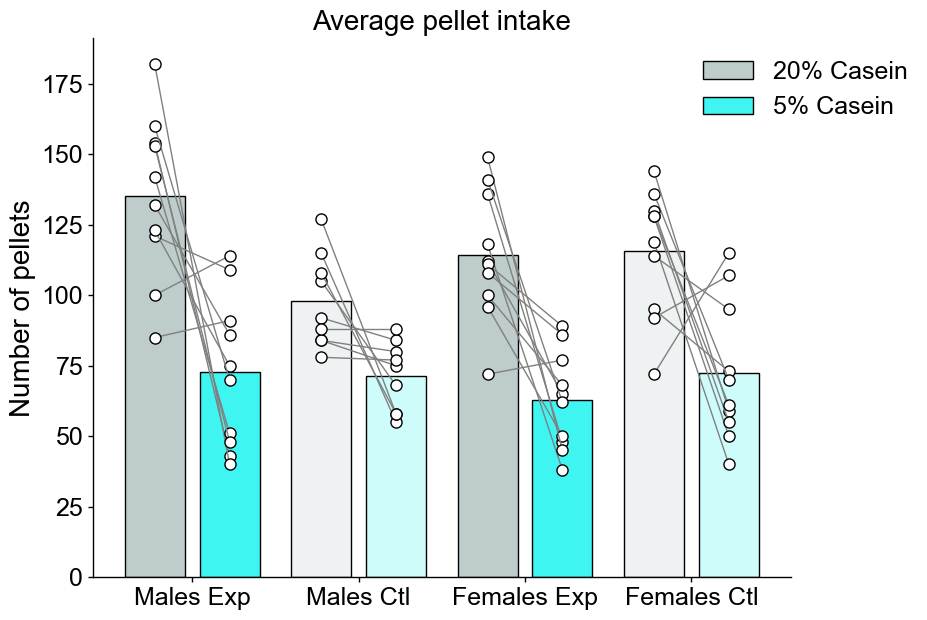

In [27]:

fig_folder = r"../plots\FINAL_PLOTS_FOR_FENS24\C1\\"
# Filter the data for male PR mice in choice session 1
pellet_count_male_nr_pellet_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
pellet_count_average_pellets_per_type_mnr1= pellet_count_male_nr_pellet_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_female_nr_pellet_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
pellet_count_average_pellets_per_type_fnr1= pellet_count_female_nr_pellet_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_male_pr_pellet_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
pellet_count_average_pellets_per_type_mpr1= pellet_count_male_pr_pellet_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_female_pr_pellet_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
pellet_count_average_pellets_per_type_fpr1= pellet_count_female_pr_pellet_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_cas20_mpr1= pellet_count_average_pellets_per_type_mpr1['CAS20']
pellet_count_cas5_mpr1= pellet_count_average_pellets_per_type_mpr1['CAS5']
pellet_count_cas20_fpr1= pellet_count_average_pellets_per_type_fpr1['CAS20']
pellet_count_cas5_fpr1= pellet_count_average_pellets_per_type_fpr1['CAS5']

pellet_count_cas20_mnr1= pellet_count_average_pellets_per_type_mnr1['CAS20']
pellet_count_cas5_mnr1= pellet_count_average_pellets_per_type_mnr1['CAS5']
pellet_count_cas20_fnr1= pellet_count_average_pellets_per_type_fnr1['CAS20']
pellet_count_cas5_fnr1= pellet_count_average_pellets_per_type_fnr1['CAS5']

pellet_count_group_data_male_pr = [pellet_count_cas20_mpr1.tolist(), pellet_count_cas5_mpr1.tolist()]
pellet_count_group_data_female_pr = [pellet_count_cas20_fpr1.tolist(), pellet_count_cas5_fpr1.tolist()]
pellet_count_group_data_male_nr = [pellet_count_cas20_mnr1.tolist(), pellet_count_cas5_mnr1.tolist()]
pellet_count_group_data_female_nr = [pellet_count_cas20_fnr1.tolist(), pellet_count_cas5_fnr1.tolist()]

# Plotting using barscatter
# Define the color values
high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.25)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.25)

f, ax = plt.subplots(figsize=(9,7))
_, _, barlist, _ = tp.barscatter([pellet_count_group_data_male_pr, pellet_count_group_data_male_nr, pellet_count_group_data_female_pr, pellet_count_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Average pellet intake")
ax.legend(barlist, ['20% Casein', '5% Casein'], frameon = False,bbox_to_anchor=(1.2, 1)) 
ax.set_ylabel('Number of pellets')
# Set custom x-axis labels
pellet_count_group_labels = ['Males Exp', 'Males Ctl', 'Females Exp', 'Females Ctl']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(pellet_count_group_labels)          

plt.show()

f.savefig(fig_folder + "C1_PELLET_INTAKE.pdf", bbox_inches='tight')


c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


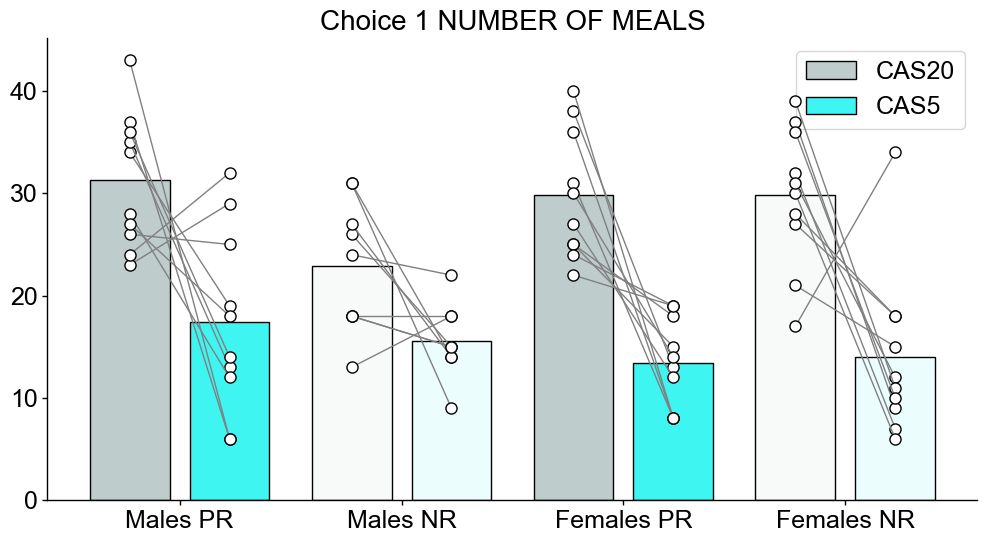

In [29]:
# Filter the data for male PR mice in choice session 1
number_of_meals_male_nr_number_of_meals_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
number_of_meals_average_number_of_meals_per_type_mnr1= number_of_meals_male_nr_number_of_meals_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_female_nr_number_of_meals_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
number_of_meals_average_number_of_meals_per_type_fnr1= number_of_meals_female_nr_number_of_meals_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_male_pr_number_of_meals_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
number_of_meals_average_number_of_meals_per_type_mpr1= number_of_meals_male_pr_number_of_meals_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_female_pr_number_of_meals_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
number_of_meals_average_number_of_meals_per_type_fpr1= number_of_meals_female_pr_number_of_meals_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_cas20_mpr1= number_of_meals_average_number_of_meals_per_type_mpr1['CAS20']
number_of_meals_cas5_mpr1= number_of_meals_average_number_of_meals_per_type_mpr1['CAS5']
number_of_meals_cas20_fpr1= number_of_meals_average_number_of_meals_per_type_fpr1['CAS20']
number_of_meals_cas5_fpr1= number_of_meals_average_number_of_meals_per_type_fpr1['CAS5']

number_of_meals_cas20_mnr1= number_of_meals_average_number_of_meals_per_type_mnr1['CAS20']
number_of_meals_cas5_mnr1= number_of_meals_average_number_of_meals_per_type_mnr1['CAS5']
number_of_meals_cas20_fnr1= number_of_meals_average_number_of_meals_per_type_fnr1['CAS20']
number_of_meals_cas5_fnr1= number_of_meals_average_number_of_meals_per_type_fnr1['CAS5']

number_of_meals_group_data_male_pr = [number_of_meals_cas20_mpr1.tolist(), number_of_meals_cas5_mpr1.tolist()]
number_of_meals_group_data_female_pr = [number_of_meals_cas20_fpr1.tolist(), number_of_meals_cas5_fpr1.tolist()]
number_of_meals_group_data_male_nr = [number_of_meals_cas20_mnr1.tolist(), number_of_meals_cas5_mnr1.tolist()]
number_of_meals_group_data_female_nr = [number_of_meals_cas20_fnr1.tolist(), number_of_meals_cas5_fnr1.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([number_of_meals_group_data_male_pr, number_of_meals_group_data_male_nr, number_of_meals_group_data_female_pr, number_of_meals_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 1 NUMBER OF MEALS")
ax.legend(barlist, ['CAS20', 'CAS5'])

# Set custom x-axis labels
number_of_meals_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(number_of_meals_group_labels)

plt.show()

#f.savefig(fig_folder + "C1_NUMBER_OF_MEALS.png")


c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


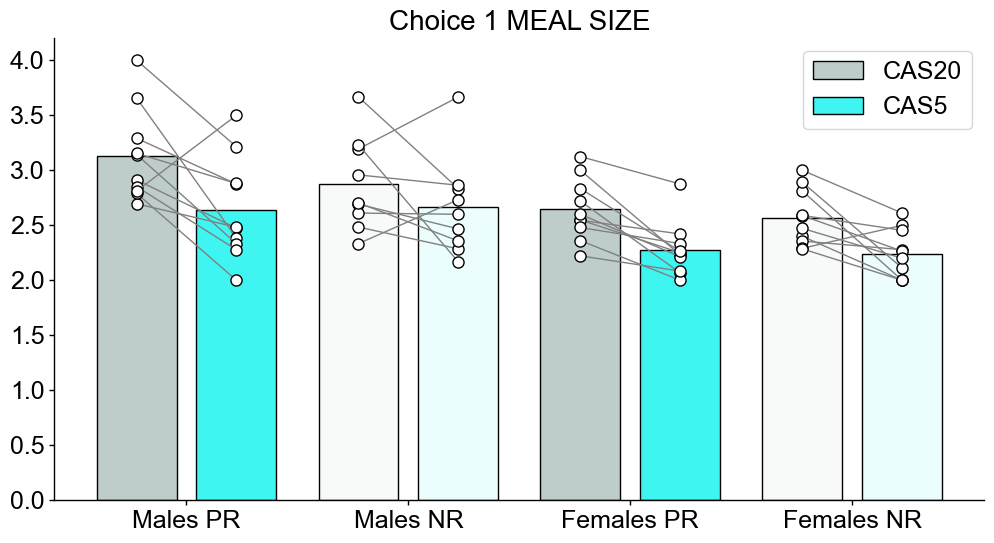

In [30]:
# Filter the data for male PR mice in choice session 1
mealsize_male_nr_mealsize_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
mealsize_average_mealsizes_per_type_mnr1= mealsize_male_nr_mealsize_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_female_nr_mealsize_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
mealsize_average_mealsizes_per_type_fnr1= mealsize_female_nr_mealsize_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_male_pr_mealsize_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
mealsize_average_mealsizes_per_type_mpr1= mealsize_male_pr_mealsize_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_female_pr_mealsize_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
mealsize_average_mealsizes_per_type_fpr1= mealsize_female_pr_mealsize_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_cas20_mpr1= mealsize_average_mealsizes_per_type_mpr1['CAS20']
mealsize_cas5_mpr1= mealsize_average_mealsizes_per_type_mpr1['CAS5']
mealsize_cas20_fpr1= mealsize_average_mealsizes_per_type_fpr1['CAS20']
mealsize_cas5_fpr1= mealsize_average_mealsizes_per_type_fpr1['CAS5']

mealsize_cas20_mnr1= mealsize_average_mealsizes_per_type_mnr1['CAS20']
mealsize_cas5_mnr1= mealsize_average_mealsizes_per_type_mnr1['CAS5']
mealsize_cas20_fnr1= mealsize_average_mealsizes_per_type_fnr1['CAS20']
mealsize_cas5_fnr1= mealsize_average_mealsizes_per_type_fnr1['CAS5']

mealsize_group_data_male_pr = [mealsize_cas20_mpr1.tolist(), mealsize_cas5_mpr1.tolist()]
mealsize_group_data_female_pr = [mealsize_cas20_fpr1.tolist(), mealsize_cas5_fpr1.tolist()]
mealsize_group_data_male_nr = [mealsize_cas20_mnr1.tolist(), mealsize_cas5_mnr1.tolist()]
mealsize_group_data_female_nr = [mealsize_cas20_fnr1.tolist(), mealsize_cas5_fnr1.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([mealsize_group_data_male_pr, mealsize_group_data_male_nr, mealsize_group_data_female_pr, mealsize_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 1 MEAL SIZE")
ax.legend(barlist, ['CAS20', 'CAS5'])

# Set custom x-axis labels
mealsize_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(mealsize_group_labels)

plt.show()

#f.savefig(fig_folder + "C1_MEAL_SIZE.png")


c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


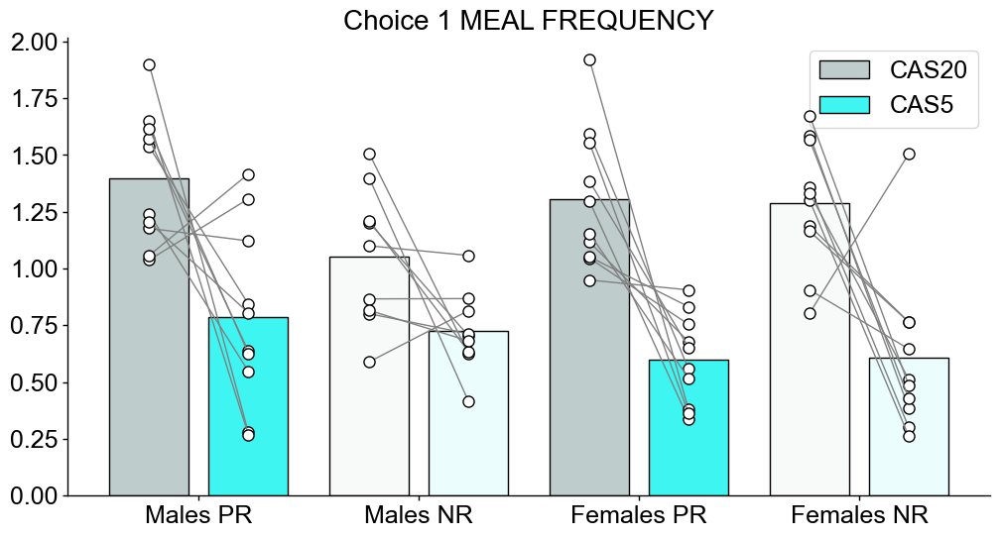

In [31]:
# Filter the data for male PR mice in choice session 1
meal_frequency_male_nr_meal_frequency_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
meal_frequency_average_meal_frequencies_per_type_mnr1= meal_frequency_male_nr_meal_frequency_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_female_nr_meal_frequency_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
meal_frequency_average_meal_frequencies_per_type_fnr1= meal_frequency_female_nr_meal_frequency_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_male_pr_meal_frequency_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
meal_frequency_average_meal_frequencies_per_type_mpr1= meal_frequency_male_pr_meal_frequency_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_female_pr_meal_frequency_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
meal_frequency_average_meal_frequencies_per_type_fpr1= meal_frequency_female_pr_meal_frequency_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_cas20_mpr1= meal_frequency_average_meal_frequencies_per_type_mpr1['CAS20']
meal_frequency_cas5_mpr1= meal_frequency_average_meal_frequencies_per_type_mpr1['CAS5']
meal_frequency_cas20_fpr1= meal_frequency_average_meal_frequencies_per_type_fpr1['CAS20']
meal_frequency_cas5_fpr1= meal_frequency_average_meal_frequencies_per_type_fpr1['CAS5']

meal_frequency_cas20_mnr1= meal_frequency_average_meal_frequencies_per_type_mnr1['CAS20']
meal_frequency_cas5_mnr1= meal_frequency_average_meal_frequencies_per_type_mnr1['CAS5']
meal_frequency_cas20_fnr1= meal_frequency_average_meal_frequencies_per_type_fnr1['CAS20']
meal_frequency_cas5_fnr1= meal_frequency_average_meal_frequencies_per_type_fnr1['CAS5']

meal_frequency_group_data_male_pr = [meal_frequency_cas20_mpr1.tolist(), meal_frequency_cas5_mpr1.tolist()]
meal_frequency_group_data_female_pr = [meal_frequency_cas20_fpr1.tolist(), meal_frequency_cas5_fpr1.tolist()]
meal_frequency_group_data_male_nr = [meal_frequency_cas20_mnr1.tolist(), meal_frequency_cas5_mnr1.tolist()]
meal_frequency_group_data_female_nr = [meal_frequency_cas20_fnr1.tolist(), meal_frequency_cas5_fnr1.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([meal_frequency_group_data_male_pr, meal_frequency_group_data_male_nr, meal_frequency_group_data_female_pr, meal_frequency_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 1 MEAL FREQUENCY")
ax.legend(barlist, ['CAS20', 'CAS5'])

# Set custom x-axis labels
meal_frequency_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(meal_frequency_group_labels)

plt.show()

#f.savefig(fig_folder + "C1_MEAL_FREQUENCY.png")


c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


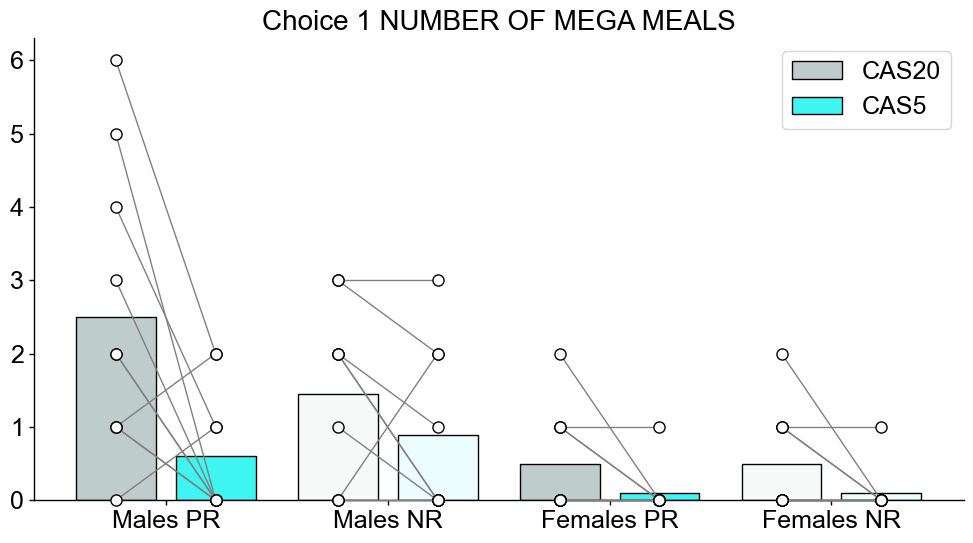

In [32]:
# Filter the data for male PR mice in choice session 1
NUMBER_OF_MEGA_MEALS_male_nr_NUMBER_OF_MEGA_MEALS_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr1= NUMBER_OF_MEGA_MEALS_male_nr_NUMBER_OF_MEGA_MEALS_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_female_nr_NUMBER_OF_MEGA_MEALS_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr1= NUMBER_OF_MEGA_MEALS_female_nr_NUMBER_OF_MEGA_MEALS_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_male_pr_NUMBER_OF_MEGA_MEALS_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr1= NUMBER_OF_MEGA_MEALS_male_pr_NUMBER_OF_MEGA_MEALS_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_female_pr_NUMBER_OF_MEGA_MEALS_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr1= NUMBER_OF_MEGA_MEALS_female_pr_NUMBER_OF_MEGA_MEALS_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_cas20_mpr1= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr1['CAS20']
NUMBER_OF_MEGA_MEALS_cas5_mpr1= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr1['CAS5']
NUMBER_OF_MEGA_MEALS_cas20_fpr1= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr1['CAS20']
NUMBER_OF_MEGA_MEALS_cas5_fpr1= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr1['CAS5']

NUMBER_OF_MEGA_MEALS_cas20_mnr1= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr1['CAS20']
NUMBER_OF_MEGA_MEALS_cas5_mnr1= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr1['CAS5']
NUMBER_OF_MEGA_MEALS_cas20_fnr1= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr1['CAS20']
NUMBER_OF_MEGA_MEALS_cas5_fnr1= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr1['CAS5']

NUMBER_OF_MEGA_MEALS_group_data_male_pr = [NUMBER_OF_MEGA_MEALS_cas20_mpr1.tolist(), NUMBER_OF_MEGA_MEALS_cas5_mpr1.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_female_pr = [NUMBER_OF_MEGA_MEALS_cas20_fpr1.tolist(), NUMBER_OF_MEGA_MEALS_cas5_fpr1.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_male_nr = [NUMBER_OF_MEGA_MEALS_cas20_mnr1.tolist(), NUMBER_OF_MEGA_MEALS_cas5_mnr1.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_female_nr = [NUMBER_OF_MEGA_MEALS_cas20_fnr1.tolist(), NUMBER_OF_MEGA_MEALS_cas5_fnr1.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([NUMBER_OF_MEGA_MEALS_group_data_male_pr, NUMBER_OF_MEGA_MEALS_group_data_male_nr, NUMBER_OF_MEGA_MEALS_group_data_female_pr, NUMBER_OF_MEGA_MEALS_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 1 NUMBER OF MEGA MEALS")
ax.legend(barlist, ['CAS20', 'CAS5'])

# Set custom x-axis labels
NUMBER_OF_MEGA_MEALS_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(NUMBER_OF_MEGA_MEALS_group_labels)

plt.show()

#f.savefig(fig_folder + "C1_NUMBER_OF_MEGA_MEALS.png")


c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


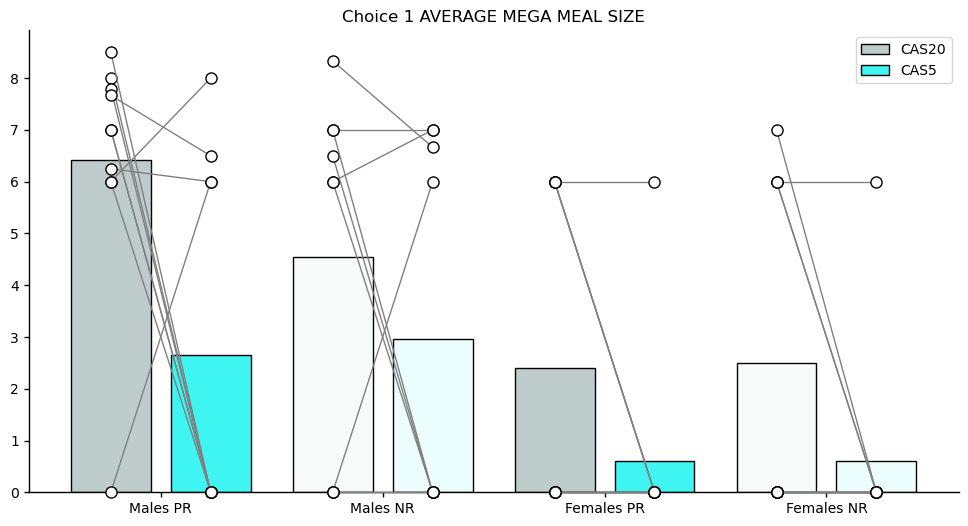

In [8]:
# Filter the data for male PR mice in choice session 1
AVERAGE_MEGA_MEAL_SIZE_male_nr_AVERAGE_MEGA_MEAL_SIZE_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr1= AVERAGE_MEGA_MEAL_SIZE_male_nr_AVERAGE_MEGA_MEAL_SIZE_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_female_nr_AVERAGE_MEGA_MEAL_SIZE_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr1= AVERAGE_MEGA_MEAL_SIZE_female_nr_AVERAGE_MEGA_MEAL_SIZE_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_male_pr_AVERAGE_MEGA_MEAL_SIZE_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr1= AVERAGE_MEGA_MEAL_SIZE_male_pr_AVERAGE_MEGA_MEAL_SIZE_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_female_pr_AVERAGE_MEGA_MEAL_SIZE_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr1= AVERAGE_MEGA_MEAL_SIZE_female_pr_AVERAGE_MEGA_MEAL_SIZE_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_cas20_mpr1= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr1['CAS20']
AVERAGE_MEGA_MEAL_SIZE_cas5_mpr1= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr1['CAS5']
AVERAGE_MEGA_MEAL_SIZE_cas20_fpr1= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr1['CAS20']
AVERAGE_MEGA_MEAL_SIZE_cas5_fpr1= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr1['CAS5']

AVERAGE_MEGA_MEAL_SIZE_cas20_mnr1= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr1['CAS20']
AVERAGE_MEGA_MEAL_SIZE_cas5_mnr1= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr1['CAS5']
AVERAGE_MEGA_MEAL_SIZE_cas20_fnr1= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr1['CAS20']
AVERAGE_MEGA_MEAL_SIZE_cas5_fnr1= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr1['CAS5']

AVERAGE_MEGA_MEAL_SIZE_group_data_male_pr = [AVERAGE_MEGA_MEAL_SIZE_cas20_mpr1.tolist(), AVERAGE_MEGA_MEAL_SIZE_cas5_mpr1.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_female_pr = [AVERAGE_MEGA_MEAL_SIZE_cas20_fpr1.tolist(), AVERAGE_MEGA_MEAL_SIZE_cas5_fpr1.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_male_nr = [AVERAGE_MEGA_MEAL_SIZE_cas20_mnr1.tolist(), AVERAGE_MEGA_MEAL_SIZE_cas5_mnr1.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_female_nr = [AVERAGE_MEGA_MEAL_SIZE_cas20_fnr1.tolist(), AVERAGE_MEGA_MEAL_SIZE_cas5_fnr1.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([AVERAGE_MEGA_MEAL_SIZE_group_data_male_pr, AVERAGE_MEGA_MEAL_SIZE_group_data_male_nr, AVERAGE_MEGA_MEAL_SIZE_group_data_female_pr, AVERAGE_MEGA_MEAL_SIZE_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 1 AVERAGE MEGA MEAL SIZE")
ax.legend(barlist, ['CAS20', 'CAS5'])

# Set custom x-axis labels
AVERAGE_MEGA_MEAL_SIZE_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(AVERAGE_MEGA_MEAL_SIZE_group_labels)

plt.show()

#f.savefig(fig_folder + "C1_AVERAGE_MEGA_MEAL_SIZE.png")


c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


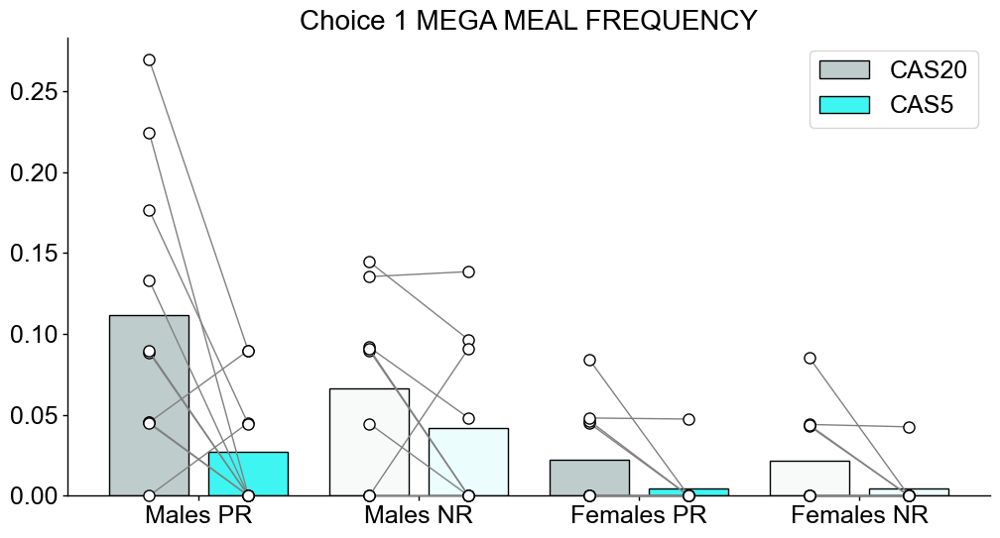

In [33]:
# Filter the data for male PR mice in choice session 1
MEGA_MEAL_FREQUENCY_male_nr_MEGA_MEAL_FREQUENCY_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr1= MEGA_MEAL_FREQUENCY_male_nr_MEGA_MEAL_FREQUENCY_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_female_nr_MEGA_MEAL_FREQUENCY_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr1= MEGA_MEAL_FREQUENCY_female_nr_MEGA_MEAL_FREQUENCY_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_male_pr_MEGA_MEAL_FREQUENCY_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr1= MEGA_MEAL_FREQUENCY_male_pr_MEGA_MEAL_FREQUENCY_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_female_pr_MEGA_MEAL_FREQUENCY_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr1= MEGA_MEAL_FREQUENCY_female_pr_MEGA_MEAL_FREQUENCY_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_cas20_mpr1= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr1['CAS20']
MEGA_MEAL_FREQUENCY_cas5_mpr1= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr1['CAS5']
MEGA_MEAL_FREQUENCY_cas20_fpr1= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr1['CAS20']
MEGA_MEAL_FREQUENCY_cas5_fpr1= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr1['CAS5']

MEGA_MEAL_FREQUENCY_cas20_mnr1= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr1['CAS20']
MEGA_MEAL_FREQUENCY_cas5_mnr1= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr1['CAS5']
MEGA_MEAL_FREQUENCY_cas20_fnr1= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr1['CAS20']
MEGA_MEAL_FREQUENCY_cas5_fnr1= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr1['CAS5']

MEGA_MEAL_FREQUENCY_group_data_male_pr = [MEGA_MEAL_FREQUENCY_cas20_mpr1.tolist(), MEGA_MEAL_FREQUENCY_cas5_mpr1.tolist()]
MEGA_MEAL_FREQUENCY_group_data_female_pr = [MEGA_MEAL_FREQUENCY_cas20_fpr1.tolist(), MEGA_MEAL_FREQUENCY_cas5_fpr1.tolist()]
MEGA_MEAL_FREQUENCY_group_data_male_nr = [MEGA_MEAL_FREQUENCY_cas20_mnr1.tolist(), MEGA_MEAL_FREQUENCY_cas5_mnr1.tolist()]
MEGA_MEAL_FREQUENCY_group_data_female_nr = [MEGA_MEAL_FREQUENCY_cas20_fnr1.tolist(), MEGA_MEAL_FREQUENCY_cas5_fnr1.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([MEGA_MEAL_FREQUENCY_group_data_male_pr, MEGA_MEAL_FREQUENCY_group_data_male_nr, MEGA_MEAL_FREQUENCY_group_data_female_pr, MEGA_MEAL_FREQUENCY_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 1 MEGA MEAL FREQUENCY")
ax.legend(barlist, ['CAS20', 'CAS5'])

# Set custom x-axis labels
MEGA_MEAL_FREQUENCY_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(MEGA_MEAL_FREQUENCY_group_labels)

plt.show()

#f.savefig(fig_folder + "C1_MEGA_MEAL_FREQUENCY.png")


<a id="Choice_1_SNACK_COMPONENT"></a>
## Choice_1_SNACK_COMPONENT

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


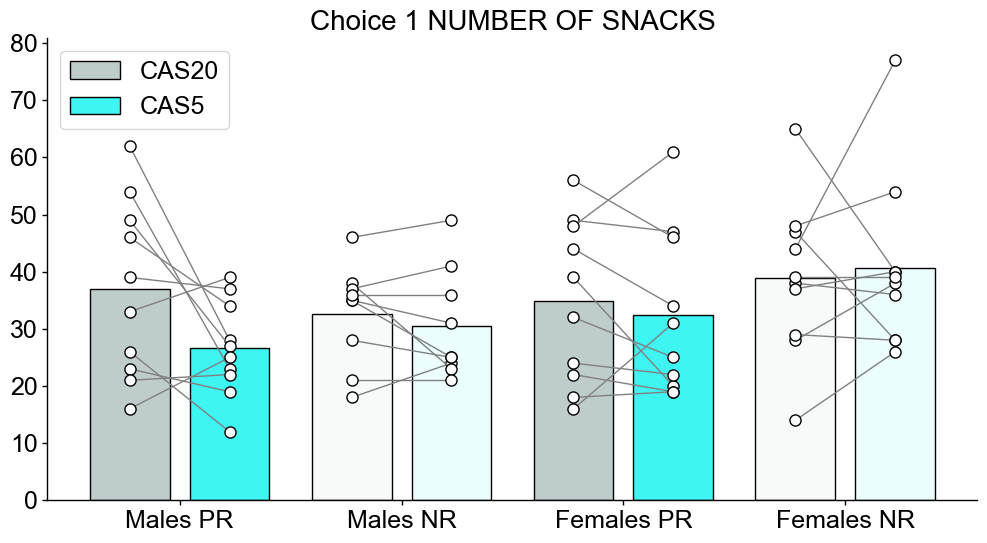

In [36]:
# Filter the data for male PR mice in choice session 1
NUMBER_OF_SNACKS_male_nr_NUMBER_OF_SNACKS_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr1= NUMBER_OF_SNACKS_male_nr_NUMBER_OF_SNACKS_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_female_nr_NUMBER_OF_SNACKS_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr1= NUMBER_OF_SNACKS_female_nr_NUMBER_OF_SNACKS_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_male_pr_NUMBER_OF_SNACKS_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr1= NUMBER_OF_SNACKS_male_pr_NUMBER_OF_SNACKS_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_female_pr_NUMBER_OF_SNACKS_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr1= NUMBER_OF_SNACKS_female_pr_NUMBER_OF_SNACKS_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_cas20_mpr1= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr1['CAS20']
NUMBER_OF_SNACKS_cas5_mpr1= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr1['CAS5']
NUMBER_OF_SNACKS_cas20_fpr1= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr1['CAS20']
NUMBER_OF_SNACKS_cas5_fpr1= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr1['CAS5']

NUMBER_OF_SNACKS_cas20_mnr1= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr1['CAS20']
NUMBER_OF_SNACKS_cas5_mnr1= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr1['CAS5']
NUMBER_OF_SNACKS_cas20_fnr1= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr1['CAS20']
NUMBER_OF_SNACKS_cas5_fnr1= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr1['CAS5']

NUMBER_OF_SNACKS_group_data_male_pr = [NUMBER_OF_SNACKS_cas20_mpr1.tolist(), NUMBER_OF_SNACKS_cas5_mpr1.tolist()]
NUMBER_OF_SNACKS_group_data_female_pr = [NUMBER_OF_SNACKS_cas20_fpr1.tolist(), NUMBER_OF_SNACKS_cas5_fpr1.tolist()]
NUMBER_OF_SNACKS_group_data_male_nr = [NUMBER_OF_SNACKS_cas20_mnr1.tolist(), NUMBER_OF_SNACKS_cas5_mnr1.tolist()]
NUMBER_OF_SNACKS_group_data_female_nr = [NUMBER_OF_SNACKS_cas20_fnr1.tolist(), NUMBER_OF_SNACKS_cas5_fnr1.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([NUMBER_OF_SNACKS_group_data_male_pr, NUMBER_OF_SNACKS_group_data_male_nr, NUMBER_OF_SNACKS_group_data_female_pr, NUMBER_OF_SNACKS_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 1 NUMBER OF SNACKS")
ax.legend(barlist, ['CAS20', 'CAS5'])

# Set custom x-axis labels
NUMBER_OF_SNACKS_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(NUMBER_OF_SNACKS_group_labels)

plt.show()

#f.savefig(fig_folder + "C1_NUMBER_OF_SNACKS.png")


c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


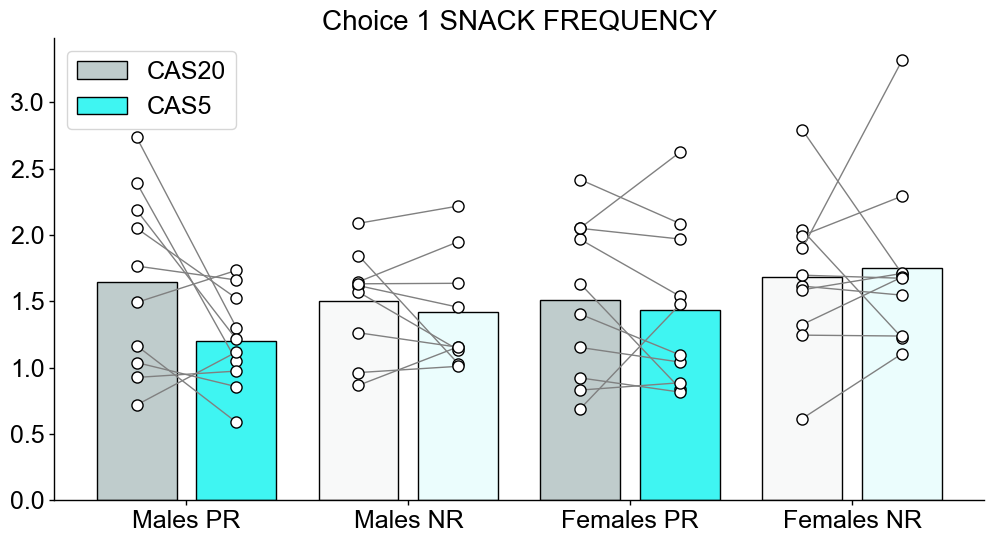

In [35]:
# Filter the data for male PR mice in choice session 1
SNACK_FREQUENCY_male_nr_SNACK_FREQUENCY_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr1= SNACK_FREQUENCY_male_nr_SNACK_FREQUENCY_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_female_nr_SNACK_FREQUENCY_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'NR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr1= SNACK_FREQUENCY_female_nr_SNACK_FREQUENCY_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_male_pr_SNACK_FREQUENCY_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr1= SNACK_FREQUENCY_male_pr_SNACK_FREQUENCY_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_female_pr_SNACK_FREQUENCY_C1 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 1) & (data['DIET'] == 'PR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr1= SNACK_FREQUENCY_female_pr_SNACK_FREQUENCY_C1.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_cas20_mpr1= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr1['CAS20']
SNACK_FREQUENCY_cas5_mpr1= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr1['CAS5']
SNACK_FREQUENCY_cas20_fpr1= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr1['CAS20']
SNACK_FREQUENCY_cas5_fpr1= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr1['CAS5']

SNACK_FREQUENCY_cas20_mnr1= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr1['CAS20']
SNACK_FREQUENCY_cas5_mnr1= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr1['CAS5']
SNACK_FREQUENCY_cas20_fnr1= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr1['CAS20']
SNACK_FREQUENCY_cas5_fnr1= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr1['CAS5']

SNACK_FREQUENCY_group_data_male_pr = [SNACK_FREQUENCY_cas20_mpr1.tolist(), SNACK_FREQUENCY_cas5_mpr1.tolist()]
SNACK_FREQUENCY_group_data_female_pr = [SNACK_FREQUENCY_cas20_fpr1.tolist(), SNACK_FREQUENCY_cas5_fpr1.tolist()]
SNACK_FREQUENCY_group_data_male_nr = [SNACK_FREQUENCY_cas20_mnr1.tolist(), SNACK_FREQUENCY_cas5_mnr1.tolist()]
SNACK_FREQUENCY_group_data_female_nr = [SNACK_FREQUENCY_cas20_fnr1.tolist(), SNACK_FREQUENCY_cas5_fnr1.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([SNACK_FREQUENCY_group_data_male_pr, SNACK_FREQUENCY_group_data_male_nr, SNACK_FREQUENCY_group_data_female_pr, SNACK_FREQUENCY_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 1 SNACK FREQUENCY")
ax.legend(barlist, ['CAS20', 'CAS5'])

# Set custom x-axis labels
SNACK_FREQUENCY_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(SNACK_FREQUENCY_group_labels)

plt.show()

#f.savefig(fig_folder + "C1_SNACK_FREQUENCY.png")


<a id="Choice_2_MEAL_COMPONENT"></a>
## Choice_2_MEAL_COMPONENT

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


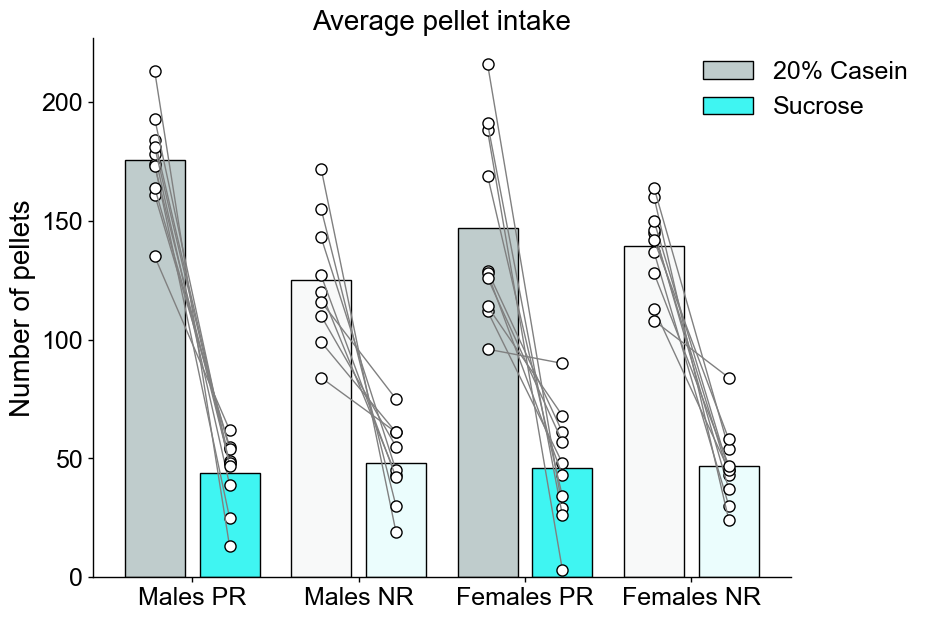

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


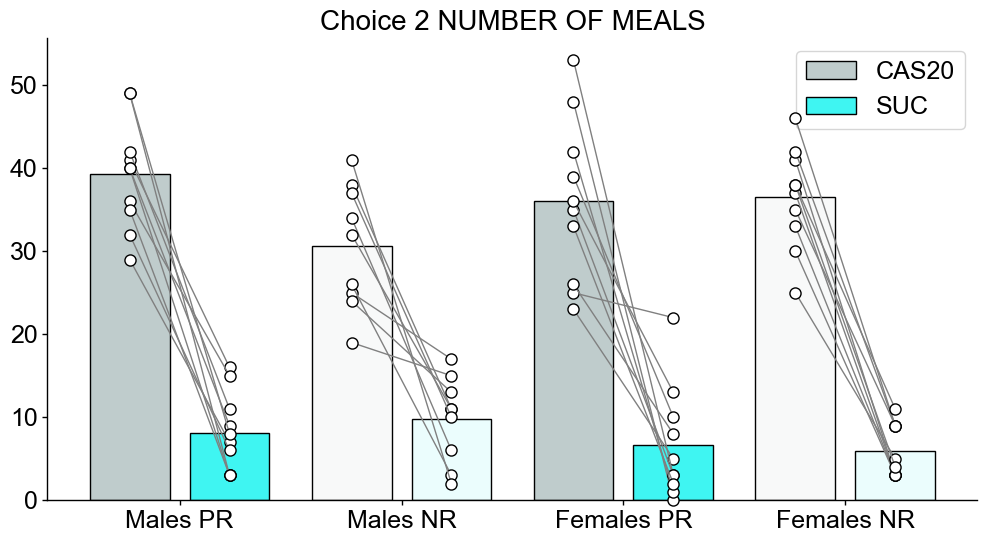

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


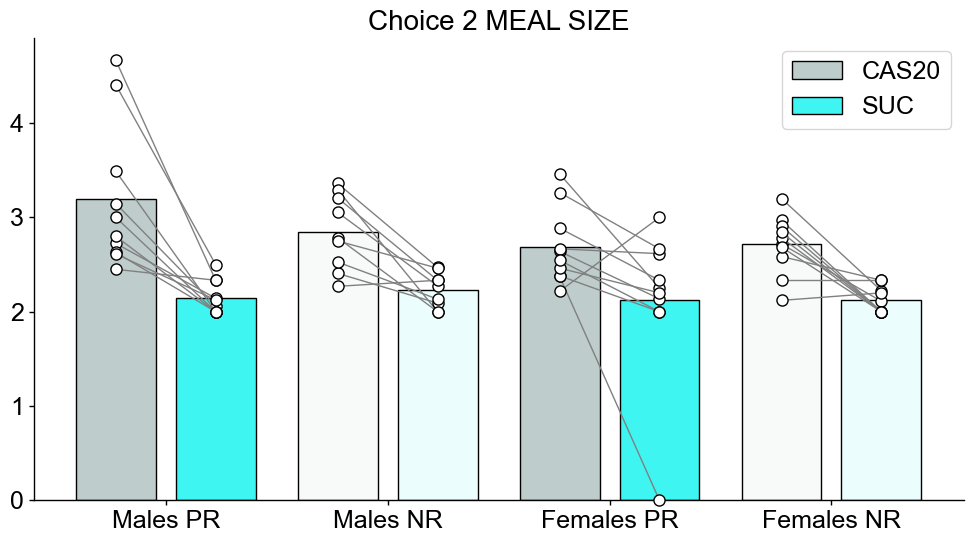

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


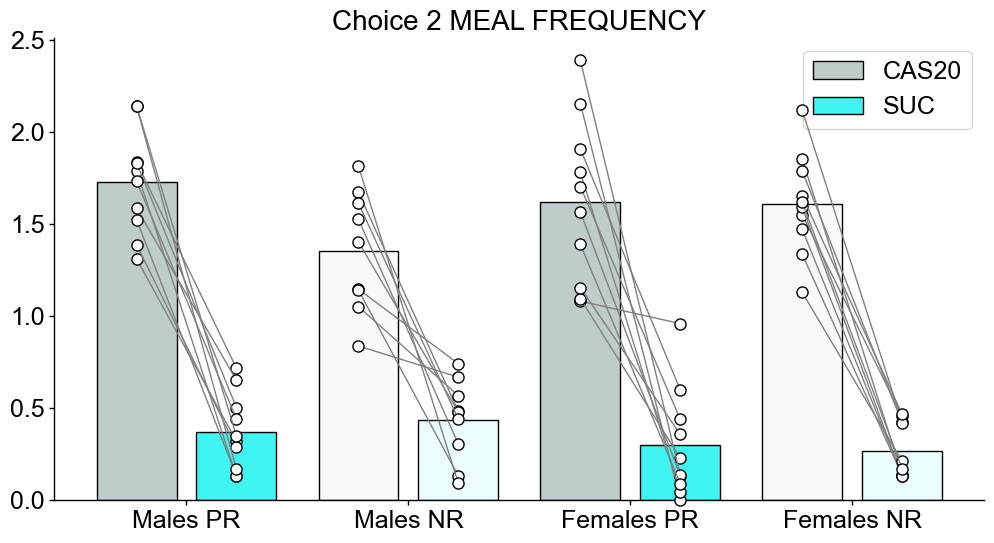

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


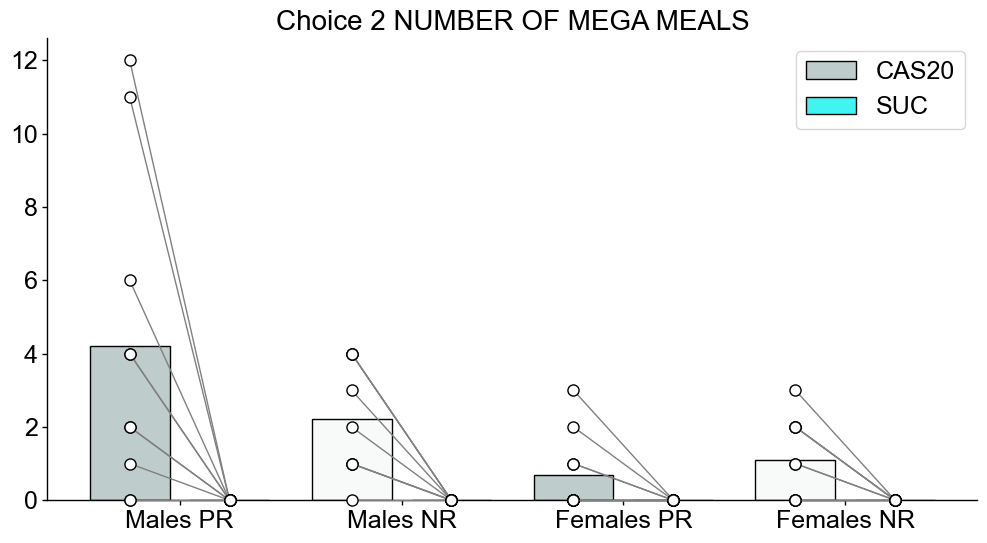

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


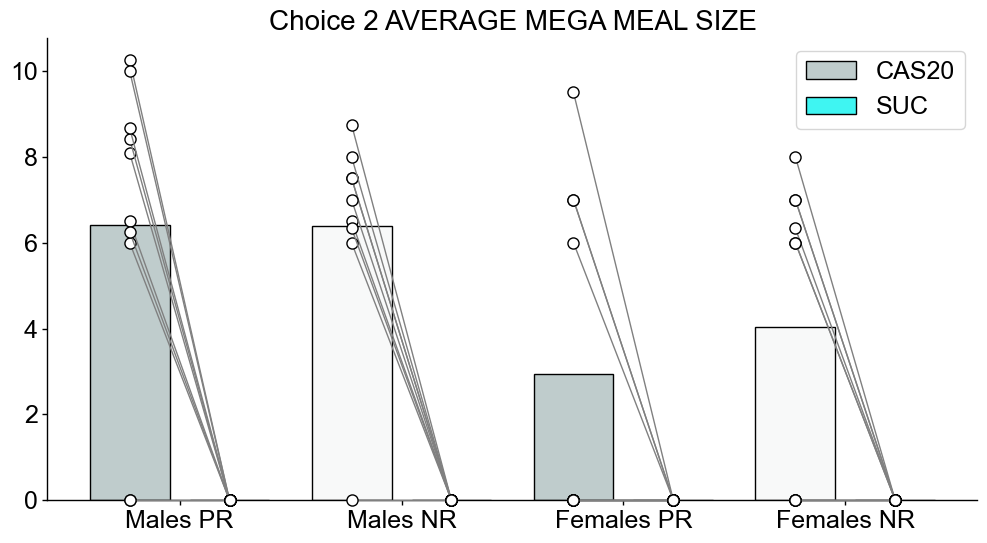

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


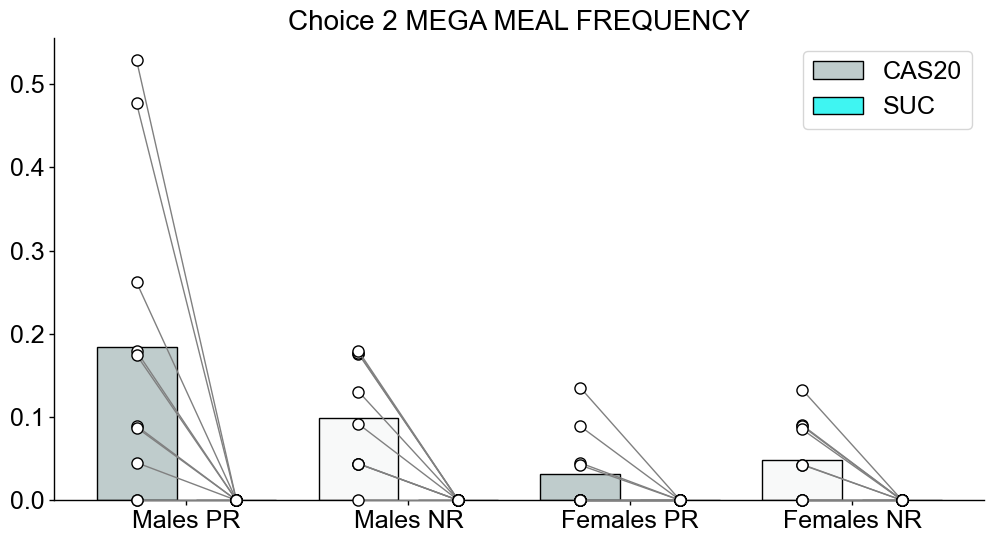

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


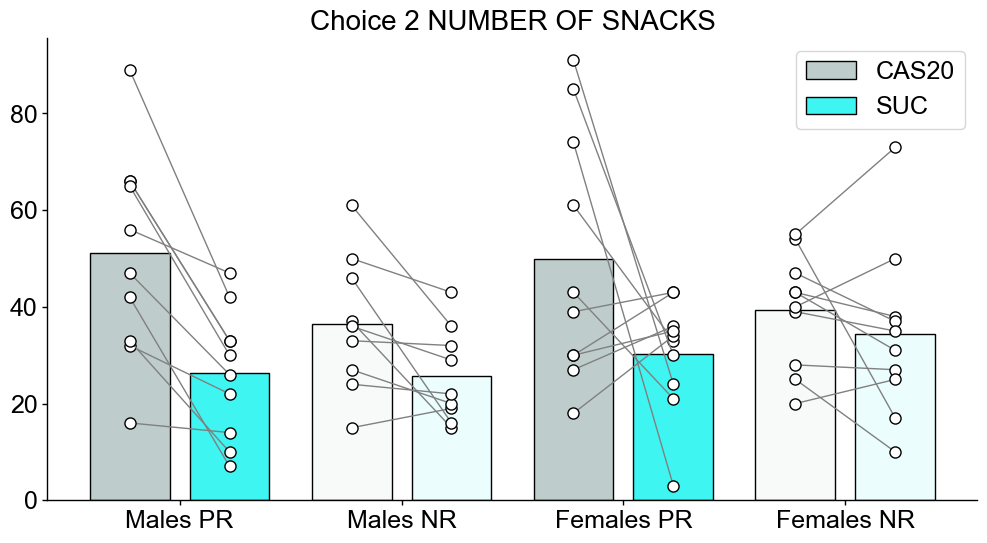

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


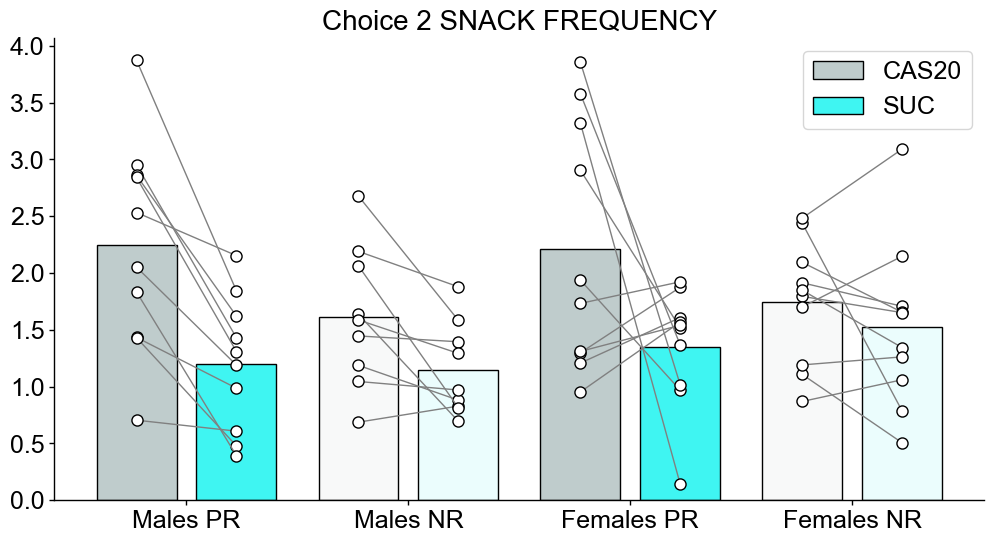

In [49]:
fig_folder = r"../plots/FINAL_PLOTS_FOR_FENS24/C2/"


# Filter the data for male PR mice in choice session 2
pellet_count_male_nr_pellet_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
pellet_count_average_pellets_per_type_mnr2= pellet_count_male_nr_pellet_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_female_nr_pellet_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
pellet_count_average_pellets_per_type_fnr2= pellet_count_female_nr_pellet_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_male_pr_pellet_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
pellet_count_average_pellets_per_type_mpr2= pellet_count_male_pr_pellet_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_female_pr_pellet_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
pellet_count_average_pellets_per_type_fpr2= pellet_count_female_pr_pellet_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_cas20_mpr2= pellet_count_average_pellets_per_type_mpr2['CAS20']
pellet_count_suc_mpr2= pellet_count_average_pellets_per_type_mpr2['SUC']
pellet_count_cas20_fpr2= pellet_count_average_pellets_per_type_fpr2['CAS20']
pellet_count_suc_fpr2= pellet_count_average_pellets_per_type_fpr2['SUC']

pellet_count_cas20_mnr2= pellet_count_average_pellets_per_type_mnr2['CAS20']
pellet_count_suc_mnr2= pellet_count_average_pellets_per_type_mnr2['SUC']
pellet_count_cas20_fnr2= pellet_count_average_pellets_per_type_fnr2['CAS20']
pellet_count_suc_fnr2= pellet_count_average_pellets_per_type_fnr2['SUC']

pellet_count_group_data_male_pr = [pellet_count_cas20_mpr2.tolist(), pellet_count_suc_mpr2.tolist()]
pellet_count_group_data_female_pr = [pellet_count_cas20_fpr2.tolist(), pellet_count_suc_fpr2.tolist()]
pellet_count_group_data_male_nr = [pellet_count_cas20_mnr2.tolist(), pellet_count_suc_mnr2.tolist()]
pellet_count_group_data_female_nr = [pellet_count_cas20_fnr2.tolist(), pellet_count_suc_fnr2.tolist()]

# Plotting using barscatter
# Define the color values
high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(9,7))
_, _, barlist, _ = tp.barscatter([pellet_count_group_data_male_pr, pellet_count_group_data_male_nr, pellet_count_group_data_female_pr, pellet_count_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Average pellet intake")
ax.legend(barlist, ['20% Casein', 'Sucrose'], frameon= False, bbox_to_anchor= (1.2,1))
ax.set_ylabel("Number of pellets")

# Set custom x-axis labels
pellet_count_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(pellet_count_group_labels)
f.savefig(fig_folder + "C2_PELLET_INTAKE.pdf", bbox_inches="tight")
plt.show()

#f.savefig(fig_folder + "C2_PELLET_INTAKE.png")



# Filter the data for male PR mice in choice session 2
number_of_meals_male_nr_number_of_meals_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
number_of_meals_average_number_of_meals_per_type_mnr2= number_of_meals_male_nr_number_of_meals_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_female_nr_number_of_meals_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
number_of_meals_average_number_of_meals_per_type_fnr2= number_of_meals_female_nr_number_of_meals_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_male_pr_number_of_meals_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
number_of_meals_average_number_of_meals_per_type_mpr2= number_of_meals_male_pr_number_of_meals_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_female_pr_number_of_meals_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
number_of_meals_average_number_of_meals_per_type_fpr2= number_of_meals_female_pr_number_of_meals_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_cas20_mpr2= number_of_meals_average_number_of_meals_per_type_mpr2['CAS20']
number_of_meals_suc_mpr2= number_of_meals_average_number_of_meals_per_type_mpr2['SUC']
number_of_meals_cas20_fpr2= number_of_meals_average_number_of_meals_per_type_fpr2['CAS20']
number_of_meals_suc_fpr2= number_of_meals_average_number_of_meals_per_type_fpr2['SUC']

number_of_meals_cas20_mnr2= number_of_meals_average_number_of_meals_per_type_mnr2['CAS20']
number_of_meals_suc_mnr2= number_of_meals_average_number_of_meals_per_type_mnr2['SUC']
number_of_meals_cas20_fnr2= number_of_meals_average_number_of_meals_per_type_fnr2['CAS20']
number_of_meals_suc_fnr2= number_of_meals_average_number_of_meals_per_type_fnr2['SUC']

number_of_meals_group_data_male_pr = [number_of_meals_cas20_mpr2.tolist(), number_of_meals_suc_mpr2.tolist()]
number_of_meals_group_data_female_pr = [number_of_meals_cas20_fpr2.tolist(), number_of_meals_suc_fpr2.tolist()]
number_of_meals_group_data_male_nr = [number_of_meals_cas20_mnr2.tolist(), number_of_meals_suc_mnr2.tolist()]
number_of_meals_group_data_female_nr = [number_of_meals_cas20_fnr2.tolist(), number_of_meals_suc_fnr2.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([number_of_meals_group_data_male_pr, number_of_meals_group_data_male_nr, number_of_meals_group_data_female_pr, number_of_meals_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 NUMBER OF MEALS")
ax.legend(barlist, ['CAS20', 'SUC'])

# Set custom x-axis labels
number_of_meals_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(number_of_meals_group_labels)

plt.show()

#f.savefig(fig_folder + "C2_NUMBER_OF_MEALS.png")



# Filter the data for male PR mice in choice session 2
mealsize_male_nr_mealsize_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
mealsize_average_mealsizes_per_type_mnr2= mealsize_male_nr_mealsize_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_female_nr_mealsize_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
mealsize_average_mealsizes_per_type_fnr2= mealsize_female_nr_mealsize_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_male_pr_mealsize_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
mealsize_average_mealsizes_per_type_mpr2= mealsize_male_pr_mealsize_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_female_pr_mealsize_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
mealsize_average_mealsizes_per_type_fpr2= mealsize_female_pr_mealsize_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_cas20_mpr2= mealsize_average_mealsizes_per_type_mpr2['CAS20']
mealsize_suc_mpr2= mealsize_average_mealsizes_per_type_mpr2['SUC']
mealsize_cas20_fpr2= mealsize_average_mealsizes_per_type_fpr2['CAS20']
mealsize_suc_fpr2= mealsize_average_mealsizes_per_type_fpr2['SUC']

mealsize_cas20_mnr2= mealsize_average_mealsizes_per_type_mnr2['CAS20']
mealsize_suc_mnr2= mealsize_average_mealsizes_per_type_mnr2['SUC']
mealsize_cas20_fnr2= mealsize_average_mealsizes_per_type_fnr2['CAS20']
mealsize_suc_fnr2= mealsize_average_mealsizes_per_type_fnr2['SUC']

mealsize_group_data_male_pr = [mealsize_cas20_mpr2.tolist(), mealsize_suc_mpr2.tolist()]
mealsize_group_data_female_pr = [mealsize_cas20_fpr2.tolist(), mealsize_suc_fpr2.tolist()]
mealsize_group_data_male_nr = [mealsize_cas20_mnr2.tolist(), mealsize_suc_mnr2.tolist()]
mealsize_group_data_female_nr = [mealsize_cas20_fnr2.tolist(), mealsize_suc_fnr2.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([mealsize_group_data_male_pr, mealsize_group_data_male_nr, mealsize_group_data_female_pr, mealsize_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 MEAL SIZE")
ax.legend(barlist, ['CAS20', 'SUC'])

# Set custom x-axis labels
mealsize_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(mealsize_group_labels)

plt.show()

#f.savefig(fig_folder + "C2_MEAL_SIZE.png")



# Filter the data for male PR mice in choice session 2
meal_frequency_male_nr_meal_frequency_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
meal_frequency_average_meal_frequencies_per_type_mnr2= meal_frequency_male_nr_meal_frequency_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_female_nr_meal_frequency_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
meal_frequency_average_meal_frequencies_per_type_fnr2= meal_frequency_female_nr_meal_frequency_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_male_pr_meal_frequency_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
meal_frequency_average_meal_frequencies_per_type_mpr2= meal_frequency_male_pr_meal_frequency_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_female_pr_meal_frequency_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
meal_frequency_average_meal_frequencies_per_type_fpr2= meal_frequency_female_pr_meal_frequency_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_cas20_mpr2= meal_frequency_average_meal_frequencies_per_type_mpr2['CAS20']
meal_frequency_suc_mpr2= meal_frequency_average_meal_frequencies_per_type_mpr2['SUC']
meal_frequency_cas20_fpr2= meal_frequency_average_meal_frequencies_per_type_fpr2['CAS20']
meal_frequency_suc_fpr2= meal_frequency_average_meal_frequencies_per_type_fpr2['SUC']

meal_frequency_cas20_mnr2= meal_frequency_average_meal_frequencies_per_type_mnr2['CAS20']
meal_frequency_suc_mnr2= meal_frequency_average_meal_frequencies_per_type_mnr2['SUC']
meal_frequency_cas20_fnr2= meal_frequency_average_meal_frequencies_per_type_fnr2['CAS20']
meal_frequency_suc_fnr2= meal_frequency_average_meal_frequencies_per_type_fnr2['SUC']

meal_frequency_group_data_male_pr = [meal_frequency_cas20_mpr2.tolist(), meal_frequency_suc_mpr2.tolist()]
meal_frequency_group_data_female_pr = [meal_frequency_cas20_fpr2.tolist(), meal_frequency_suc_fpr2.tolist()]
meal_frequency_group_data_male_nr = [meal_frequency_cas20_mnr2.tolist(), meal_frequency_suc_mnr2.tolist()]
meal_frequency_group_data_female_nr = [meal_frequency_cas20_fnr2.tolist(), meal_frequency_suc_fnr2.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([meal_frequency_group_data_male_pr, meal_frequency_group_data_male_nr, meal_frequency_group_data_female_pr, meal_frequency_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 MEAL FREQUENCY")
ax.legend(barlist, ['CAS20', 'SUC'])

# Set custom x-axis labels
meal_frequency_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(meal_frequency_group_labels)

plt.show()

#f.savefig(fig_folder + "C2_MEAL_FREQUENCY.png")



# Filter the data for male PR mice in choice session 2
NUMBER_OF_MEGA_MEALS_male_nr_NUMBER_OF_MEGA_MEALS_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr2= NUMBER_OF_MEGA_MEALS_male_nr_NUMBER_OF_MEGA_MEALS_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_female_nr_NUMBER_OF_MEGA_MEALS_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr2= NUMBER_OF_MEGA_MEALS_female_nr_NUMBER_OF_MEGA_MEALS_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_male_pr_NUMBER_OF_MEGA_MEALS_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr2= NUMBER_OF_MEGA_MEALS_male_pr_NUMBER_OF_MEGA_MEALS_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_female_pr_NUMBER_OF_MEGA_MEALS_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr2= NUMBER_OF_MEGA_MEALS_female_pr_NUMBER_OF_MEGA_MEALS_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_cas20_mpr2= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr2['CAS20']
NUMBER_OF_MEGA_MEALS_suc_mpr2= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr2['SUC']
NUMBER_OF_MEGA_MEALS_cas20_fpr2= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr2['CAS20']
NUMBER_OF_MEGA_MEALS_suc_fpr2= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr2['SUC']

NUMBER_OF_MEGA_MEALS_cas20_mnr2= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr2['CAS20']
NUMBER_OF_MEGA_MEALS_suc_mnr2= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr2['SUC']
NUMBER_OF_MEGA_MEALS_cas20_fnr2= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr2['CAS20']
NUMBER_OF_MEGA_MEALS_suc_fnr2= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr2['SUC']

NUMBER_OF_MEGA_MEALS_group_data_male_pr = [NUMBER_OF_MEGA_MEALS_cas20_mpr2.tolist(), NUMBER_OF_MEGA_MEALS_suc_mpr2.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_female_pr = [NUMBER_OF_MEGA_MEALS_cas20_fpr2.tolist(), NUMBER_OF_MEGA_MEALS_suc_fpr2.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_male_nr = [NUMBER_OF_MEGA_MEALS_cas20_mnr2.tolist(), NUMBER_OF_MEGA_MEALS_suc_mnr2.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_female_nr = [NUMBER_OF_MEGA_MEALS_cas20_fnr2.tolist(), NUMBER_OF_MEGA_MEALS_suc_fnr2.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([NUMBER_OF_MEGA_MEALS_group_data_male_pr, NUMBER_OF_MEGA_MEALS_group_data_male_nr, NUMBER_OF_MEGA_MEALS_group_data_female_pr, NUMBER_OF_MEGA_MEALS_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 NUMBER OF MEGA MEALS")
ax.legend(barlist, ['CAS20', 'SUC'])

# Set custom x-axis labels
NUMBER_OF_MEGA_MEALS_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(NUMBER_OF_MEGA_MEALS_group_labels)

plt.show()

#f.savefig(fig_folder + "C2_NUMBER_OF_MEGA_MEALS.png")



# Filter the data for male PR mice in choice session 2
AVERAGE_MEGA_MEAL_SIZE_male_nr_AVERAGE_MEGA_MEAL_SIZE_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr2= AVERAGE_MEGA_MEAL_SIZE_male_nr_AVERAGE_MEGA_MEAL_SIZE_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_female_nr_AVERAGE_MEGA_MEAL_SIZE_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr2= AVERAGE_MEGA_MEAL_SIZE_female_nr_AVERAGE_MEGA_MEAL_SIZE_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_male_pr_AVERAGE_MEGA_MEAL_SIZE_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr2= AVERAGE_MEGA_MEAL_SIZE_male_pr_AVERAGE_MEGA_MEAL_SIZE_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_female_pr_AVERAGE_MEGA_MEAL_SIZE_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr2= AVERAGE_MEGA_MEAL_SIZE_female_pr_AVERAGE_MEGA_MEAL_SIZE_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_cas20_mpr2= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr2['CAS20']
AVERAGE_MEGA_MEAL_SIZE_suc_mpr2= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr2['SUC']
AVERAGE_MEGA_MEAL_SIZE_cas20_fpr2= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr2['CAS20']
AVERAGE_MEGA_MEAL_SIZE_suc_fpr2= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr2['SUC']

AVERAGE_MEGA_MEAL_SIZE_cas20_mnr2= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr2['CAS20']
AVERAGE_MEGA_MEAL_SIZE_suc_mnr2= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr2['SUC']
AVERAGE_MEGA_MEAL_SIZE_cas20_fnr2= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr2['CAS20']
AVERAGE_MEGA_MEAL_SIZE_suc_fnr2= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr2['SUC']

AVERAGE_MEGA_MEAL_SIZE_group_data_male_pr = [AVERAGE_MEGA_MEAL_SIZE_cas20_mpr2.tolist(), AVERAGE_MEGA_MEAL_SIZE_suc_mpr2.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_female_pr = [AVERAGE_MEGA_MEAL_SIZE_cas20_fpr2.tolist(), AVERAGE_MEGA_MEAL_SIZE_suc_fpr2.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_male_nr = [AVERAGE_MEGA_MEAL_SIZE_cas20_mnr2.tolist(), AVERAGE_MEGA_MEAL_SIZE_suc_mnr2.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_female_nr = [AVERAGE_MEGA_MEAL_SIZE_cas20_fnr2.tolist(), AVERAGE_MEGA_MEAL_SIZE_suc_fnr2.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([AVERAGE_MEGA_MEAL_SIZE_group_data_male_pr, AVERAGE_MEGA_MEAL_SIZE_group_data_male_nr, AVERAGE_MEGA_MEAL_SIZE_group_data_female_pr, AVERAGE_MEGA_MEAL_SIZE_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 AVERAGE MEGA MEAL SIZE")
ax.legend(barlist, ['CAS20', 'SUC'])

# Set custom x-axis labels
AVERAGE_MEGA_MEAL_SIZE_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(AVERAGE_MEGA_MEAL_SIZE_group_labels)

plt.show()

#f.savefig(fig_folder + "C2_AVERAGE_MEGA_MEAL_SIZE.png")




# Filter the data for male PR mice in choice session 2
MEGA_MEAL_FREQUENCY_male_nr_MEGA_MEAL_FREQUENCY_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr2= MEGA_MEAL_FREQUENCY_male_nr_MEGA_MEAL_FREQUENCY_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_female_nr_MEGA_MEAL_FREQUENCY_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr2= MEGA_MEAL_FREQUENCY_female_nr_MEGA_MEAL_FREQUENCY_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_male_pr_MEGA_MEAL_FREQUENCY_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr2= MEGA_MEAL_FREQUENCY_male_pr_MEGA_MEAL_FREQUENCY_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_female_pr_MEGA_MEAL_FREQUENCY_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr2= MEGA_MEAL_FREQUENCY_female_pr_MEGA_MEAL_FREQUENCY_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_cas20_mpr2= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr2['CAS20']
MEGA_MEAL_FREQUENCY_suc_mpr2= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr2['SUC']
MEGA_MEAL_FREQUENCY_cas20_fpr2= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr2['CAS20']
MEGA_MEAL_FREQUENCY_suc_fpr2= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr2['SUC']

MEGA_MEAL_FREQUENCY_cas20_mnr2= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr2['CAS20']
MEGA_MEAL_FREQUENCY_suc_mnr2= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr2['SUC']
MEGA_MEAL_FREQUENCY_cas20_fnr2= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr2['CAS20']
MEGA_MEAL_FREQUENCY_suc_fnr2= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr2['SUC']

MEGA_MEAL_FREQUENCY_group_data_male_pr = [MEGA_MEAL_FREQUENCY_cas20_mpr2.tolist(), MEGA_MEAL_FREQUENCY_suc_mpr2.tolist()]
MEGA_MEAL_FREQUENCY_group_data_female_pr = [MEGA_MEAL_FREQUENCY_cas20_fpr2.tolist(), MEGA_MEAL_FREQUENCY_suc_fpr2.tolist()]
MEGA_MEAL_FREQUENCY_group_data_male_nr = [MEGA_MEAL_FREQUENCY_cas20_mnr2.tolist(), MEGA_MEAL_FREQUENCY_suc_mnr2.tolist()]
MEGA_MEAL_FREQUENCY_group_data_female_nr = [MEGA_MEAL_FREQUENCY_cas20_fnr2.tolist(), MEGA_MEAL_FREQUENCY_suc_fnr2.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([MEGA_MEAL_FREQUENCY_group_data_male_pr, MEGA_MEAL_FREQUENCY_group_data_male_nr, MEGA_MEAL_FREQUENCY_group_data_female_pr, MEGA_MEAL_FREQUENCY_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 MEGA MEAL FREQUENCY")
ax.legend(barlist, ['CAS20', 'SUC'])

# Set custom x-axis labels
MEGA_MEAL_FREQUENCY_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(MEGA_MEAL_FREQUENCY_group_labels)

plt.show()

#f.savefig(fig_folder + "C2_MEGA_MEAL_FREQUENCY.png")




# Filter the data for male PR mice in choice session 2
NUMBER_OF_SNACKS_male_nr_NUMBER_OF_SNACKS_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr2= NUMBER_OF_SNACKS_male_nr_NUMBER_OF_SNACKS_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_female_nr_NUMBER_OF_SNACKS_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr2= NUMBER_OF_SNACKS_female_nr_NUMBER_OF_SNACKS_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_male_pr_NUMBER_OF_SNACKS_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr2= NUMBER_OF_SNACKS_male_pr_NUMBER_OF_SNACKS_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_female_pr_NUMBER_OF_SNACKS_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr2= NUMBER_OF_SNACKS_female_pr_NUMBER_OF_SNACKS_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_cas20_mpr2= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr2['CAS20']
NUMBER_OF_SNACKS_suc_mpr2= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr2['SUC']
NUMBER_OF_SNACKS_cas20_fpr2= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr2['CAS20']
NUMBER_OF_SNACKS_suc_fpr2= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr2['SUC']

NUMBER_OF_SNACKS_cas20_mnr2= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr2['CAS20']
NUMBER_OF_SNACKS_suc_mnr2= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr2['SUC']
NUMBER_OF_SNACKS_cas20_fnr2= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr2['CAS20']
NUMBER_OF_SNACKS_suc_fnr2= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr2['SUC']

NUMBER_OF_SNACKS_group_data_male_pr = [NUMBER_OF_SNACKS_cas20_mpr2.tolist(), NUMBER_OF_SNACKS_suc_mpr2.tolist()]
NUMBER_OF_SNACKS_group_data_female_pr = [NUMBER_OF_SNACKS_cas20_fpr2.tolist(), NUMBER_OF_SNACKS_suc_fpr2.tolist()]
NUMBER_OF_SNACKS_group_data_male_nr = [NUMBER_OF_SNACKS_cas20_mnr2.tolist(), NUMBER_OF_SNACKS_suc_mnr2.tolist()]
NUMBER_OF_SNACKS_group_data_female_nr = [NUMBER_OF_SNACKS_cas20_fnr2.tolist(), NUMBER_OF_SNACKS_suc_fnr2.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([NUMBER_OF_SNACKS_group_data_male_pr, NUMBER_OF_SNACKS_group_data_male_nr, NUMBER_OF_SNACKS_group_data_female_pr, NUMBER_OF_SNACKS_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 NUMBER OF SNACKS")
ax.legend(barlist, ['CAS20', 'SUC'])

# Set custom x-axis labels
NUMBER_OF_SNACKS_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(NUMBER_OF_SNACKS_group_labels)

plt.show()

#f.savefig(fig_folder + "C2_NUMBER_OF_SNACKS.png")




# Filter the data for male PR mice in choice session 2
SNACK_FREQUENCY_male_nr_SNACK_FREQUENCY_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr2= SNACK_FREQUENCY_male_nr_SNACK_FREQUENCY_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_female_nr_SNACK_FREQUENCY_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr2= SNACK_FREQUENCY_female_nr_SNACK_FREQUENCY_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_male_pr_SNACK_FREQUENCY_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr2= SNACK_FREQUENCY_male_pr_SNACK_FREQUENCY_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_female_pr_SNACK_FREQUENCY_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr2= SNACK_FREQUENCY_female_pr_SNACK_FREQUENCY_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_cas20_mpr2= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr2['CAS20']
SNACK_FREQUENCY_suc_mpr2= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr2['SUC']
SNACK_FREQUENCY_cas20_fpr2= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr2['CAS20']
SNACK_FREQUENCY_suc_fpr2= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr2['SUC']

SNACK_FREQUENCY_cas20_mnr2= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr2['CAS20']
SNACK_FREQUENCY_suc_mnr2= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr2['SUC']
SNACK_FREQUENCY_cas20_fnr2= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr2['CAS20']
SNACK_FREQUENCY_suc_fnr2= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr2['SUC']

SNACK_FREQUENCY_group_data_male_pr = [SNACK_FREQUENCY_cas20_mpr2.tolist(), SNACK_FREQUENCY_suc_mpr2.tolist()]
SNACK_FREQUENCY_group_data_female_pr = [SNACK_FREQUENCY_cas20_fpr2.tolist(), SNACK_FREQUENCY_suc_fpr2.tolist()]
SNACK_FREQUENCY_group_data_male_nr = [SNACK_FREQUENCY_cas20_mnr2.tolist(), SNACK_FREQUENCY_suc_mnr2.tolist()]
SNACK_FREQUENCY_group_data_female_nr = [SNACK_FREQUENCY_cas20_fnr2.tolist(), SNACK_FREQUENCY_suc_fnr2.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([SNACK_FREQUENCY_group_data_male_pr, SNACK_FREQUENCY_group_data_male_nr, SNACK_FREQUENCY_group_data_female_pr, SNACK_FREQUENCY_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 SNACK FREQUENCY")
ax.legend(barlist, ['CAS20', 'SUC'])

# Set custom x-axis labels
SNACK_FREQUENCY_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(SNACK_FREQUENCY_group_labels)

plt.show()

#f.savefig(fig_folder + "C2_SNACK_FREQUENCY.png")



<a id="Choice_3_MEAL_COMPONENT"></a>
## Choice_3_MEAL_COMPONENT

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


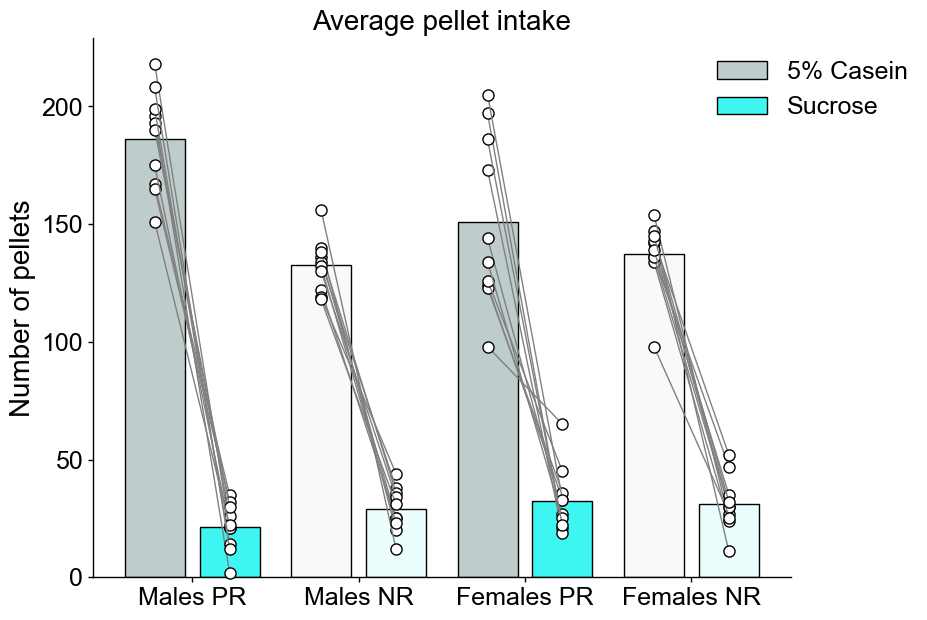

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


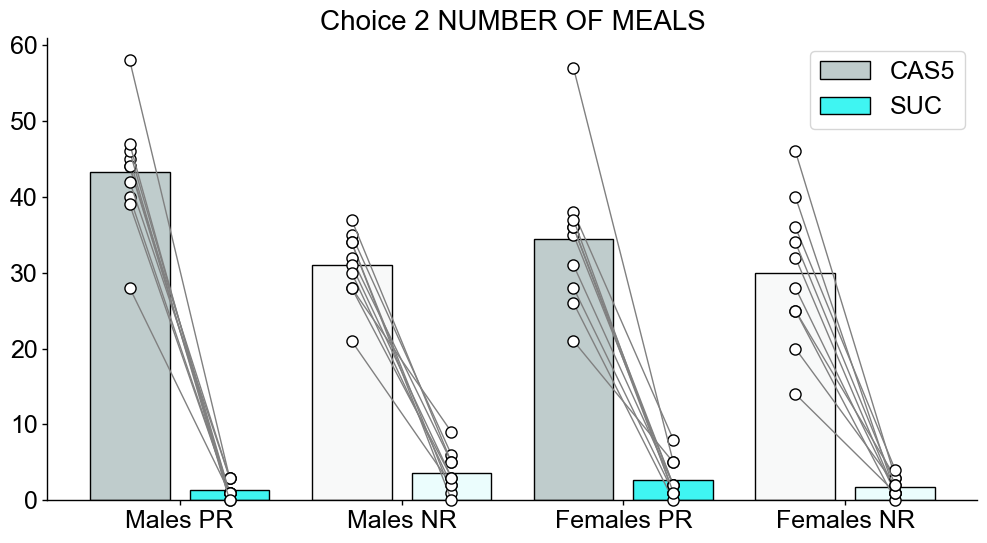

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


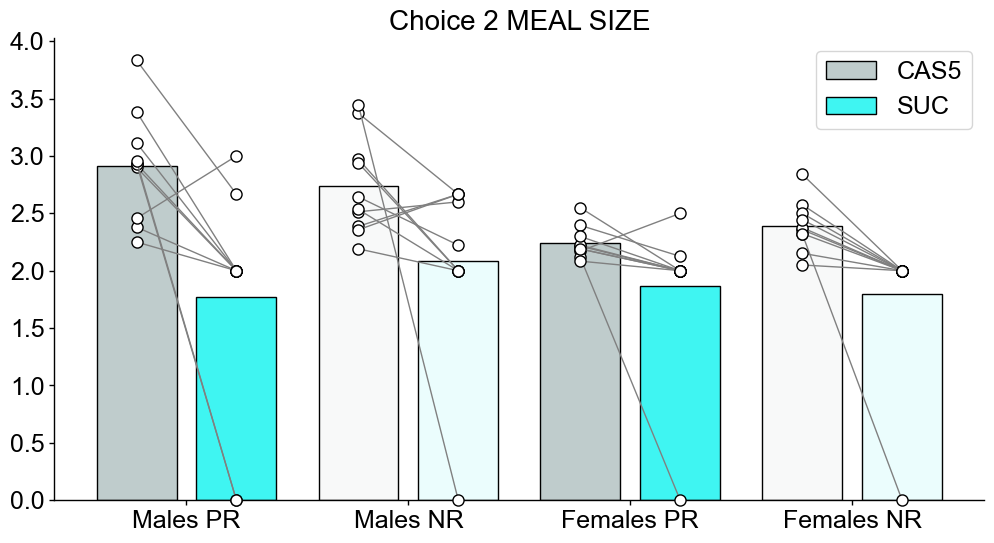

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


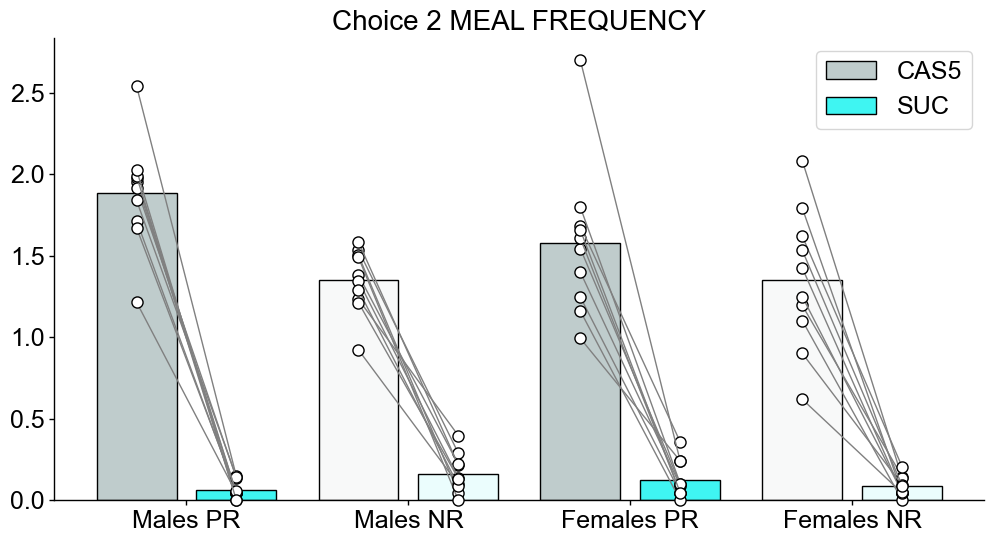

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


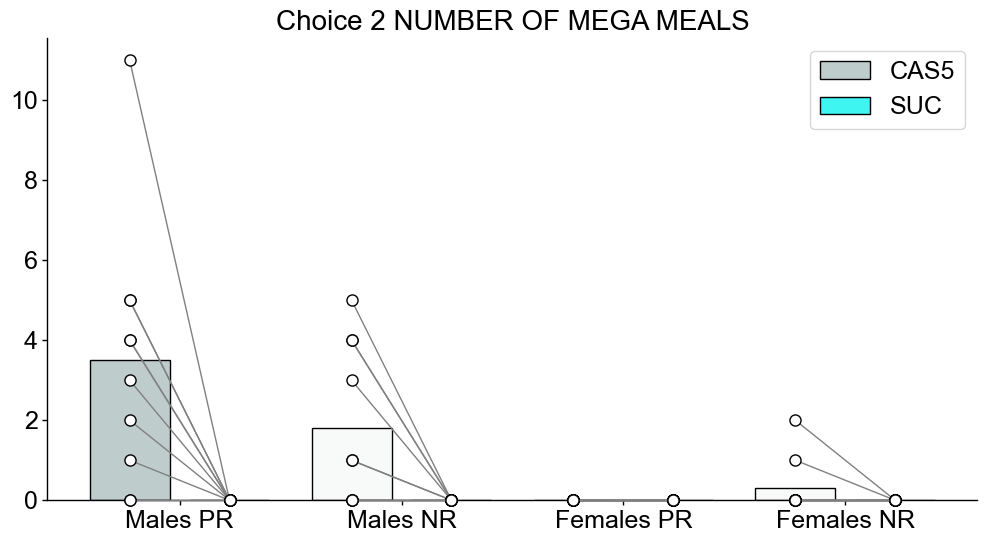

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


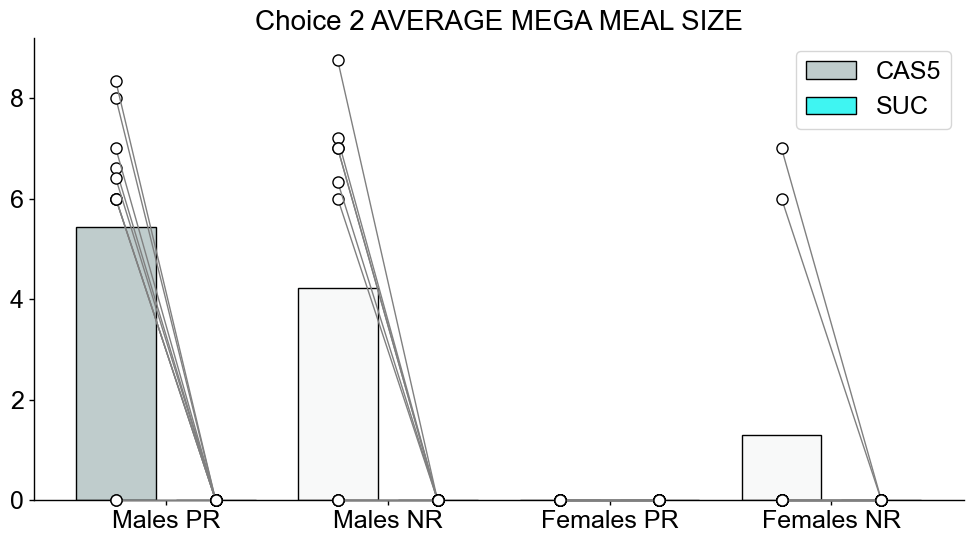

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


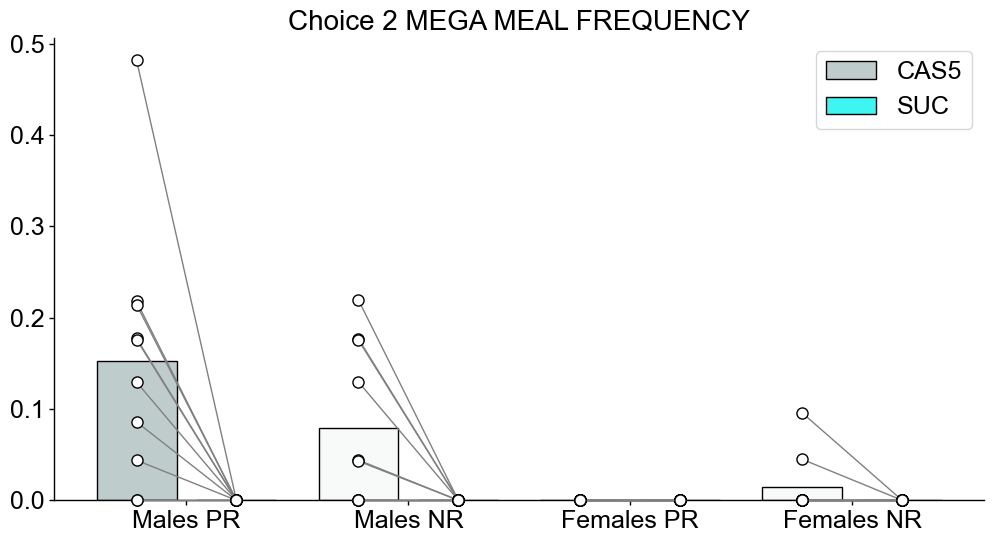

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


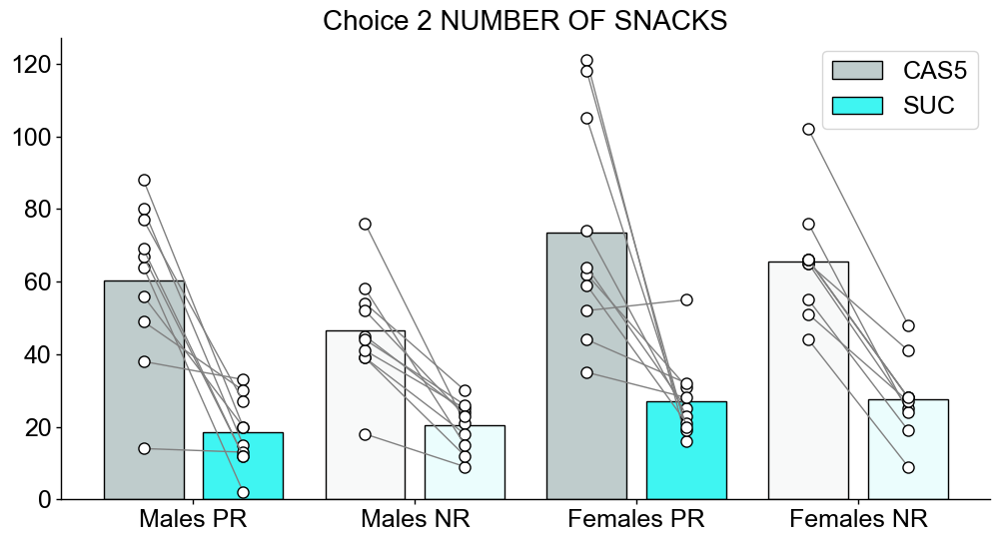

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


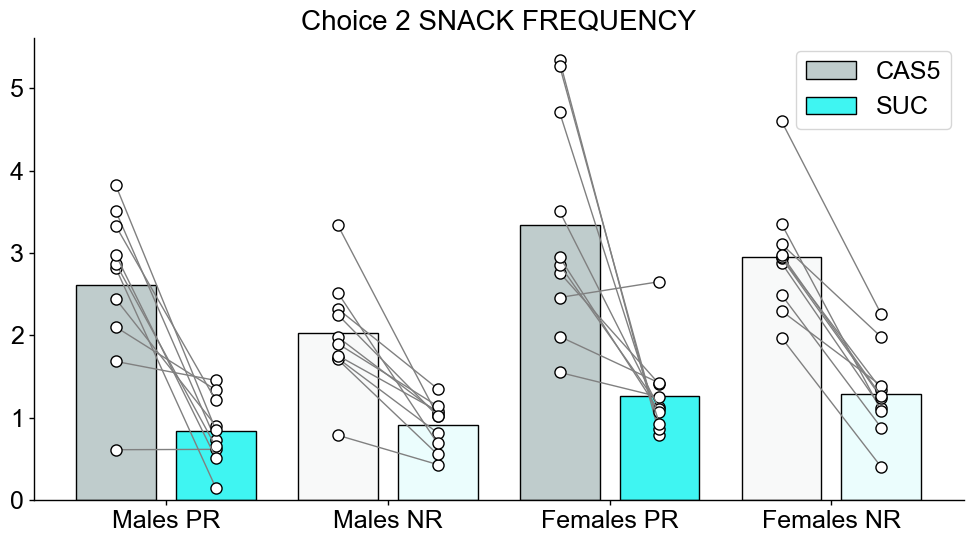

In [53]:

fig_folder = r"../plots\FINAL_PLOTS_FOR_FENS24\C3\\"

# Filter the data for male PR mice in choice session 2
pellet_count_male_nr_pellet_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
pellet_count_average_pellets_per_type_mnr3= pellet_count_male_nr_pellet_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_female_nr_pellet_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
pellet_count_average_pellets_per_type_fnr3= pellet_count_female_nr_pellet_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_male_pr_pellet_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
pellet_count_average_pellets_per_type_mpr3= pellet_count_male_pr_pellet_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_female_pr_pellet_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
pellet_count_average_pellets_per_type_fpr3= pellet_count_female_pr_pellet_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_CAS5_mpr3= pellet_count_average_pellets_per_type_mpr3['CAS5']
pellet_count_suc_mpr3= pellet_count_average_pellets_per_type_mpr3['SUC']
pellet_count_CAS5_fpr3= pellet_count_average_pellets_per_type_fpr3['CAS5']
pellet_count_suc_fpr3= pellet_count_average_pellets_per_type_fpr3['SUC']

pellet_count_CAS5_mnr3= pellet_count_average_pellets_per_type_mnr3['CAS5']
pellet_count_suc_mnr3= pellet_count_average_pellets_per_type_mnr3['SUC']
pellet_count_CAS5_fnr3= pellet_count_average_pellets_per_type_fnr3['CAS5']
pellet_count_suc_fnr3= pellet_count_average_pellets_per_type_fnr3['SUC']

pellet_count_group_data_male_pr = [pellet_count_CAS5_mpr3.tolist(), pellet_count_suc_mpr3.tolist()]
pellet_count_group_data_female_pr = [pellet_count_CAS5_fpr3.tolist(), pellet_count_suc_fpr3.tolist()]
pellet_count_group_data_male_nr = [pellet_count_CAS5_mnr3.tolist(), pellet_count_suc_mnr3.tolist()]
pellet_count_group_data_female_nr = [pellet_count_CAS5_fnr3.tolist(), pellet_count_suc_fnr3.tolist()]

# Plotting using barscatter
# Define the color values
high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(9,7))
_, _, barlist, _ = tp.barscatter([pellet_count_group_data_male_pr, pellet_count_group_data_male_nr, pellet_count_group_data_female_pr, pellet_count_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Average pellet intake")
ax.legend(barlist, ['5% Casein', 'Sucrose'], frameon=False, bbox_to_anchor=(1.2,1))
ax.set_ylabel("Number of pellets")

# Set custom x-axis labels
pellet_count_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(pellet_count_group_labels)
f.savefig(fig_folder + "C3_PELLET_INTAKE.pdf", bbox_inches='tight')
plt.show()

#f.savefig(fig_folder + "C3_PELLET_INTAKE.png")



# Filter the data for male PR mice in choice session 2
number_of_meals_male_nr_number_of_meals_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
number_of_meals_average_number_of_meals_per_type_mnr3= number_of_meals_male_nr_number_of_meals_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_female_nr_number_of_meals_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
number_of_meals_average_number_of_meals_per_type_fnr3= number_of_meals_female_nr_number_of_meals_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_male_pr_number_of_meals_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
number_of_meals_average_number_of_meals_per_type_mpr3= number_of_meals_male_pr_number_of_meals_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_female_pr_number_of_meals_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
number_of_meals_average_number_of_meals_per_type_fpr3= number_of_meals_female_pr_number_of_meals_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

number_of_meals_CAS5_mpr3= number_of_meals_average_number_of_meals_per_type_mpr3['CAS5']
number_of_meals_suc_mpr3= number_of_meals_average_number_of_meals_per_type_mpr3['SUC']
number_of_meals_CAS5_fpr3= number_of_meals_average_number_of_meals_per_type_fpr3['CAS5']
number_of_meals_suc_fpr3= number_of_meals_average_number_of_meals_per_type_fpr3['SUC']

number_of_meals_CAS5_mnr3= number_of_meals_average_number_of_meals_per_type_mnr3['CAS5']
number_of_meals_suc_mnr3= number_of_meals_average_number_of_meals_per_type_mnr3['SUC']
number_of_meals_CAS5_fnr3= number_of_meals_average_number_of_meals_per_type_fnr3['CAS5']
number_of_meals_suc_fnr3= number_of_meals_average_number_of_meals_per_type_fnr3['SUC']

number_of_meals_group_data_male_pr = [number_of_meals_CAS5_mpr3.tolist(), number_of_meals_suc_mpr3.tolist()]
number_of_meals_group_data_female_pr = [number_of_meals_CAS5_fpr3.tolist(), number_of_meals_suc_fpr3.tolist()]
number_of_meals_group_data_male_nr = [number_of_meals_CAS5_mnr3.tolist(), number_of_meals_suc_mnr3.tolist()]
number_of_meals_group_data_female_nr = [number_of_meals_CAS5_fnr3.tolist(), number_of_meals_suc_fnr3.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([number_of_meals_group_data_male_pr, number_of_meals_group_data_male_nr, number_of_meals_group_data_female_pr, number_of_meals_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 NUMBER OF MEALS")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
number_of_meals_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(number_of_meals_group_labels)

plt.show()

#f.savefig(fig_folder + "C3_NUMBER_OF_MEALS.png")



# Filter the data for male PR mice in choice session 2
mealsize_male_nr_mealsize_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
mealsize_average_mealsizes_per_type_mnr3= mealsize_male_nr_mealsize_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_female_nr_mealsize_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
mealsize_average_mealsizes_per_type_fnr3= mealsize_female_nr_mealsize_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_male_pr_mealsize_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
mealsize_average_mealsizes_per_type_mpr3= mealsize_male_pr_mealsize_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_female_pr_mealsize_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
mealsize_average_mealsizes_per_type_fpr3= mealsize_female_pr_mealsize_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

mealsize_CAS5_mpr3= mealsize_average_mealsizes_per_type_mpr3['CAS5']
mealsize_suc_mpr3= mealsize_average_mealsizes_per_type_mpr3['SUC']
mealsize_CAS5_fpr3= mealsize_average_mealsizes_per_type_fpr3['CAS5']
mealsize_suc_fpr3= mealsize_average_mealsizes_per_type_fpr3['SUC']

mealsize_CAS5_mnr3= mealsize_average_mealsizes_per_type_mnr3['CAS5']
mealsize_suc_mnr3= mealsize_average_mealsizes_per_type_mnr3['SUC']
mealsize_CAS5_fnr3= mealsize_average_mealsizes_per_type_fnr3['CAS5']
mealsize_suc_fnr3= mealsize_average_mealsizes_per_type_fnr3['SUC']

mealsize_group_data_male_pr = [mealsize_CAS5_mpr3.tolist(), mealsize_suc_mpr3.tolist()]
mealsize_group_data_female_pr = [mealsize_CAS5_fpr3.tolist(), mealsize_suc_fpr3.tolist()]
mealsize_group_data_male_nr = [mealsize_CAS5_mnr3.tolist(), mealsize_suc_mnr3.tolist()]
mealsize_group_data_female_nr = [mealsize_CAS5_fnr3.tolist(), mealsize_suc_fnr3.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([mealsize_group_data_male_pr, mealsize_group_data_male_nr, mealsize_group_data_female_pr, mealsize_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 MEAL SIZE")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
mealsize_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(mealsize_group_labels)

plt.show()

#f.savefig(fig_folder + "C3_MEAL_SIZE.png")



# Filter the data for male PR mice in choice session 2
meal_frequency_male_nr_meal_frequency_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
meal_frequency_average_meal_frequencies_per_type_mnr3= meal_frequency_male_nr_meal_frequency_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_female_nr_meal_frequency_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
meal_frequency_average_meal_frequencies_per_type_fnr3= meal_frequency_female_nr_meal_frequency_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_male_pr_meal_frequency_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
meal_frequency_average_meal_frequencies_per_type_mpr3= meal_frequency_male_pr_meal_frequency_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_female_pr_meal_frequency_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
meal_frequency_average_meal_frequencies_per_type_fpr3= meal_frequency_female_pr_meal_frequency_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

meal_frequency_CAS5_mpr3= meal_frequency_average_meal_frequencies_per_type_mpr3['CAS5']
meal_frequency_suc_mpr3= meal_frequency_average_meal_frequencies_per_type_mpr3['SUC']
meal_frequency_CAS5_fpr3= meal_frequency_average_meal_frequencies_per_type_fpr3['CAS5']
meal_frequency_suc_fpr3= meal_frequency_average_meal_frequencies_per_type_fpr3['SUC']

meal_frequency_CAS5_mnr3= meal_frequency_average_meal_frequencies_per_type_mnr3['CAS5']
meal_frequency_suc_mnr3= meal_frequency_average_meal_frequencies_per_type_mnr3['SUC']
meal_frequency_CAS5_fnr3= meal_frequency_average_meal_frequencies_per_type_fnr3['CAS5']
meal_frequency_suc_fnr3= meal_frequency_average_meal_frequencies_per_type_fnr3['SUC']

meal_frequency_group_data_male_pr = [meal_frequency_CAS5_mpr3.tolist(), meal_frequency_suc_mpr3.tolist()]
meal_frequency_group_data_female_pr = [meal_frequency_CAS5_fpr3.tolist(), meal_frequency_suc_fpr3.tolist()]
meal_frequency_group_data_male_nr = [meal_frequency_CAS5_mnr3.tolist(), meal_frequency_suc_mnr3.tolist()]
meal_frequency_group_data_female_nr = [meal_frequency_CAS5_fnr3.tolist(), meal_frequency_suc_fnr3.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([meal_frequency_group_data_male_pr, meal_frequency_group_data_male_nr, meal_frequency_group_data_female_pr, meal_frequency_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 MEAL FREQUENCY")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
meal_frequency_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(meal_frequency_group_labels)

plt.show()

#f.savefig(fig_folder + "C3_MEAL_FREQUENCY.png")



# Filter the data for male PR mice in choice session 3
NUMBER_OF_MEGA_MEALS_male_nr_NUMBER_OF_MEGA_MEALS_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr3= NUMBER_OF_MEGA_MEALS_male_nr_NUMBER_OF_MEGA_MEALS_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_female_nr_NUMBER_OF_MEGA_MEALS_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr3= NUMBER_OF_MEGA_MEALS_female_nr_NUMBER_OF_MEGA_MEALS_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_male_pr_NUMBER_OF_MEGA_MEALS_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr3= NUMBER_OF_MEGA_MEALS_male_pr_NUMBER_OF_MEGA_MEALS_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_female_pr_NUMBER_OF_MEGA_MEALS_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr3= NUMBER_OF_MEGA_MEALS_female_pr_NUMBER_OF_MEGA_MEALS_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

NUMBER_OF_MEGA_MEALS_CAS5_mpr3= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr3['CAS5']
NUMBER_OF_MEGA_MEALS_suc_mpr3= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mpr3['SUC']
NUMBER_OF_MEGA_MEALS_CAS5_fpr3= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr3['CAS5']
NUMBER_OF_MEGA_MEALS_suc_fpr3= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fpr3['SUC']

NUMBER_OF_MEGA_MEALS_CAS5_mnr3= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr3['CAS5']
NUMBER_OF_MEGA_MEALS_suc_mnr3= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_mnr3['SUC']
NUMBER_OF_MEGA_MEALS_CAS5_fnr3= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr3['CAS5']
NUMBER_OF_MEGA_MEALS_suc_fnr3= NUMBER_OF_MEGA_MEALS_average_NUMBER_OF_MEGA_MEALSS_per_type_fnr3['SUC']

NUMBER_OF_MEGA_MEALS_group_data_male_pr = [NUMBER_OF_MEGA_MEALS_CAS5_mpr3.tolist(), NUMBER_OF_MEGA_MEALS_suc_mpr3.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_female_pr = [NUMBER_OF_MEGA_MEALS_CAS5_fpr3.tolist(), NUMBER_OF_MEGA_MEALS_suc_fpr3.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_male_nr = [NUMBER_OF_MEGA_MEALS_CAS5_mnr3.tolist(), NUMBER_OF_MEGA_MEALS_suc_mnr3.tolist()]
NUMBER_OF_MEGA_MEALS_group_data_female_nr = [NUMBER_OF_MEGA_MEALS_CAS5_fnr3.tolist(), NUMBER_OF_MEGA_MEALS_suc_fnr3.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([NUMBER_OF_MEGA_MEALS_group_data_male_pr, NUMBER_OF_MEGA_MEALS_group_data_male_nr, NUMBER_OF_MEGA_MEALS_group_data_female_pr, NUMBER_OF_MEGA_MEALS_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 NUMBER OF MEGA MEALS")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
NUMBER_OF_MEGA_MEALS_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(NUMBER_OF_MEGA_MEALS_group_labels)

plt.show()

#f.savefig(fig_folder + "C3_NUMBER_OF_MEGA_MEALS.png")



# Filter the data for male PR mice in choice session 3
AVERAGE_MEGA_MEAL_SIZE_male_nr_AVERAGE_MEGA_MEAL_SIZE_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr3= AVERAGE_MEGA_MEAL_SIZE_male_nr_AVERAGE_MEGA_MEAL_SIZE_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_female_nr_AVERAGE_MEGA_MEAL_SIZE_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr3= AVERAGE_MEGA_MEAL_SIZE_female_nr_AVERAGE_MEGA_MEAL_SIZE_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_male_pr_AVERAGE_MEGA_MEAL_SIZE_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr3= AVERAGE_MEGA_MEAL_SIZE_male_pr_AVERAGE_MEGA_MEAL_SIZE_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_female_pr_AVERAGE_MEGA_MEAL_SIZE_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr3= AVERAGE_MEGA_MEAL_SIZE_female_pr_AVERAGE_MEGA_MEAL_SIZE_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

AVERAGE_MEGA_MEAL_SIZE_CAS5_mpr3= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr3['CAS5']
AVERAGE_MEGA_MEAL_SIZE_suc_mpr3= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mpr3['SUC']
AVERAGE_MEGA_MEAL_SIZE_CAS5_fpr3= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr3['CAS5']
AVERAGE_MEGA_MEAL_SIZE_suc_fpr3= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fpr3['SUC']

AVERAGE_MEGA_MEAL_SIZE_CAS5_mnr3= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr3['CAS5']
AVERAGE_MEGA_MEAL_SIZE_suc_mnr3= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_mnr3['SUC']
AVERAGE_MEGA_MEAL_SIZE_CAS5_fnr3= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr3['CAS5']
AVERAGE_MEGA_MEAL_SIZE_suc_fnr3= AVERAGE_MEGA_MEAL_SIZE_average_AVERAGE_MEGA_MEAL_SIZES_per_type_fnr3['SUC']

AVERAGE_MEGA_MEAL_SIZE_group_data_male_pr = [AVERAGE_MEGA_MEAL_SIZE_CAS5_mpr3.tolist(), AVERAGE_MEGA_MEAL_SIZE_suc_mpr3.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_female_pr = [AVERAGE_MEGA_MEAL_SIZE_CAS5_fpr3.tolist(), AVERAGE_MEGA_MEAL_SIZE_suc_fpr3.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_male_nr = [AVERAGE_MEGA_MEAL_SIZE_CAS5_mnr3.tolist(), AVERAGE_MEGA_MEAL_SIZE_suc_mnr3.tolist()]
AVERAGE_MEGA_MEAL_SIZE_group_data_female_nr = [AVERAGE_MEGA_MEAL_SIZE_CAS5_fnr3.tolist(), AVERAGE_MEGA_MEAL_SIZE_suc_fnr3.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([AVERAGE_MEGA_MEAL_SIZE_group_data_male_pr, AVERAGE_MEGA_MEAL_SIZE_group_data_male_nr, AVERAGE_MEGA_MEAL_SIZE_group_data_female_pr, AVERAGE_MEGA_MEAL_SIZE_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 AVERAGE MEGA MEAL SIZE")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
AVERAGE_MEGA_MEAL_SIZE_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(AVERAGE_MEGA_MEAL_SIZE_group_labels)

plt.show()

#f.savefig(fig_folder + "C3_AVERAGE_MEGA_MEAL_SIZE.png")




# Filter the data for male PR mice in choice session 3
MEGA_MEAL_FREQUENCY_male_nr_MEGA_MEAL_FREQUENCY_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr3= MEGA_MEAL_FREQUENCY_male_nr_MEGA_MEAL_FREQUENCY_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_female_nr_MEGA_MEAL_FREQUENCY_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr3= MEGA_MEAL_FREQUENCY_female_nr_MEGA_MEAL_FREQUENCY_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_male_pr_MEGA_MEAL_FREQUENCY_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr3= MEGA_MEAL_FREQUENCY_male_pr_MEGA_MEAL_FREQUENCY_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_female_pr_MEGA_MEAL_FREQUENCY_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr3= MEGA_MEAL_FREQUENCY_female_pr_MEGA_MEAL_FREQUENCY_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

MEGA_MEAL_FREQUENCY_CAS5_mpr3= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr3['CAS5']
MEGA_MEAL_FREQUENCY_suc_mpr3= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mpr3['SUC']
MEGA_MEAL_FREQUENCY_CAS5_fpr3= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr3['CAS5']
MEGA_MEAL_FREQUENCY_suc_fpr3= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fpr3['SUC']

MEGA_MEAL_FREQUENCY_CAS5_mnr3= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr3['CAS5']
MEGA_MEAL_FREQUENCY_suc_mnr3= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_mnr3['SUC']
MEGA_MEAL_FREQUENCY_CAS5_fnr3= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr3['CAS5']
MEGA_MEAL_FREQUENCY_suc_fnr3= MEGA_MEAL_FREQUENCY_average_MEGA_MEAL_FREQUENCIES_per_type_fnr3['SUC']

MEGA_MEAL_FREQUENCY_group_data_male_pr = [MEGA_MEAL_FREQUENCY_CAS5_mpr3.tolist(), MEGA_MEAL_FREQUENCY_suc_mpr3.tolist()]
MEGA_MEAL_FREQUENCY_group_data_female_pr = [MEGA_MEAL_FREQUENCY_CAS5_fpr3.tolist(), MEGA_MEAL_FREQUENCY_suc_fpr3.tolist()]
MEGA_MEAL_FREQUENCY_group_data_male_nr = [MEGA_MEAL_FREQUENCY_CAS5_mnr3.tolist(), MEGA_MEAL_FREQUENCY_suc_mnr3.tolist()]
MEGA_MEAL_FREQUENCY_group_data_female_nr = [MEGA_MEAL_FREQUENCY_CAS5_fnr3.tolist(), MEGA_MEAL_FREQUENCY_suc_fnr3.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([MEGA_MEAL_FREQUENCY_group_data_male_pr, MEGA_MEAL_FREQUENCY_group_data_male_nr, MEGA_MEAL_FREQUENCY_group_data_female_pr, MEGA_MEAL_FREQUENCY_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 MEGA MEAL FREQUENCY")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
MEGA_MEAL_FREQUENCY_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(MEGA_MEAL_FREQUENCY_group_labels)

plt.show()

#f.savefig(fig_folder + "C3_MEGA_MEAL_FREQUENCY.png")




# Filter the data for male PR mice in choice session 3
NUMBER_OF_SNACKS_male_nr_NUMBER_OF_SNACKS_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr3= NUMBER_OF_SNACKS_male_nr_NUMBER_OF_SNACKS_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_female_nr_NUMBER_OF_SNACKS_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr3= NUMBER_OF_SNACKS_female_nr_NUMBER_OF_SNACKS_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_male_pr_NUMBER_OF_SNACKS_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr3= NUMBER_OF_SNACKS_male_pr_NUMBER_OF_SNACKS_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_female_pr_NUMBER_OF_SNACKS_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr3= NUMBER_OF_SNACKS_female_pr_NUMBER_OF_SNACKS_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

NUMBER_OF_SNACKS_CAS5_mpr3= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr3['CAS5']
NUMBER_OF_SNACKS_suc_mpr3= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mpr3['SUC']
NUMBER_OF_SNACKS_CAS5_fpr3= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr3['CAS5']
NUMBER_OF_SNACKS_suc_fpr3= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fpr3['SUC']

NUMBER_OF_SNACKS_CAS5_mnr3= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr3['CAS5']
NUMBER_OF_SNACKS_suc_mnr3= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_mnr3['SUC']
NUMBER_OF_SNACKS_CAS5_fnr3= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr3['CAS5']
NUMBER_OF_SNACKS_suc_fnr3= NUMBER_OF_SNACKS_average_NUMBER_OF_SNACKS_per_type_fnr3['SUC']

NUMBER_OF_SNACKS_group_data_male_pr = [NUMBER_OF_SNACKS_CAS5_mpr3.tolist(), NUMBER_OF_SNACKS_suc_mpr3.tolist()]
NUMBER_OF_SNACKS_group_data_female_pr = [NUMBER_OF_SNACKS_CAS5_fpr3.tolist(), NUMBER_OF_SNACKS_suc_fpr3.tolist()]
NUMBER_OF_SNACKS_group_data_male_nr = [NUMBER_OF_SNACKS_CAS5_mnr3.tolist(), NUMBER_OF_SNACKS_suc_mnr3.tolist()]
NUMBER_OF_SNACKS_group_data_female_nr = [NUMBER_OF_SNACKS_CAS5_fnr3.tolist(), NUMBER_OF_SNACKS_suc_fnr3.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([NUMBER_OF_SNACKS_group_data_male_pr, NUMBER_OF_SNACKS_group_data_male_nr, NUMBER_OF_SNACKS_group_data_female_pr, NUMBER_OF_SNACKS_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 NUMBER OF SNACKS")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
NUMBER_OF_SNACKS_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(NUMBER_OF_SNACKS_group_labels)

plt.show()

#f.savefig(fig_folder + "C3_NUMBER_OF_SNACKS.png")




# Filter the data for male PR mice in choice session 3
SNACK_FREQUENCY_male_nr_SNACK_FREQUENCY_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr3= SNACK_FREQUENCY_male_nr_SNACK_FREQUENCY_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_female_nr_SNACK_FREQUENCY_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr3= SNACK_FREQUENCY_female_nr_SNACK_FREQUENCY_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_male_pr_SNACK_FREQUENCY_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr3= SNACK_FREQUENCY_male_pr_SNACK_FREQUENCY_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_female_pr_SNACK_FREQUENCY_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr3= SNACK_FREQUENCY_female_pr_SNACK_FREQUENCY_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

SNACK_FREQUENCY_CAS5_mpr3= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr3['CAS5']
SNACK_FREQUENCY_suc_mpr3= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mpr3['SUC']
SNACK_FREQUENCY_CAS5_fpr3= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr3['CAS5']
SNACK_FREQUENCY_suc_fpr3= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fpr3['SUC']

SNACK_FREQUENCY_CAS5_mnr3= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr3['CAS5']
SNACK_FREQUENCY_suc_mnr3= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_mnr3['SUC']
SNACK_FREQUENCY_CAS5_fnr3= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr3['CAS5']
SNACK_FREQUENCY_suc_fnr3= SNACK_FREQUENCY_average_SNACK_FREQUENCIES_per_type_fnr3['SUC']

SNACK_FREQUENCY_group_data_male_pr = [SNACK_FREQUENCY_CAS5_mpr3.tolist(), SNACK_FREQUENCY_suc_mpr3.tolist()]
SNACK_FREQUENCY_group_data_female_pr = [SNACK_FREQUENCY_CAS5_fpr3.tolist(), SNACK_FREQUENCY_suc_fpr3.tolist()]
SNACK_FREQUENCY_group_data_male_nr = [SNACK_FREQUENCY_CAS5_mnr3.tolist(), SNACK_FREQUENCY_suc_mnr3.tolist()]
SNACK_FREQUENCY_group_data_female_nr = [SNACK_FREQUENCY_CAS5_fnr3.tolist(), SNACK_FREQUENCY_suc_fnr3.tolist()]

# Plotting using barscatter

high_protein_color = (0.749, 0.8, 0.8)
low_protein_color = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([SNACK_FREQUENCY_group_data_male_pr, SNACK_FREQUENCY_group_data_male_nr, SNACK_FREQUENCY_group_data_female_pr, SNACK_FREQUENCY_group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice 2 SNACK FREQUENCY")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
SNACK_FREQUENCY_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(SNACK_FREQUENCY_group_labels)

plt.show()

#f.savefig(fig_folder + "C3_SNACK_FREQUENCY.png")



<a id="Choice_4_MEAL_COMPONENT"></a>
## Choice_4_MEAL_COMPONENT

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


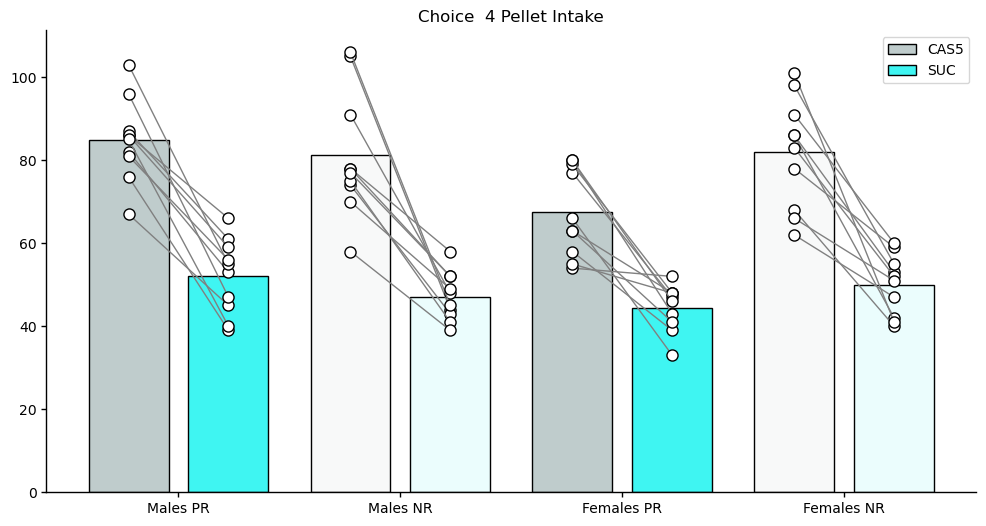

In [14]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 Pellet Intake")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()

#f.savefig(fig_folder + "C4_PELLET_INTAKE.png")

c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


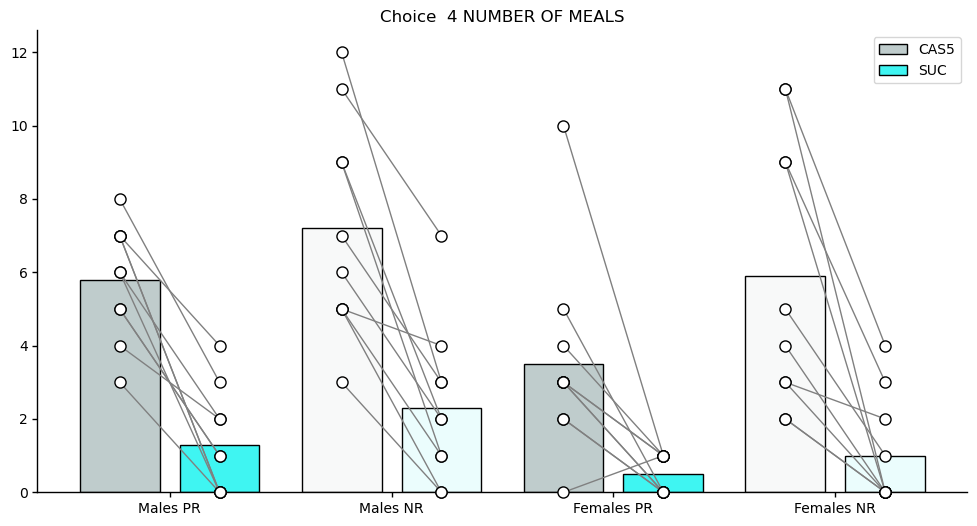

In [15]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEALS'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 NUMBER OF MEALS")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()


#f.savefig(fig_folder + "C4_N_MEALS.png")

C:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


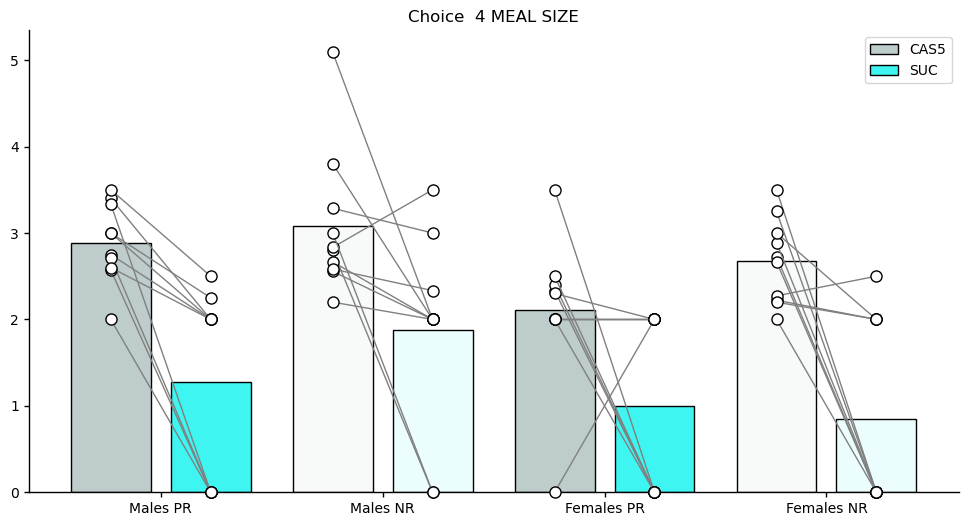

In [45]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 MEAL SIZE")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()


f.savefig(fig_folder + "C4_MEALS_SIZE.png")

C:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


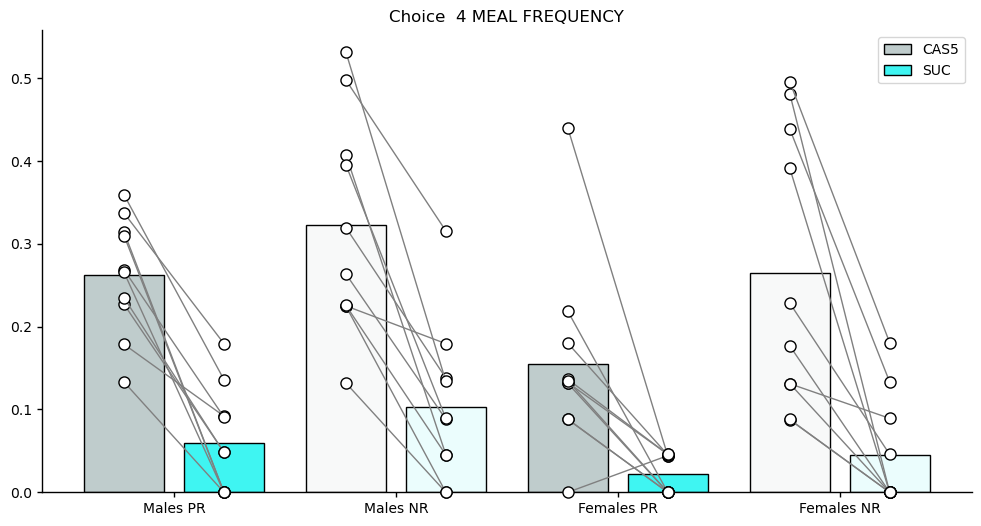

In [46]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_FREQUENCY'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 MEAL FREQUENCY")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()


f.savefig(fig_folder + "C4_MEAL_FREQ.png")

C:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


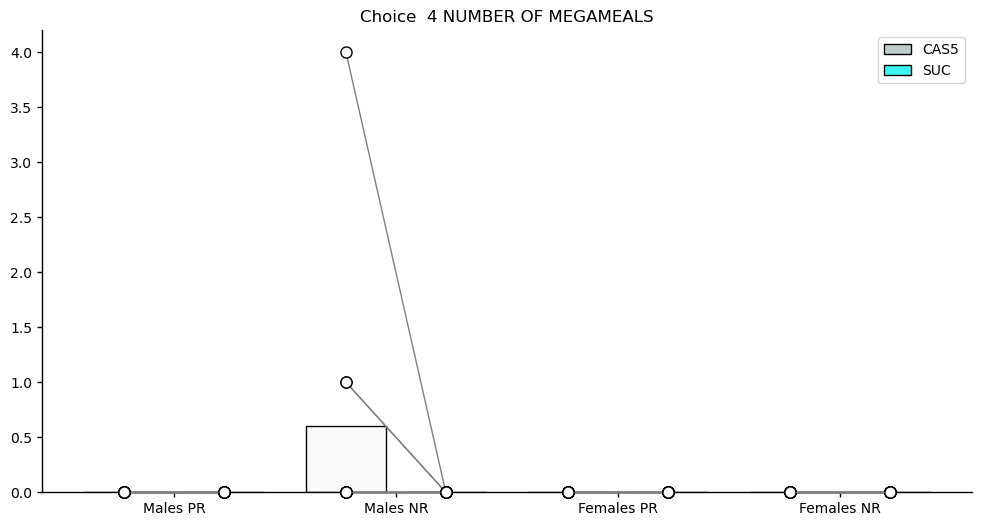

In [47]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_MEGA_MEALS'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 NUMBER OF MEGAMEALS")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()


f.savefig(fig_folder + "C4_N_MEGAMEAL.png")

C:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


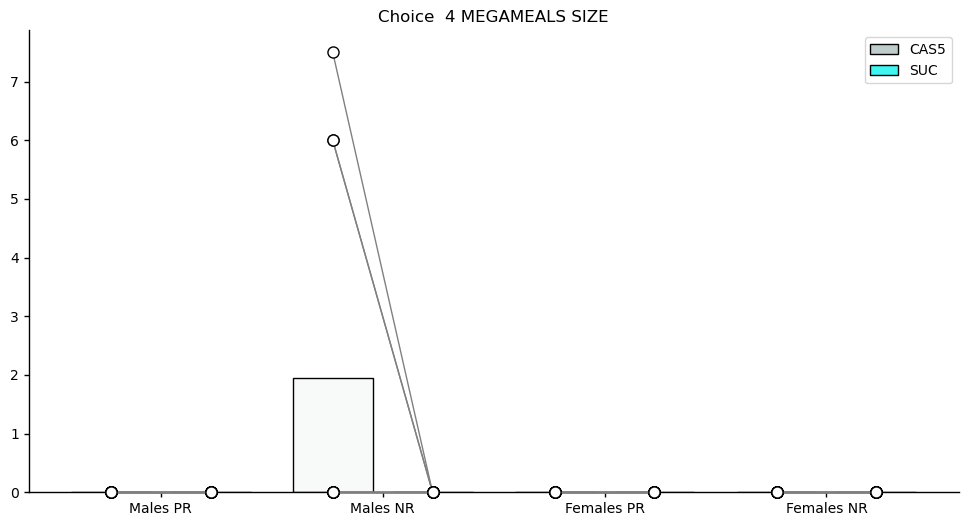

In [48]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['AVERAGE_MEGA_MEAL_SIZE'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 MEGAMEALS SIZE")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()

f.savefig(fig_folder + "C4_MEGAMEAL_SIZE.png")


C:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


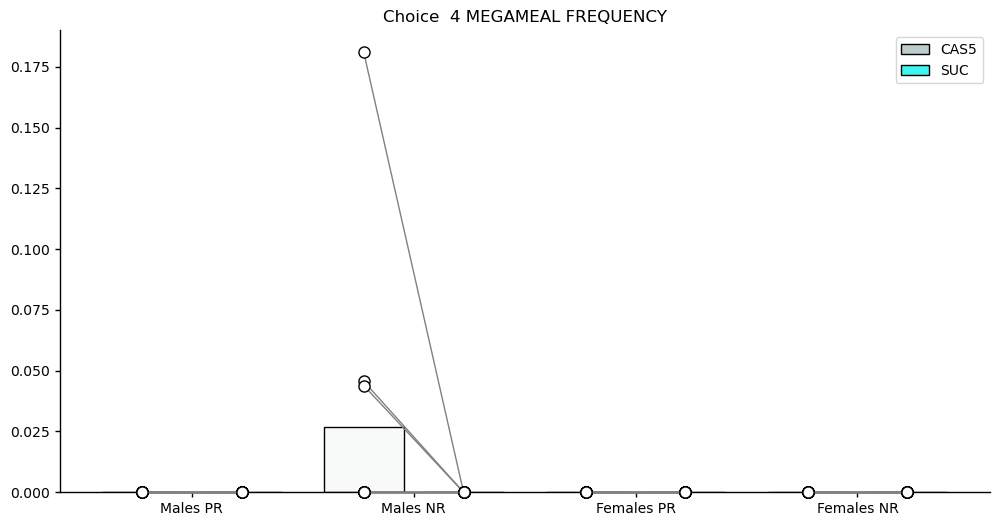

In [49]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['MEGA_MEAL_FREQUENCY'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 MEGAMEAL FREQUENCY")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()


f.savefig(fig_folder + "C4_MEGAMEAL_FREQ.png")

<a id="Choice_4_SNACK_COMPONENT"></a>
## Choice_4_SNACK_COMPONENT

C:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


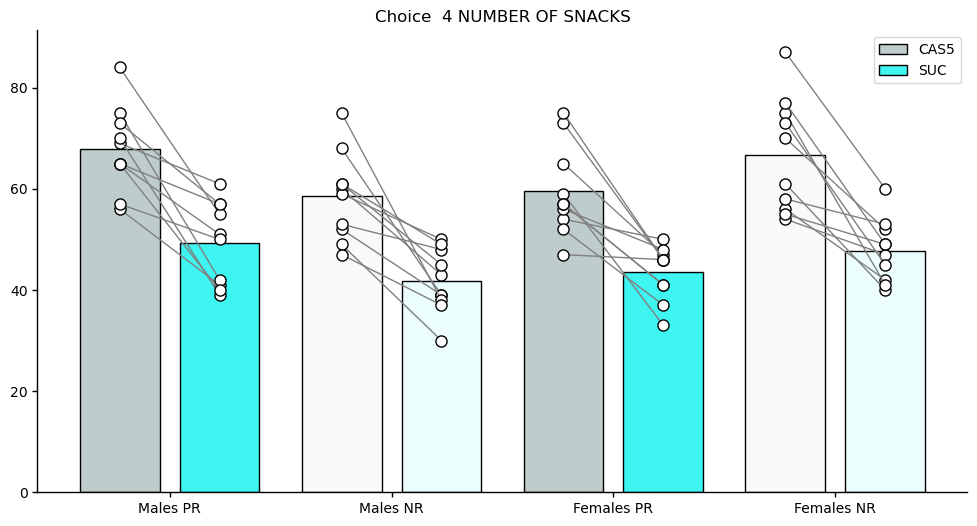

In [50]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['NUMBER_OF_SNACKS'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 NUMBER OF SNACKS")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()

f.savefig(fig_folder + "C4_N_SNACKS.png")


C:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


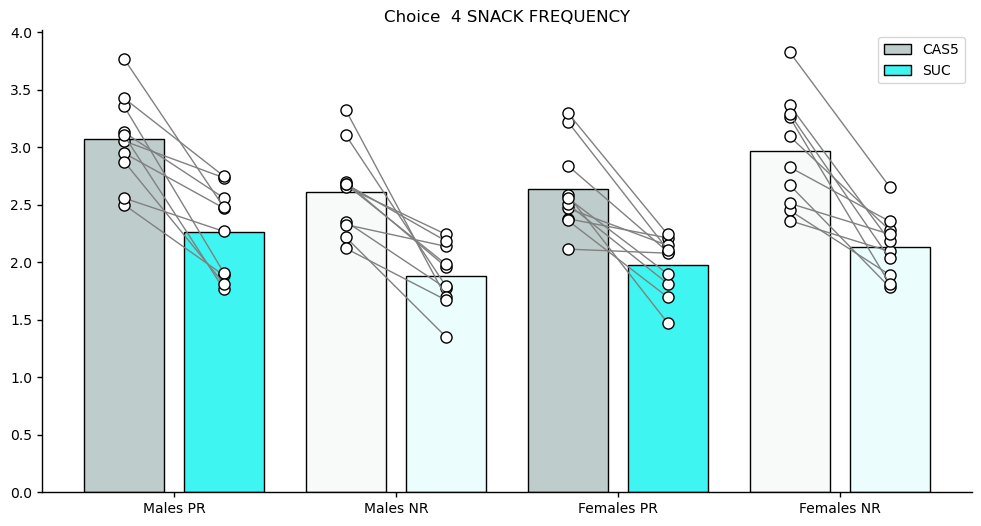

In [51]:
# Filter the data for male PR mice in choice session 1
male_nr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_mnr4= male_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

female_nr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'NR')]
average_pellets_per_type_fnr4= female_nr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()


male_pr_pellet_C4 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_mpr4= male_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()


female_pr_pellet_C4 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 4) & (data['DIET'] == 'PR')]
average_pellets_per_type_fpr4= female_pr_pellet_C4.groupby(['MOUSEID', 'PELLET_TYPE'])['SNACK_FREQUENCY'].mean().unstack()

cas5_mpr4= average_pellets_per_type_mpr4['CAS5']
suc_mpr4= average_pellets_per_type_mpr4['SUC']
cas5_fpr4= average_pellets_per_type_fpr4['CAS5']
suc_fpr4= average_pellets_per_type_fpr4['SUC']

cas5_mnr4= average_pellets_per_type_mnr4['CAS5']
suc_mnr4= average_pellets_per_type_mnr4['SUC']
cas5_fnr4= average_pellets_per_type_fnr4['CAS5']
suc_fnr4= average_pellets_per_type_fnr4['SUC']

group_data_male_pr = [cas5_mpr4.tolist(), suc_mpr4.tolist()]
group_data_female_pr = [cas5_fpr4.tolist(), suc_fpr4.tolist()]
group_data_male_nr = [cas5_mnr4.tolist(), suc_mnr4.tolist()]
group_data_female_nr = [cas5_fnr4.tolist(), suc_fnr4.tolist()]

# Plotting using barscatter

cas20_color_PR = (0.749, 0.8, 0.8)
cas5_color_PR = (0.247, 0.961, 0.949)
# the last element of the tuple is alpha value
cas20_color_NR = (0.749, 0.8, 0.8, 0.1)
cas5_color_NR = (0.247, 0.961, 0.949, 0.1)




f, ax = plt.subplots(figsize=(12,6))
_, _, barlist, _ = tp.barscatter([group_data_male_pr, group_data_male_nr,group_data_female_pr,group_data_female_nr],
                                 ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                 barfacecolor_option="individual",
                                 baredgecolor=["black"]*10,
                                 barfacecolor=[cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR,cas20_color_PR, cas5_color_PR, cas20_color_NR, cas5_color_NR],
                                 positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                )

ax.set_title("Choice  4 SNACK FREQUENCY")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
group_labels = ['Males PR', 'Males NR','Females PR', 'Females NR']
ax.set_xticks([1,2,3,4])  # Mid-point of each group of bars
ax.set_xticklabels(group_labels)

plt.show()


f.savefig(fig_folder + "C4_SNACK_FREQ.png")

<a id="HOURLY_INTAKE_DATA"></a>
## HOURLY_INTAKE_DATA

In [5]:
# This csv file is used to generate the line plot (ShadedError figure)
file_path = '../results/HOURLY_PELLET.csv'
HDATA = pd.read_csv(file_path)


In [4]:



# f, [ax1,ax2] = plt.subplots(figsize=(16,6), ncols=2,
#                             sharey=False,
#                            gridspec_kw={"width_ratios":[0.7,0.3],
#                                         "right":0.9, 
#                                         "wspace":0.4})
# tp.shadedError(ax1,CAS20_PR_C2,linecolor="black",errorcolor= cas20_color_PR  )
# tp.shadedError(ax1,SUC_PR_C2,linecolor="black", errorcolor= cas5_color_PR  )
# tp.shadedError(ax1,CAS20_NR_C2,linecolor="black", errorcolor=cas20_color_NR, linestyle="dotted",alpha= 0.1 )
# tp.shadedError(ax1,SUC_NR_C2,linecolor="black", errorcolor= cas5_color_NR,  linestyle="dotted",alpha= 0.1)

# ######################################################################################
# ax1.set_ylabel("Number of pellets")
# ax1.set_xlabel("Hours")
# # ax1.axvline(6,color="k",linestyle=":", alpha= 0.3)
# # ax1.axvline(13,color="k",linestyle=":", alpha= 0.3)
# # ax1.set_xticks([0,6,13,20],labels=["1","7","14","21"])
# # ax1.text(2.5,3.25,"Epoch 1", ha="center")
# # ax1.text(10,3.25,"Epoch 2", ha="center")
# # ax1.text(17.5,3.25,"Epoch 3", ha="center")
# ax1.spines["top"].set_visible(False)
# ax1.spines["right"].set_visible(False)



# # fed_cols = [ctl_color,exp_color]
# # Ctl_patch = mpatches.Patch(color=fed_cols[0], label='Control')
# # Exp_patch = mpatches.Patch(color=fed_cols[1], label='Experimental')
# # ax1.legend(handles=[Ctl_patch, Exp_patch],
# #              bbox_to_anchor=(0.67,0.88),
# #              bbox_transform=f.transFigure)
# ####################################################################################


# spacing=0.01


# # X positions for cas20 and cas5
# x_positions = [1-spacing, 2-spacing]

# # Plot lines for MPR and MNR
# ax2.plot(x_positions,
#          [cas20_nmeal_mpr2.mean(), suc_nmeal_mpr2.mean()],
#          linestyle="-",
#          color="black",
#          marker= "o",
#          label="Exp")

# ax2.plot(x_positions,
#          [cas20_nmeal_mnr2.mean(), suc_nmeal_mnr2.mean()],
#          linestyle="dotted",
#          color="black",
#          marker ='^',
#          label="Ctl")

# # Plot markers for MPR
# ax2.errorbar([1-spacing],
#              [cas20_nmeal_mpr2.mean()],
#              yerr=[cas20_nmeal_mpr2.sem()],
#              fmt='o',
#              markerfacecolor=cas20_color_PR ,
#              ms=8,
#              color="black")

# ax2.errorbar([2-spacing],
#              [suc_nmeal_mpr2.mean()],
#              yerr=[suc_nmeal_mpr2.sem()],
#              fmt='o',
#              markerfacecolor=cas5_color_PR,
#              ms=8,
#              color="black")

# # Plot markers for MNR
# ax2.errorbar([1-spacing],
#              [cas20_nmeal_mnr2.mean()],
#              yerr=[cas20_nmeal_mnr2.sem()],
#              fmt='^-',
#              markerfacecolor=cas20_color_PR,
#              ms=8,
#              color="black")

# ax2.errorbar([2-spacing],
#              [suc_nmeal_mnr2.mean()],
#              yerr=[suc_nmeal_mnr2.sem()],
#              fmt='^-',
#              markerfacecolor=cas5_color_PR,
#              ms=8,
#              color="black")





# ax2.set_xticks([1,2],labels=["CAS20", "SUC"])
# # ax2.set_xlim([0.5,2.5])
# # ax2.set_yticks([1.6,2,2.4,2.8,3.2])
# ax2.set_ylabel("Number of meals")
# ax2.set_xlabel("Choices")
# ax2.spines["top"].set_visible(False)
# ax2.spines["right"].set_visible(False)
# ax2.legend(loc=(0.95,0.85), frameon=False)

# ax1.set_title("Dynamics of choice preference", y=1.07)
# ax2.set_title("Average number of meals",y=1.07)

# # f.subplots_adjust(wspace=0.4)

# # ax1.annotate(" Ctl",[20,2.3])
# # ax1.annotate(" Exp",[20,2.5], color= exp_color)

# #f.savefig(fig_folder + "mealsize.pdf")



# <font color  = "cyan"> plot MALES CHOICE SESSION 2 <font/>

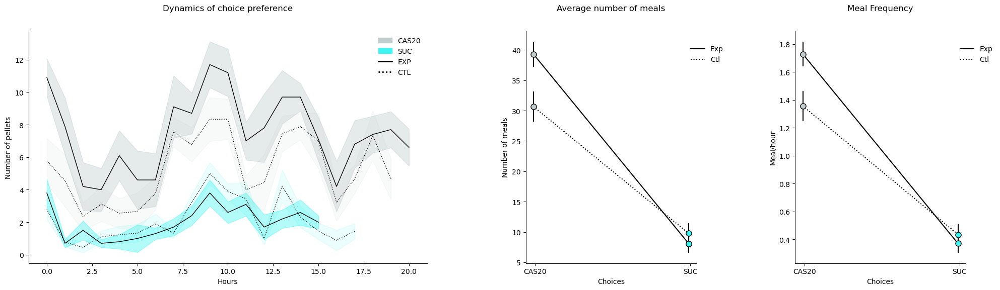

In [12]:

# Setup subplots
fig, (ax1, ax2, ax3) = plt.subplots(figsize=(24,6), ncols=3, 
                                    gridspec_kw={"width_ratios":[0.7,0.3,0.3], "wspace":0.4})

# Plot shaded errors on ax1
tp.shadedError(ax1, CAS20_MPR_C2, linecolor="black", errorcolor=high_protein_color)
tp.shadedError(ax1, SUC_MPR_C2, linecolor="black", errorcolor=low_protein_color)
tp.shadedError(ax1, CAS20_MNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
tp.shadedError(ax1, SUC_MNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

# Add legend to ax1
high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

# ax1 settings
ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# ax1 annotations and custom ticks (commented out for future use)
# ax1.axvline(6, color="k", linestyle=":", alpha=0.3)
# ax1.axvline(13, color="k", linestyle=":", alpha=0.3)
# ax1.set_xticks([0,6,13,20], labels=["1","7","14","21"])
# ax1.text(2.5, 3.25, "Epoch 1", ha="center")
# ax1.text(10, 3.25, "Epoch 2", ha="center")
# ax1.text(17.5, 3.25, "Epoch 3", ha="center")

# Plot lines and error bars on ax2
spacing = 0.01
x_positions = [1-spacing, 2-spacing]

# Plot MPR and MNR lines on ax2
ax2.plot(x_positions,
         [cas20_nmeal_mpr2.mean(), suc_nmeal_mpr2.mean()],
         linestyle="-", color="black", marker="", label="Exp")

ax2.plot(x_positions,
         [cas20_nmeal_mnr2.mean(), suc_nmeal_mnr2.mean()],
         linestyle="dotted", color="black", marker='', label="Ctl")

# Plot MPR error bars on ax2
ax2.errorbar([1-spacing], [cas20_nmeal_mpr2.mean()],
             yerr=[cas20_nmeal_mpr2.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax2.errorbar([2-spacing], [suc_nmeal_mpr2.mean()],
             yerr=[suc_nmeal_mpr2.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot MNR error bars on ax2
ax2.errorbar([1-spacing], [cas20_nmeal_mnr2.mean()],
             yerr=[cas20_nmeal_mnr2.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax2.errorbar([2-spacing], [suc_nmeal_mnr2.mean()],
             yerr=[suc_nmeal_mnr2.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# ax2 settings
ax2.set_xticks([1, 2], labels=["CAS20", "SUC"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Choices")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(loc=(0.95, 0.85), frameon=False)

# Plot lines and error bars on ax3 for meal frequencies
ax3.plot(x_positions,
         [mealfreq_cas20_mpr2.mean(), mealfreq_suc_mpr2.mean()],
         linestyle="-", color="black", marker="", label="Exp")

ax3.plot(x_positions,
         [mealfreq_cas20_mnr2.mean(), mealfreq_suc_mnr2.mean()],
         linestyle="dotted", color="black", marker='', label="Ctl")

# Plot MPR error bars on ax3
ax3.errorbar([1-spacing], [mealfreq_cas20_mpr2.mean()],
             yerr=[mealfreq_cas20_mpr2.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax3.errorbar([2-spacing], [mealfreq_suc_mpr2.mean()],
             yerr=[mealfreq_suc_mpr2.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot MNR error bars on ax3
ax3.errorbar([1-spacing], [mealfreq_cas20_mnr2.mean()],
             yerr=[mealfreq_cas20_mnr2.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax3.errorbar([2-spacing], [mealfreq_suc_mnr2.mean()],
             yerr=[mealfreq_suc_mnr2.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# ax3 settings
ax3.set_xticks([1, 2], labels=["CAS20", "SUC"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Choices")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(loc=(0.95, 0.85), frameon=False)

# Titles
ax1.set_title("Dynamics of choice preference", y=1.07)
ax2.set_title("Average number of meals", y=1.07)
ax3.set_title("Meal Frequency", y=1.07)

# Adjust subplot spacing
# fig.subplots_adjust(wspace=0.4)

# Annotations (commented out for future use)
# ax1.annotate("Ctl", [20, 2.3])
# ax1.annotate("Exp", [20, 2.5], color=exp_color)

# Save figure (commented out for future use)
# fig.savefig(fig_folder + "mealsize.pdf")

plt.show()


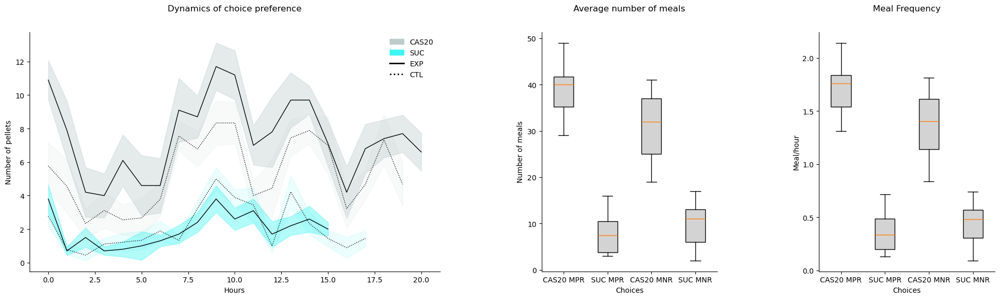

In [46]:
# Setup subplots
fig, (ax1, ax2, ax3) = plt.subplots(figsize=(24,6), ncols=3, 
                                    gridspec_kw={"width_ratios":[0.7,0.3,0.3], "wspace":0.4})

# Plot shaded errors on ax1
tp.shadedError(ax1, CAS20_MPR_C2, linecolor="black", errorcolor=high_protein_color)
tp.shadedError(ax1, SUC_MPR_C2, linecolor="black", errorcolor=low_protein_color)
tp.shadedError(ax1, CAS20_MNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
tp.shadedError(ax1, SUC_MNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

# Add legend to ax1
high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

# ax1 settings
ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# ax1 annotations and custom ticks (commented out for future use)
# ax1.axvline(6, color="k", linestyle=":", alpha=0.3)
# ax1.axvline(13, color="k", linestyle=":", alpha=0.3)
# ax1.set_xticks([0,6,13,20], labels=["1","7","14","21"])
# ax1.text(2.5, 3.25, "Epoch 1", ha="center")
# ax1.text(10, 3.25, "Epoch 2", ha="center")
# ax1.text(17.5, 3.25, "Epoch 3", ha="center")

# Plot boxplot on ax2
ax2.boxplot([cas20_nmeal_mpr2, suc_nmeal_mpr2, cas20_nmeal_mnr2, suc_nmeal_mnr2],
            patch_artist=True,
            labels=["CAS20 MPR", "SUC MPR", "CAS20 MNR", "SUC MNR"],
            boxprops=dict(facecolor='lightgray'))

# ax2 settings
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Choices")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)

# Plot boxplot on ax3 for meal frequencies
ax3.boxplot([mealfreq_cas20_mpr2, mealfreq_suc_mpr2, mealfreq_cas20_mnr2, mealfreq_suc_mnr2],
            patch_artist=True,
            labels=["CAS20 MPR", "SUC MPR", "CAS20 MNR", "SUC MNR"],
            boxprops=dict(facecolor='lightgray'))

# ax3 settings
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Choices")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)

# Titles
ax1.set_title("Dynamics of choice preference", y=1.07)
ax2.set_title("Average number of meals", y=1.07)
ax3.set_title("Meal Frequency", y=1.07)

# Adjust subplot spacing
# fig.subplots_adjust(wspace=0.4)

# Annotations (commented out for future use)
# ax1.annotate("Ctl", [20, 2.3])
# ax1.annotate("Exp", [20, 2.5], color=exp_color)

# Save figure (commented out for future use)
# fig.savefig(fig_folder + "mealsize.pdf")

plt.show()


# <font color  = "cyan"> plot FEMALES CHOICE SESSION 2 <font/>

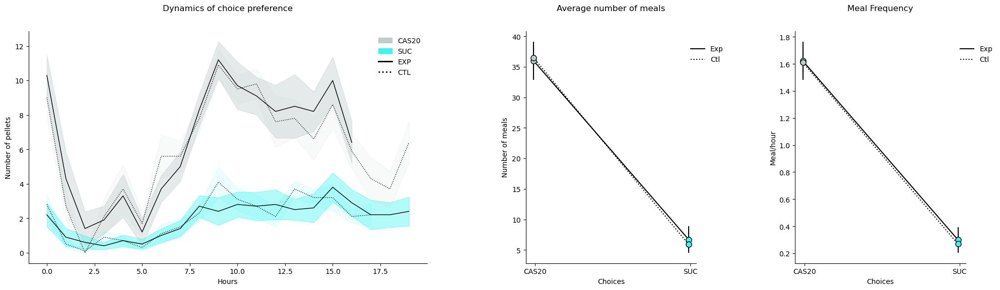

In [65]:

# Setup subplots
fig, (ax1, ax2, ax3) = plt.subplots(figsize=(24,6), ncols=3, 
                                    gridspec_kw={"width_ratios":[0.7,0.3,0.3], "wspace":0.4})

# Plot shaded errors on ax1
tp.shadedError(ax1, CAS20_FPR_C2, linecolor="black", errorcolor=high_protein_color)
tp.shadedError(ax1, SUC_FPR_C2, linecolor="black", errorcolor=low_protein_color)
tp.shadedError(ax1, CAS20_FNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
tp.shadedError(ax1, SUC_FNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

# Add legend to ax1
high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

# ax1 settings
ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# ax1 annotations and custom ticks (commented out for future use)
# ax1.axvline(6, color="k", linestyle=":", alpha=0.3)
# ax1.axvline(13, color="k", linestyle=":", alpha=0.3)
# ax1.set_xticks([0,6,13,20], labels=["1","7","14","21"])
# ax1.text(2.5, 3.25, "Epoch 1", ha="center")
# ax1.text(10, 3.25, "Epoch 2", ha="center")
# ax1.text(17.5, 3.25, "Epoch 3", ha="center")

# Plot lines and error bars on ax2
spacing = 0.01
x_positions = [1-spacing, 2-spacing]

# Plot MPR and MNR lines on ax2
ax2.plot(x_positions,
         [cas20_nmeal_fpr2.mean(), suc_nmeal_fpr2.mean()],
         linestyle="-", color="black", marker="", label="Exp")

ax2.plot(x_positions,
         [cas20_nmeal_fnr2.mean(), suc_nmeal_fnr2.mean()],
         linestyle="dotted", color="black", marker='', label="Ctl")

# Plot MPR error bars on ax2
ax2.errorbar([1-spacing], [cas20_nmeal_fpr2.mean()],
             yerr=[cas20_nmeal_fpr2.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax2.errorbar([2-spacing], [suc_nmeal_fpr2.mean()],
             yerr=[suc_nmeal_fpr2.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot MNR error bars on ax2
ax2.errorbar([1-spacing], [cas20_nmeal_fnr2.mean()],
             yerr=[cas20_nmeal_fnr2.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax2.errorbar([2-spacing], [suc_nmeal_fnr2.mean()],
             yerr=[suc_nmeal_fnr2.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# ax2 settings
ax2.set_xticks([1, 2], labels=["CAS20", "SUC"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Choices")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(loc=(0.95, 0.85), frameon=False)

# Plot lines and error bars on ax3 for meal frequencies
ax3.plot(x_positions,
         [mealfreq_cas20_fpr2.mean(), mealfreq_suc_fpr2.mean()],
         linestyle="-", color="black", marker="", label="Exp")

ax3.plot(x_positions,
         [mealfreq_cas20_fnr2.mean(), mealfreq_suc_fnr2.mean()],
         linestyle="dotted", color="black", marker='', label="Ctl")

# Plot MPR error bars on ax3
ax3.errorbar([1-spacing], [mealfreq_cas20_fpr2.mean()],
             yerr=[mealfreq_cas20_fpr2.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax3.errorbar([2-spacing], [mealfreq_suc_fpr2.mean()],
             yerr=[mealfreq_suc_fpr2.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot MNR error bars on ax3
ax3.errorbar([1-spacing], [mealfreq_cas20_fnr2.mean()],
             yerr=[mealfreq_cas20_fnr2.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax3.errorbar([2-spacing], [mealfreq_suc_fnr2.mean()],
             yerr=[mealfreq_suc_fnr2.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# ax3 settings
ax3.set_xticks([1, 2], labels=["CAS20", "SUC"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Choices")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(loc=(0.95, 0.85), frameon=False)

# Titles
ax1.set_title("Dynamics of choice preference", y=1.07)
ax2.set_title("Average number of meals", y=1.07)
ax3.set_title("Meal Frequency", y=1.07)

# Adjust subplot spacing
# fig.subplots_adjust(wspace=0.4)

# Annotations (commented out for future use)
# ax1.annotate("Ctl", [20, 2.3])
# ax1.annotate("Exp", [20, 2.5], color=exp_color)

# Save figure (commented out for future use)
# fig.savefig(fig_folder + "mealsize.pdf")

plt.show()


# <font color  = "cyan"> plot MALES CHOICE SESSION 3 <font/>

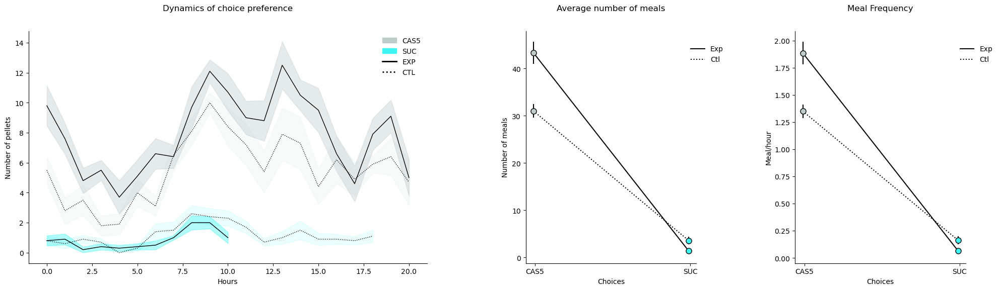

In [54]:

# Setup subplots
fig, (ax1, ax2, ax3) = plt.subplots(figsize=(24,6), ncols=3, 
                                    gridspec_kw={"width_ratios":[0.7,0.3,0.3], "wspace":0.4})

# Plot shaded errors on ax1
tp.shadedError(ax1, CAS5_MPR_C3, linecolor="black", errorcolor=high_protein_color)
tp.shadedError(ax1, SUC_MPR_C3, linecolor="black", errorcolor=low_protein_color)
tp.shadedError(ax1, CAS5_MNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
tp.shadedError(ax1, SUC_MNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

# Add legend to ax1
high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS5')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

# ax1 settings
ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# ax1 annotations and custom ticks (commented out for future use)
# ax1.axvline(6, color="k", linestyle=":", alpha=0.3)
# ax1.axvline(13, color="k", linestyle=":", alpha=0.3)
# ax1.set_xticks([0,6,13,20], labels=["1","7","14","21"])
# ax1.text(2.5, 3.25, "Epoch 1", ha="center")
# ax1.text(10, 3.25, "Epoch 2", ha="center")
# ax1.text(17.5, 3.25, "Epoch 3", ha="center")

# Plot lines and error bars on ax2
spacing = 0.01
x_positions = [1-spacing, 2-spacing]




# Plot MPR and MNR lines on ax2
ax2.plot(x_positions,
         [nmeal_cas5_mpr3.mean(), nmeal_suc_mpr3.mean()],
         linestyle="-", color="black", marker="", label="Exp")

ax2.plot(x_positions,
         [nmeal_cas5_mnr3.mean(), nmeal_suc_mnr3.mean()],
         linestyle="dotted", color="black", marker='', label="Ctl")

# Plot MPR error bars on ax2
ax2.errorbar([1-spacing], [nmeal_cas5_mpr3.mean()],
             yerr=[nmeal_cas5_mpr3.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax2.errorbar([2-spacing], [nmeal_suc_mpr3.mean()],
             yerr=[nmeal_suc_mpr3.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot MNR error bars on ax2
ax2.errorbar([1-spacing], [nmeal_cas5_mnr3.mean()],
             yerr=[nmeal_cas5_mnr3.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax2.errorbar([2-spacing], [nmeal_suc_mnr3.mean()],
             yerr=[nmeal_suc_mnr3.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# ax2 settings
ax2.set_xticks([1, 2], labels=["CAS5", "SUC"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Choices")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(loc=(0.95, 0.85), frameon=False)

# Plot lines and error bars on ax3 for meal frequencies
ax3.plot(x_positions,
         [mealfreq_cas5_mpr3.mean(), mealfreq_suc_mpr3.mean()],
         linestyle="-", color="black", marker="", label="Exp")

ax3.plot(x_positions,
         [mealfreq_cas5_mnr3.mean(), mealfreq_suc_mnr3.mean()],
         linestyle="dotted", color="black", marker='', label="Ctl")

# Plot MPR error bars on ax3
ax3.errorbar([1-spacing], [mealfreq_cas5_mpr3.mean()],
             yerr=[mealfreq_cas5_mpr3.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax3.errorbar([2-spacing], [mealfreq_suc_mpr3.mean()],
             yerr=[mealfreq_suc_mpr3.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot MNR error bars on ax3
ax3.errorbar([1-spacing], [mealfreq_cas5_mnr3.mean()],
             yerr=[mealfreq_cas5_mnr3.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax3.errorbar([2-spacing], [mealfreq_suc_mnr3.mean()],
             yerr=[mealfreq_suc_mnr3.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# ax3 settings
ax3.set_xticks([1, 2], labels=["CAS5", "SUC"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Choices")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(loc=(0.95, 0.85), frameon=False)

# Titles
ax1.set_title("Dynamics of choice preference", y=1.07)
ax2.set_title("Average number of meals", y=1.07)
ax3.set_title("Meal Frequency", y=1.07)

# Adjust subplot spacing
# fig.subplots_adjust(wspace=0.4)

# Annotations (commented out for future use)
# ax1.annotate("Ctl", [20, 2.3])
# ax1.annotate("Exp", [20, 2.5], color=exp_color)

# Save figure (commented out for future use)
# fig.savefig(fig_folder + "mealsize.pdf")

plt.show()


# <font color  = "cyan"> plot FEMALES CHOICE SESSION 3 <font/>

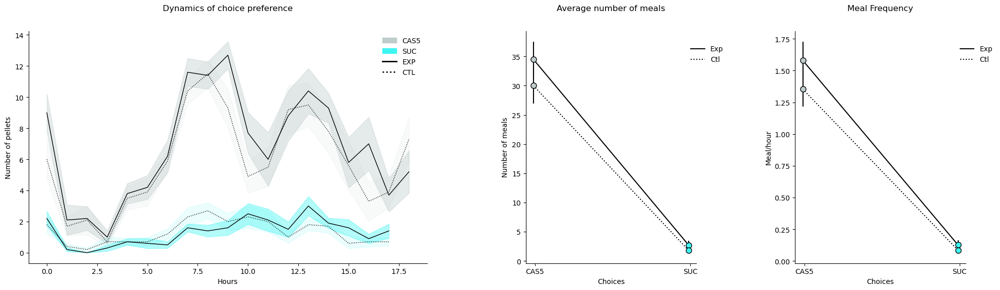

In [53]:

# Setup subplots
fig, (ax1, ax2, ax3) = plt.subplots(figsize=(24,6), ncols=3, 
                                    gridspec_kw={"width_ratios":[0.7,0.3,0.3], "wspace":0.4})

# Plot shaded errors on ax1
tp.shadedError(ax1, CAS5_FPR_C3, linecolor="black", errorcolor=high_protein_color)
tp.shadedError(ax1, SUC_FPR_C3, linecolor="black", errorcolor=low_protein_color)
tp.shadedError(ax1, CAS5_FNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
tp.shadedError(ax1, SUC_FNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

# Add legend to ax1
high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS5')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

# ax1 settings
ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# ax1 annotations and custom ticks (commented out for future use)
# ax1.axvline(6, color="k", linestyle=":", alpha=0.3)
# ax1.axvline(13, color="k", linestyle=":", alpha=0.3)
# ax1.set_xticks([0,6,13,20], labels=["1","7","14","21"])
# ax1.text(2.5, 3.25, "Epoch 1", ha="center")
# ax1.text(10, 3.25, "Epoch 2", ha="center")
# ax1.text(17.5, 3.25, "Epoch 3", ha="center")

# Plot lines and error bars on ax2
spacing = 0.01
x_positions = [1-spacing, 2-spacing]




# Plot MPR and MNR lines on ax2
ax2.plot(x_positions,
         [nmeal_cas5_fpr3.mean(), nmeal_suc_fpr3.mean()],
         linestyle="-", color="black", marker="", label="Exp")

ax2.plot(x_positions,
         [nmeal_cas5_fnr3.mean(), nmeal_suc_fnr3.mean()],
         linestyle="dotted", color="black", marker='', label="Ctl")

# Plot MPR error bars on ax2
ax2.errorbar([1-spacing], [nmeal_cas5_fpr3.mean()],
             yerr=[nmeal_cas5_fpr3.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax2.errorbar([2-spacing], [nmeal_suc_fpr3.mean()],
             yerr=[nmeal_suc_fpr3.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot MNR error bars on ax2
ax2.errorbar([1-spacing], [nmeal_cas5_fnr3.mean()],
             yerr=[nmeal_cas5_fnr3.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax2.errorbar([2-spacing], [nmeal_suc_fnr3.mean()],
             yerr=[nmeal_suc_fnr3.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# ax2 settings
ax2.set_xticks([1, 2], labels=["CAS5", "SUC"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Choices")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(loc=(0.95, 0.85), frameon=False)

# Plot lines and error bars on ax3 for meal frequencies
ax3.plot(x_positions,
         [mealfreq_cas5_fpr3.mean(), mealfreq_suc_fpr3.mean()],
         linestyle="-", color="black", marker="", label="Exp")

ax3.plot(x_positions,
         [mealfreq_cas5_fnr3.mean(), mealfreq_suc_fnr3.mean()],
         linestyle="dotted", color="black", marker='', label="Ctl")

# Plot MPR error bars on ax3
ax3.errorbar([1-spacing], [mealfreq_cas5_fpr3.mean()],
             yerr=[mealfreq_cas5_fpr3.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax3.errorbar([2-spacing], [mealfreq_suc_fpr3.mean()],
             yerr=[mealfreq_suc_fpr3.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot MNR error bars on ax3
ax3.errorbar([1-spacing], [mealfreq_cas5_fnr3.mean()],
             yerr=[mealfreq_cas5_fnr3.sem()],
             fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")

ax3.errorbar([2-spacing], [mealfreq_suc_fnr3.mean()],
             yerr=[mealfreq_suc_fnr3.sem()],
             fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")

# ax3 settings
ax3.set_xticks([1, 2], labels=["CAS5", "SUC"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Choices")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(loc=(0.95, 0.85), frameon=False)

# Titles
ax1.set_title("Dynamics of choice preference", y=1.07)
ax2.set_title("Average number of meals", y=1.07)
ax3.set_title("Meal Frequency", y=1.07)

# Adjust subplot spacing
# fig.subplots_adjust(wspace=0.4)

# Annotations (commented out for future use)
# ax1.annotate("Ctl", [20, 2.3])
# ax1.annotate("Exp", [20, 2.5], color=exp_color)

# Save figure (commented out for future use)
# fig.savefig(fig_folder + "mealsize.pdf")

plt.show()


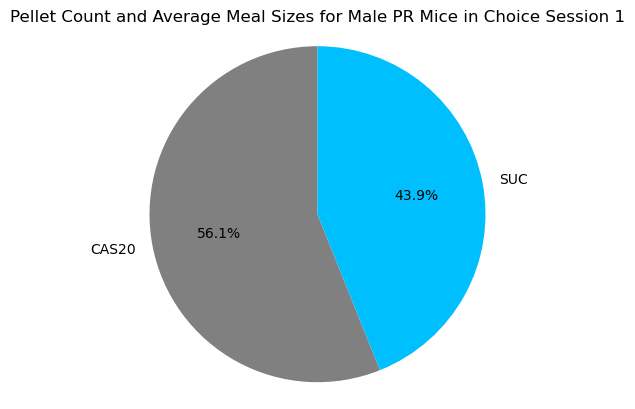

In [47]:
# Create a combined pie and doughnut plot
fig, ax = plt.subplots()
# The pie plot
ax.pie(average_ms_per_type_mnr2, labels=average_ms_per_type_mnr2.index, autopct='%1.1f%%', startangle=90, colors=[ctl_color, exp_color], radius=1)
# The doughnut plot, encircling the pie plot
# ax.pie(suc_ms_mpr2, startangle=90, wedgeprops=dict(width=0.1, edgecolor='w'), radius=1.15, colors=[ctl_color, exp_color])

plt.title('Pellet Count and Average Meal Sizes for Male PR Mice in Choice Session 1')
plt.axis('equal')  # Equal aspect ratio ensures that plots are drawn as circles.
plt.show()

In [32]:
# Filter the data for male PR mice in choice session 1
male_nr_ms_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
average_ms_per_type_mnr2= male_nr_ms_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

female_nr_ms_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
average_ms_per_type_fnr2= female_nr_ms_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()


male_pr_ms_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
average_ms_per_type_mpr2= male_pr_ms_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()


female_pr_ms_C2 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
average_ms_per_type_fpr2= female_pr_ms_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean().unstack()

cas20_ms_mpr2= average_ms_per_type_mpr2['CAS20']
suc_ms_mpr2= average_ms_per_type_mpr2['SUC']
cas20_ms_fpr2= average_ms_per_type_fpr2['CAS20']
suc_ms_fpr2= average_ms_per_type_fpr2['SUC']

cas20_ms_mnr2= average_ms_per_type_mnr2['CAS20']
suc_ms_mnr2= average_ms_per_type_mnr2['SUC']
cas20_ms_fnr2= average_ms_per_type_fnr2['CAS20']
suc_ms_fnr2= average_ms_per_type_fnr2['SUC']

group_data_male_pr_ms = [cas20_ms_mpr2.tolist(), suc_ms_mpr2.tolist()]
group_data_female_pr_ms = [cas20_ms_fpr2.tolist(), suc_ms_fpr2.tolist()]
group_data_male_nr_ms = [cas20_ms_mnr2.tolist(), suc_ms_mnr2.tolist()]
group_data_female_nr_ms = [cas20_ms_fnr2.tolist(), suc_ms_fnr2.tolist()]

In [39]:
average_ms_per_type_mnr2= male_nr_ms_C2.groupby(['MOUSEID', 'PELLET_TYPE'])['MEAL_SIZE'].mean()
average_ms_per_type_mnr2

MOUSEID   PELLET_TYPE
FEDXDM11  CAS20          3.360000
          SUC            2.470588
FEDXDM12  CAS20          2.269231
          SUC            2.333333
FEDXDM13  CAS20          3.052632
          SUC            2.272727
FEDXDM14  CAS20          3.292683
          SUC            2.000000
FEDXDM15  CAS20          3.205882
          SUC            2.333333
FEDXDM16  CAS20          2.406250
          SUC            2.090909
FEDXDM17  CAS20          2.783784
          SUC            2.000000
FEDXDM19  CAS20          2.750000
          SUC            2.461538
FEDXDM20  CAS20          2.526316
          SUC            2.133333
Name: MEAL_SIZE, dtype: float64

In [45]:
male_nr_ms_C2 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'NR')]
average_ms_per_type_mnr2= male_nr_ms_C2.groupby(['PELLET_TYPE'])['MEAL_SIZE'].mean()

male_pr_pellet_C1 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 2) & (data['DIET'] == 'PR')]
total_pellet_counts_male_pr = male_pr_pellet_C1.groupby('PELLET_TYPE')['COUNT'].mean()

In [46]:
average_ms_per_type_mnr2

PELLET_TYPE
CAS20    2.849642
SUC      2.232863
Name: MEAL_SIZE, dtype: float64

# plotting Choice 1 meal component 

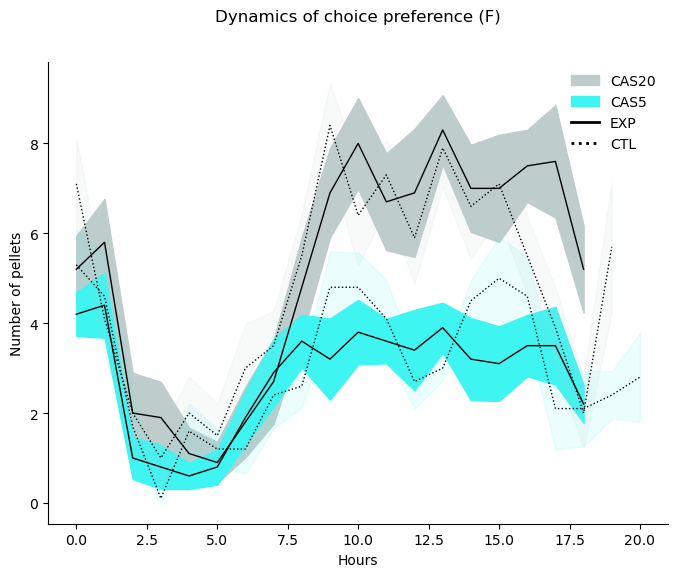

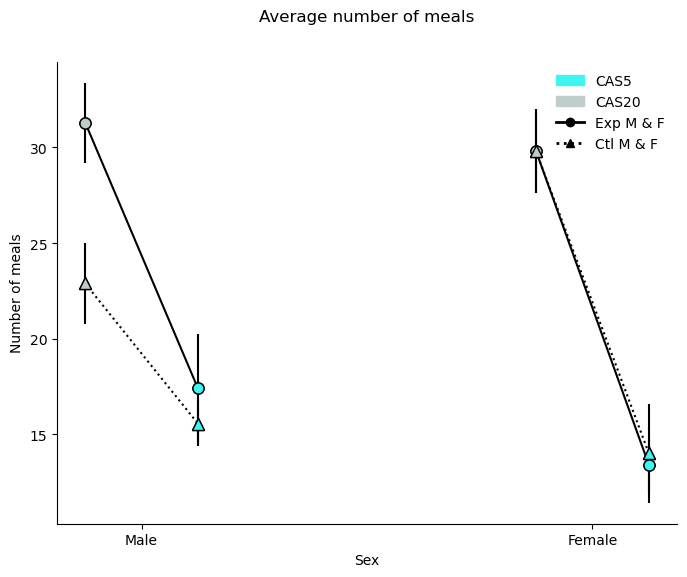

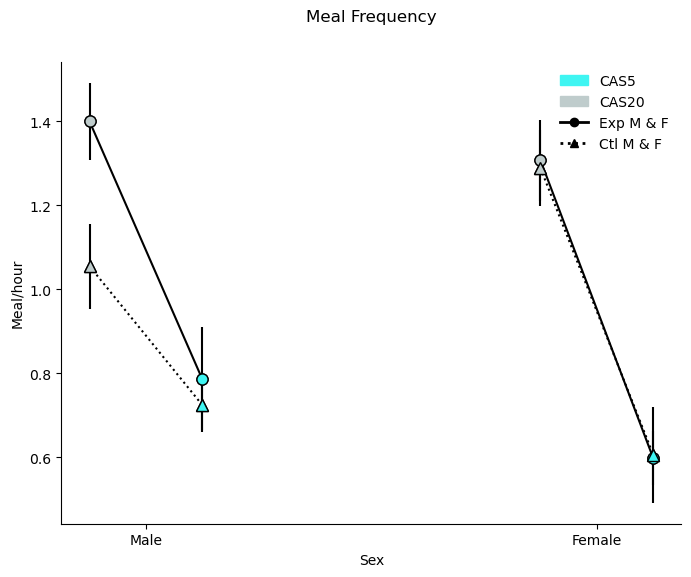

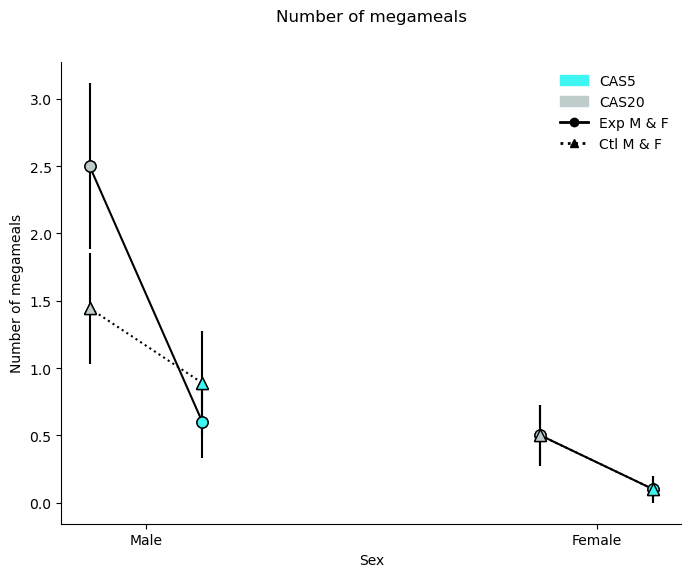

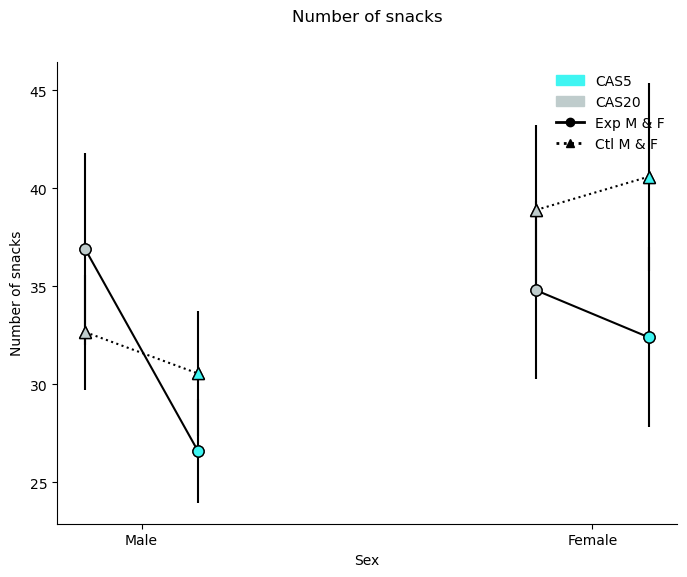

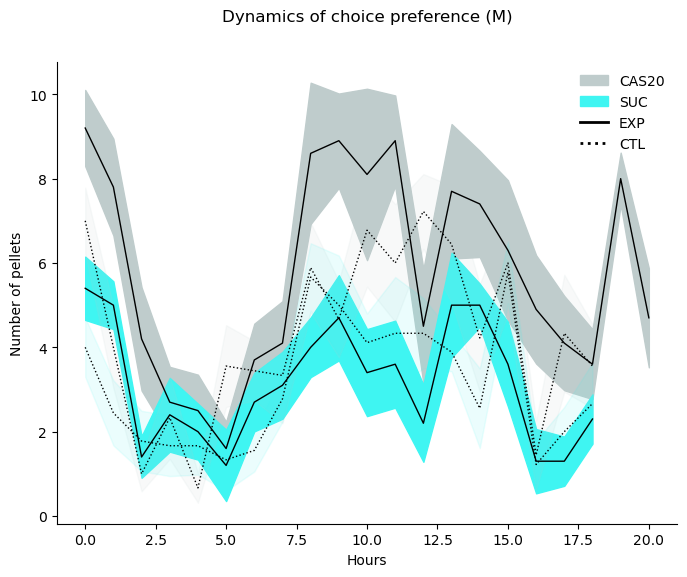

In [21]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Define the color values
high_protein_color = (0.749, 0.8, 0.8)  # High protein color
low_protein_color = (0.247, 0.961, 0.949)  # Low protein color
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)

# Plot for number of pellets (ax1)
fig1, ax1 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax1, CAS20_FPR_C1, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax1, CAS5_FPR_C1, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax1, CAS20_FNR_C1, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax1, CAS5_FNR_C1, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='CAS5')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.set_title("Dynamics of choice preference (F)", y=1.07)
plt.show()

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label):
    ax.plot(x_positions,
            [data_exp[0].mean(), data_exp[1].mean()],
            linestyle="-", color="black", marker="o", label=exp_label, markersize=8)
    ax.plot(x_positions,
            [data_ctl[0].mean(), data_ctl[1].mean()],
            linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=8)
    ax.errorbar([x_positions[0]], [data_exp[0].mean()],
                yerr=[data_exp[0].sem()],
                fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [data_exp[1].mean()],
                yerr=[data_exp[1].sem()],
                fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[0]], [data_ctl[0].mean()],
                yerr=[data_ctl[0].sem()],
                fmt='^', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [data_ctl[1].mean()],
                yerr=[data_ctl[1].sem()],
                fmt='^', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(8, 6))
x_positions_male = [1, 1.5]
x_positions_female = [3, 3.5]
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_cas20_mpr1, number_of_meals_cas5_mpr1],
                      [number_of_meals_cas20_mnr1, number_of_meals_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_cas20_fpr1, number_of_meals_cas5_fpr1],
                      [number_of_meals_cas20_fnr1, number_of_meals_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax2.set_xticks([1.25, 3.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Sex")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax2.set_title("Average number of meals", y=1.07)
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_cas20_mpr1, meal_frequency_cas5_mpr1],
                      [meal_frequency_cas20_mnr1, meal_frequency_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_cas20_fpr1, meal_frequency_cas5_fpr1],
                      [meal_frequency_cas20_fnr1, meal_frequency_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax3.set_xticks([1.25, 3.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Sex")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax3.set_title("Meal Frequency", y=1.07)
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_cas20_mpr1, NUMBER_OF_MEGA_MEALS_cas5_mpr1],
                      [NUMBER_OF_MEGA_MEALS_cas20_mnr1, NUMBER_OF_MEGA_MEALS_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_cas20_fpr1, NUMBER_OF_MEGA_MEALS_cas5_fpr1],
                      [NUMBER_OF_MEGA_MEALS_cas20_fnr1, NUMBER_OF_MEGA_MEALS_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax4.set_xticks([1.25, 3.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals")
ax4.set_xlabel("Sex")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax4.set_title("Number of megameals", y=1.07)
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_cas20_mpr1, NUMBER_OF_SNACKS_cas5_mpr1],
                      [NUMBER_OF_SNACKS_cas20_mnr1, NUMBER_OF_SNACKS_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_cas20_fpr1, NUMBER_OF_SNACKS_cas5_fpr1],
                      [NUMBER_OF_SNACKS_cas20_fnr1, NUMBER_OF_SNACKS_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax5.set_xticks([1.25, 3.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("Sex")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax6, CAS20_MPR_C1, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, CAS5_MPR_C1, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS20_MNR_C1, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, CAS5_MNR_C1, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax6.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax6.set_ylabel("Number of pellets")
ax6.set_xlabel("Hours")
ax6.spines["top"].set_visible(False)
ax6.spines["right"].set_visible(False)
ax6.set_title("Dynamics of choice preference (M)", y=1.07)
plt.show()


# plotting choice 2 meal components 

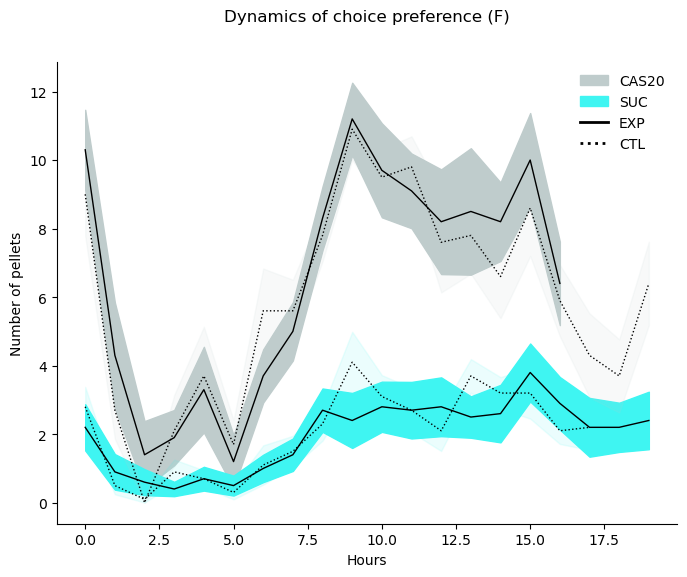

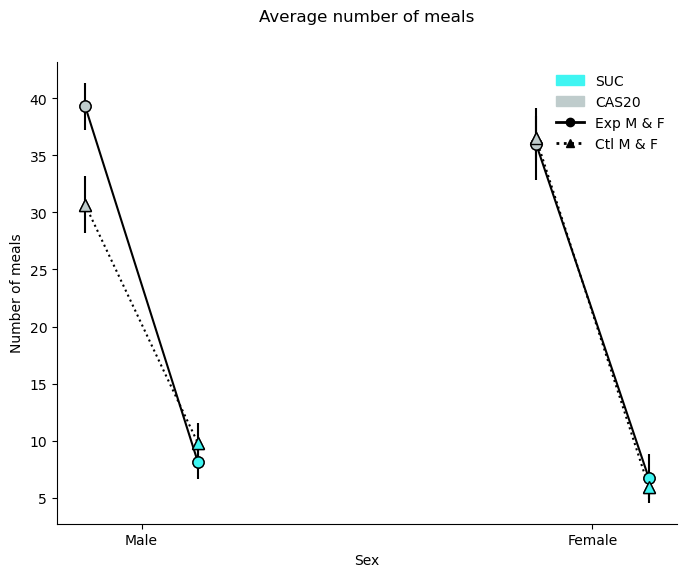

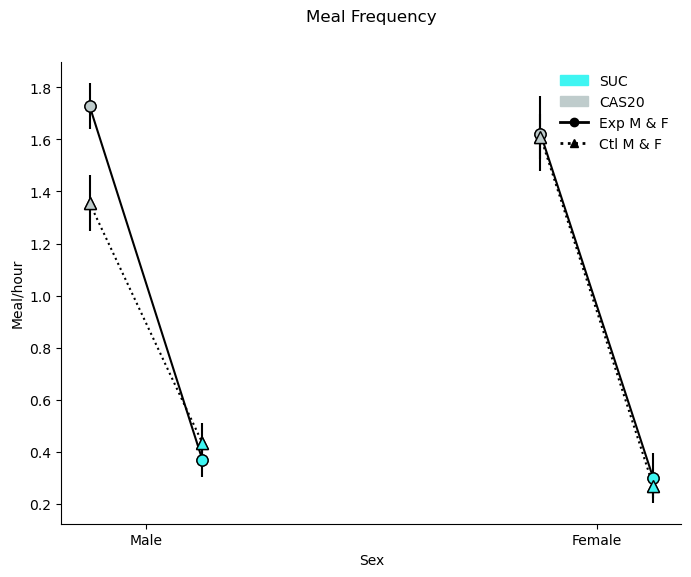

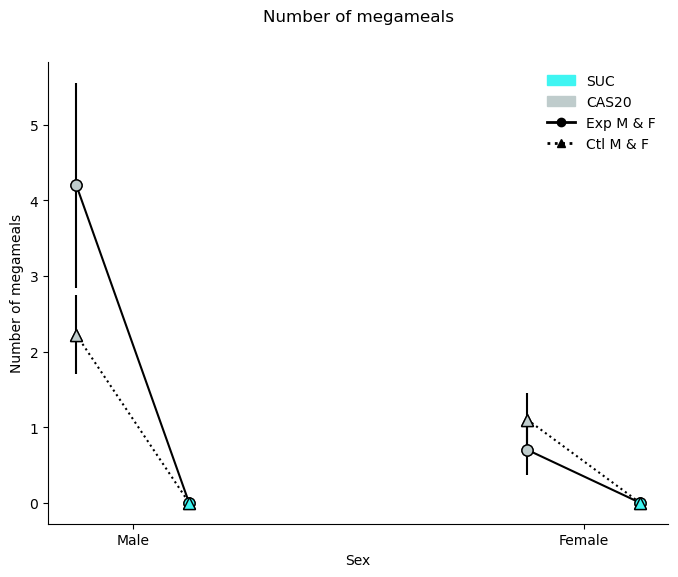

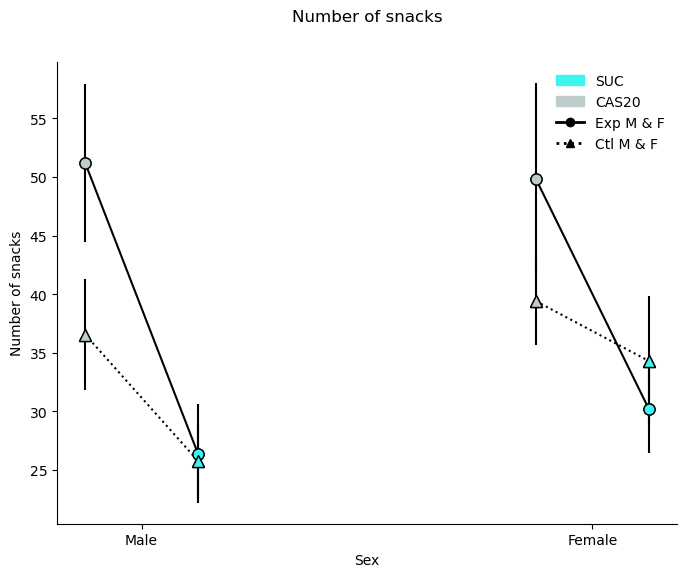

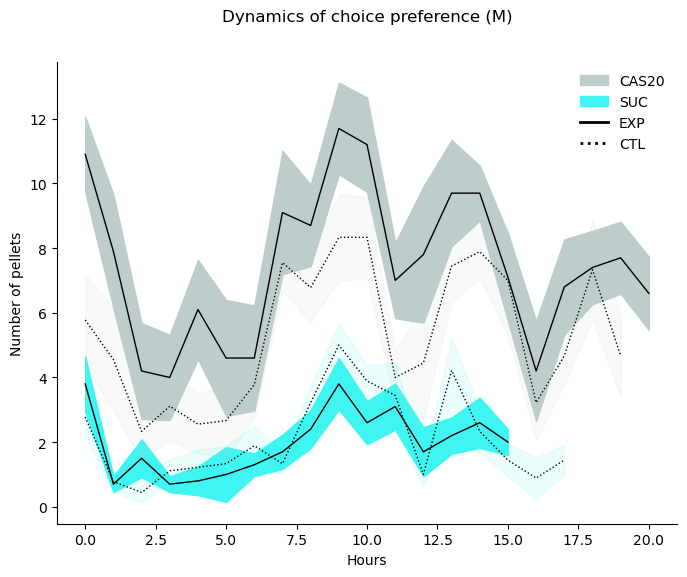

In [50]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Define the color values
high_protein_color = (0.749, 0.8, 0.8)  # High protein color
low_protein_color = (0.247, 0.961, 0.949)  # Low protein color
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)

# Plot for number of pellets (ax1)
fig1, ax1 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax1, CAS20_FPR_C2, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax1, SUC_FPR_C2, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax1, CAS20_FNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax1, SUC_FNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.set_title("Dynamics of choice preference (F)", y=1.07)
plt.show()

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label):
    ax.plot(x_positions,
            [data_exp[0].mean(), data_exp[1].mean()],
            linestyle="-", color="black", marker="o", label=exp_label, markersize=8)
    ax.plot(x_positions,
            [data_ctl[0].mean(), data_ctl[1].mean()],
            linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=8)
    ax.errorbar([x_positions[0]], [data_exp[0].mean()],
                yerr=[data_exp[0].sem()],
                fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [data_exp[1].mean()],
                yerr=[data_exp[1].sem()],
                fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[0]], [data_ctl[0].mean()],
                yerr=[data_ctl[0].sem()],
                fmt='^', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [data_ctl[1].mean()],
                yerr=[data_ctl[1].sem()],
                fmt='^', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(8, 6))
x_positions_male = [1, 1.5]
x_positions_female = [3, 3.5]
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_cas20_mpr2, number_of_meals_suc_mpr2],
                      [number_of_meals_cas20_mnr2, number_of_meals_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_cas20_fpr2, number_of_meals_suc_fpr2],
                      [number_of_meals_cas20_fnr2, number_of_meals_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax2.set_xticks([1.25, 3.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Sex")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax2.set_title("Average number of meals", y=1.07)
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_cas20_mpr2, meal_frequency_suc_mpr2],
                      [meal_frequency_cas20_mnr2, meal_frequency_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_cas20_fpr2, meal_frequency_suc_fpr2],
                      [meal_frequency_cas20_fnr2, meal_frequency_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax3.set_xticks([1.25, 3.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Sex")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax3.set_title("Meal Frequency", y=1.07)
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_cas20_mpr2, NUMBER_OF_MEGA_MEALS_suc_mpr2],
                      [NUMBER_OF_MEGA_MEALS_cas20_mnr2, NUMBER_OF_MEGA_MEALS_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_cas20_fpr2, NUMBER_OF_MEGA_MEALS_suc_fpr2],
                      [NUMBER_OF_MEGA_MEALS_cas20_fnr2, NUMBER_OF_MEGA_MEALS_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax4.set_xticks([1.25, 3.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals")
ax4.set_xlabel("Sex")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax4.set_title("Number of megameals", y=1.07)
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_cas20_mpr2, NUMBER_OF_SNACKS_suc_mpr2],
                      [NUMBER_OF_SNACKS_cas20_mnr2, NUMBER_OF_SNACKS_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_cas20_fpr2, NUMBER_OF_SNACKS_suc_fpr2],
                      [NUMBER_OF_SNACKS_cas20_fnr2, NUMBER_OF_SNACKS_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax5.set_xticks([1.25, 3.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("Sex")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax6, CAS20_MPR_C2, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, SUC_MPR_C2, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS20_MNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, SUC_MNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax6.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax6.set_ylabel("Number of pellets")
ax6.set_xlabel("Hours")
ax6.spines["top"].set_visible(False)
ax6.spines["right"].set_visible(False)
ax6.set_title("Dynamics of choice preference (M)", y=1.07)
plt.show()


c:\Users\hta031\AppData\Local\miniconda3\envs\DATA\Lib\site-packages\trompy\barscatter.py:304: UserWarning: positions is not a functional keyword argument. Check spelling or barscatter version.
  warnings.warn("{} is not a functional keyword argument. Check spelling or barscatter version.".format(key))


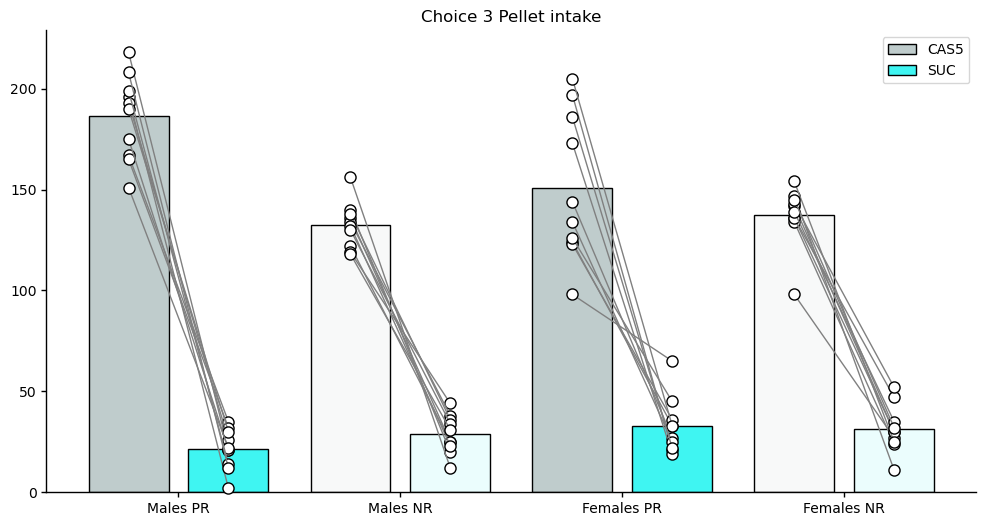

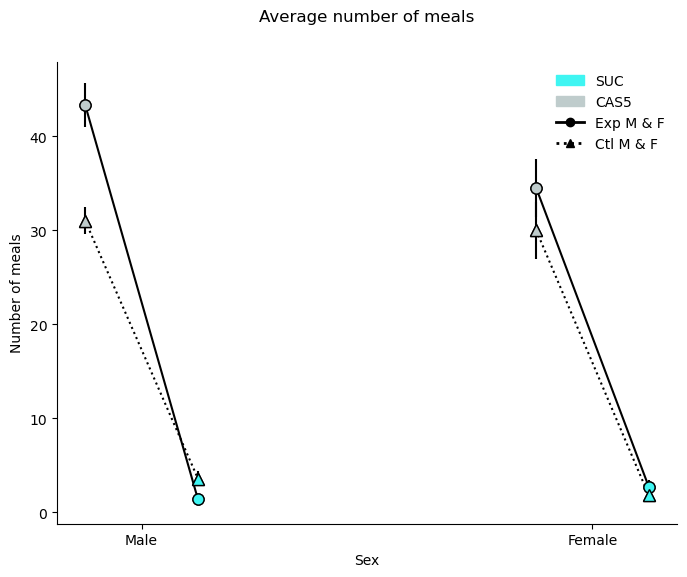

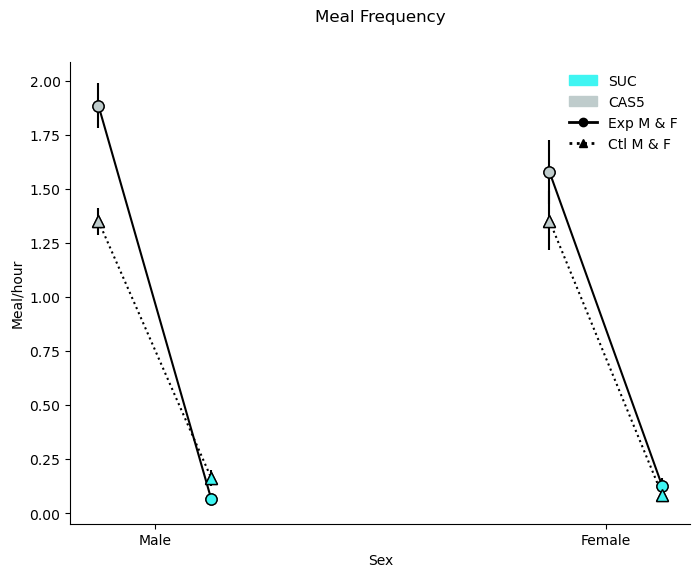

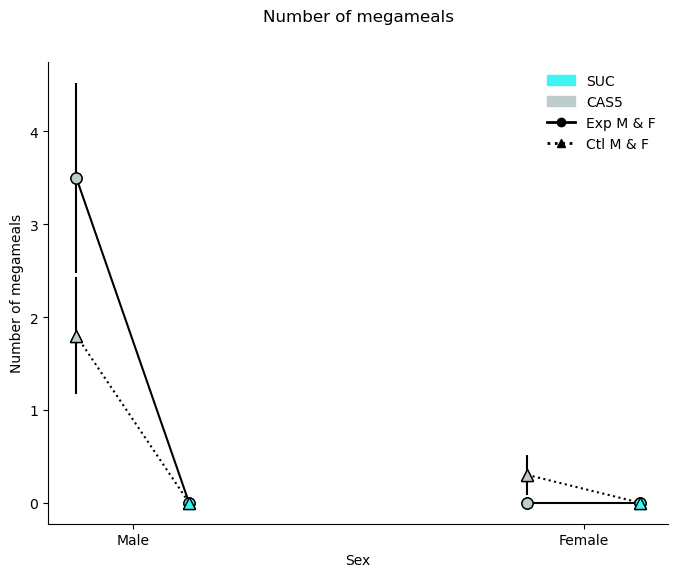

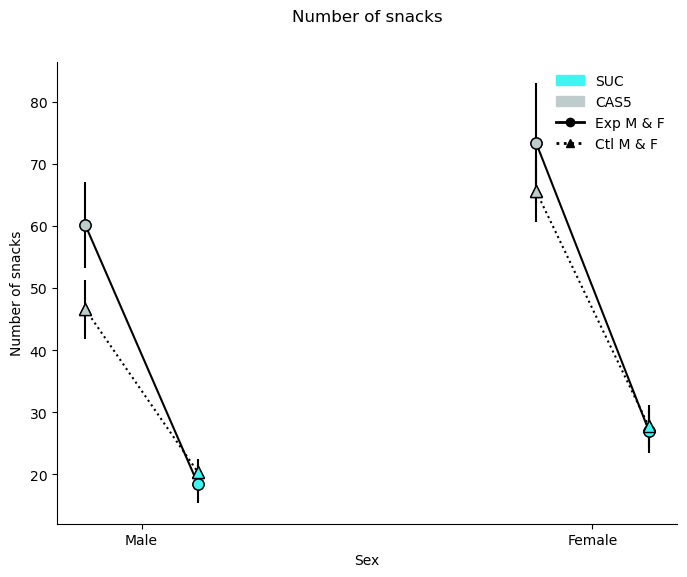

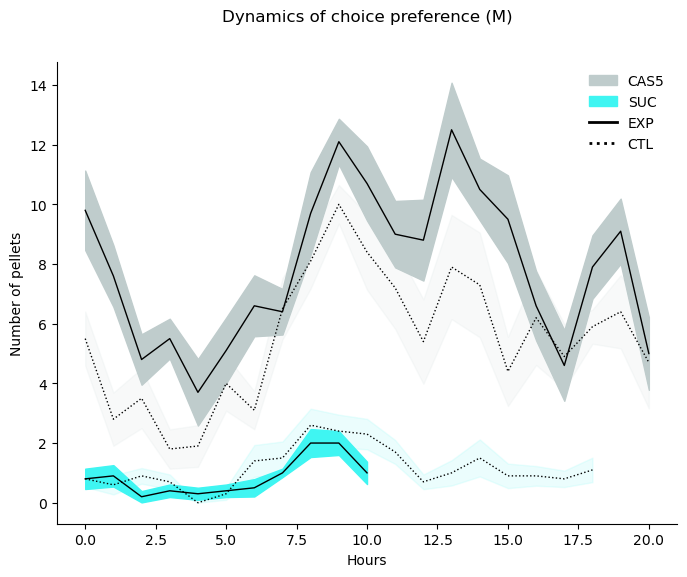

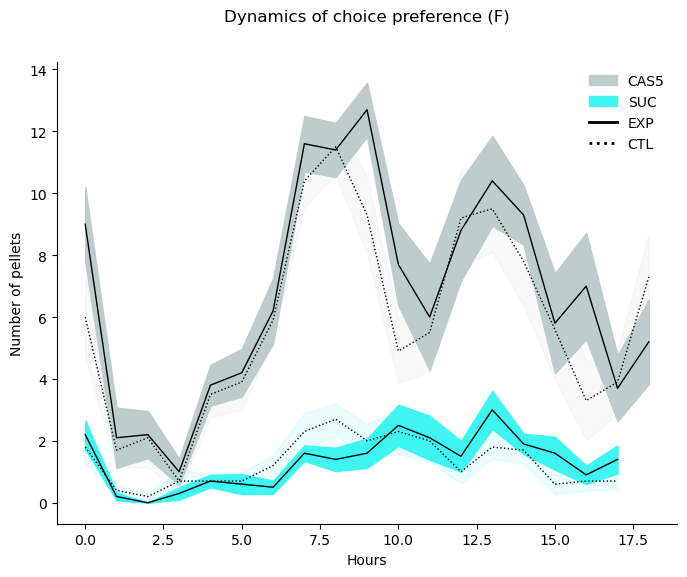

In [59]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Define the color values
high_protein_color = (0.749, 0.8, 0.8)  # High protein color
low_protein_color = (0.247, 0.961, 0.949)  # Low protein color
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)

# Filter the data for Choice Session 3
pellet_count_male_nr_pellet_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
pellet_count_average_pellets_per_type_mnr3 = pellet_count_male_nr_pellet_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_female_nr_pellet_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'NR')]
pellet_count_average_pellets_per_type_fnr3 = pellet_count_female_nr_pellet_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_male_pr_pellet_C3 = data[(data['SEX'] == 'M') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
pellet_count_average_pellets_per_type_mpr3 = pellet_count_male_pr_pellet_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_female_pr_pellet_C3 = data[(data['SEX'] == 'F') & (data['CHOICE_SESSION'] == 3) & (data['DIET'] == 'PR')]
pellet_count_average_pellets_per_type_fpr3 = pellet_count_female_pr_pellet_C3.groupby(['MOUSEID', 'PELLET_TYPE'])['COUNT'].mean().unstack()

pellet_count_CAS5_mpr3 = pellet_count_average_pellets_per_type_mpr3['CAS5']
pellet_count_suc_mpr3 = pellet_count_average_pellets_per_type_mpr3['SUC']
pellet_count_CAS5_fpr3 = pellet_count_average_pellets_per_type_fpr3['CAS5']
pellet_count_suc_fpr3 = pellet_count_average_pellets_per_type_fpr3['SUC']

pellet_count_CAS5_mnr3 = pellet_count_average_pellets_per_type_mnr3['CAS5']
pellet_count_suc_mnr3 = pellet_count_average_pellets_per_type_mnr3['SUC']
pellet_count_CAS5_fnr3 = pellet_count_average_pellets_per_type_fnr3['CAS5']
pellet_count_suc_fnr3 = pellet_count_average_pellets_per_type_fnr3['SUC']

pellet_count_group_data_male_pr = [pellet_count_CAS5_mpr3.tolist(), pellet_count_suc_mpr3.tolist()]
pellet_count_group_data_female_pr = [pellet_count_CAS5_fpr3.tolist(), pellet_count_suc_fpr3.tolist()]
pellet_count_group_data_male_nr = [pellet_count_CAS5_mnr3.tolist(), pellet_count_suc_mnr3.tolist()]
pellet_count_group_data_female_nr = [pellet_count_CAS5_fnr3.tolist(), pellet_count_suc_fnr3.tolist()]

# Plotting using barscatter
f, ax = plt.subplots(figsize=(12, 6))
_, _, barlist, _ = tp.barscatter([pellet_count_group_data_male_pr, pellet_count_group_data_male_nr, pellet_count_group_data_female_pr, pellet_count_group_data_female_nr],
                                  ax=ax, paired=True, linewidth=1, groupwidth=0.90,
                                  barfacecolor_option="individual",
                                  baredgecolor=["black"]*10,
                                  barfacecolor=[high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha, high_protein_color, low_protein_color, high_protein_color_alpha, low_protein_color_alpha],
                                  positions=[1, 1.5, 3, 3.5], # Adjust positions for clarity
                                  )

ax.set_title("Choice 3 Pellet intake")
ax.legend(barlist, ['CAS5', 'SUC'])

# Set custom x-axis labels
pellet_count_group_labels = ['Males PR', 'Males NR', 'Females PR', 'Females NR']
ax.set_xticks([1, 2, 3, 4])  # Mid-point of each group of bars
ax.set_xticklabels(pellet_count_group_labels)

plt.show()

# Plotting other metrics using the same structure as above

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label):
    ax.plot(x_positions,
            [data_exp[0].mean(), data_exp[1].mean()],
            linestyle="-", color="black", marker="o", label=exp_label, markersize=8)
    ax.plot(x_positions,
            [data_ctl[0].mean(), data_ctl[1].mean()],
            linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=8)
    ax.errorbar([x_positions[0]], [data_exp[0].mean()],
                yerr=[data_exp[0].sem()],
                fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [data_exp[1].mean()],
                yerr=[data_exp[1].sem()],
                fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[0]], [data_ctl[0].mean()],
                yerr=[data_ctl[0].sem()],
                fmt='^', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [data_ctl[1].mean()],
                yerr=[data_ctl[1].sem()],
                fmt='^', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(8, 6))
x_positions_male = [1, 1.5]
x_positions_female = [3, 3.5]
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_CAS5_mpr3, number_of_meals_suc_mpr3],
                      [number_of_meals_CAS5_mnr3, number_of_meals_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_CAS5_fpr3, number_of_meals_suc_fpr3],
                      [number_of_meals_CAS5_fnr3, number_of_meals_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax2.set_xticks([1.25, 3.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Sex")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax2.set_title("Average number of meals", y=1.07)
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_CAS5_mpr3, meal_frequency_suc_mpr3],
                      [meal_frequency_CAS5_mnr3, meal_frequency_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_CAS5_fpr3, meal_frequency_suc_fpr3],
                      [meal_frequency_CAS5_fnr3, meal_frequency_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax3.set_xticks([1.25, 3.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Sex")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax3.set_title("Meal Frequency", y=1.07)
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_CAS5_mpr3, NUMBER_OF_MEGA_MEALS_suc_mpr3],
                      [NUMBER_OF_MEGA_MEALS_CAS5_mnr3, NUMBER_OF_MEGA_MEALS_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_CAS5_fpr3, NUMBER_OF_MEGA_MEALS_suc_fpr3],
                      [NUMBER_OF_MEGA_MEALS_CAS5_fnr3, NUMBER_OF_MEGA_MEALS_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax4.set_xticks([1.25, 3.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals")
ax4.set_xlabel("Sex")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax4.set_title("Number of megameals", y=1.07)
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_CAS5_mpr3, NUMBER_OF_SNACKS_suc_mpr3],
                      [NUMBER_OF_SNACKS_CAS5_mnr3, NUMBER_OF_SNACKS_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_CAS5_fpr3, NUMBER_OF_SNACKS_suc_fpr3],
                      [NUMBER_OF_SNACKS_CAS5_fnr3, NUMBER_OF_SNACKS_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax5.set_xticks([1.25, 3.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("Sex")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax6, CAS5_MPR_C3, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, SUC_MPR_C3, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS5_MNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, SUC_MNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS5')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax6.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax6.set_ylabel("Number of pellets")
ax6.set_xlabel("Hours")
ax6.spines["top"].set_visible(False)
ax6.spines["right"].set_visible(False)
ax6.set_title("Dynamics of choice preference (M)", y=1.07)
plt.show()

# Plot for shaded error (F) (ax7)
fig7, ax7 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax7, CAS5_FPR_C3, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax7, SUC_FPR_C3, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax7, CAS5_FNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax7, SUC_FNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS5')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax7.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax7.set_ylabel("Number of pellets")
ax7.set_xlabel("Hours")
ax7.spines["top"].set_visible(False)
ax7.spines["right"].set_visible(False)
ax7.set_title("Dynamics of choice preference (F)", y=1.07)
plt.show()


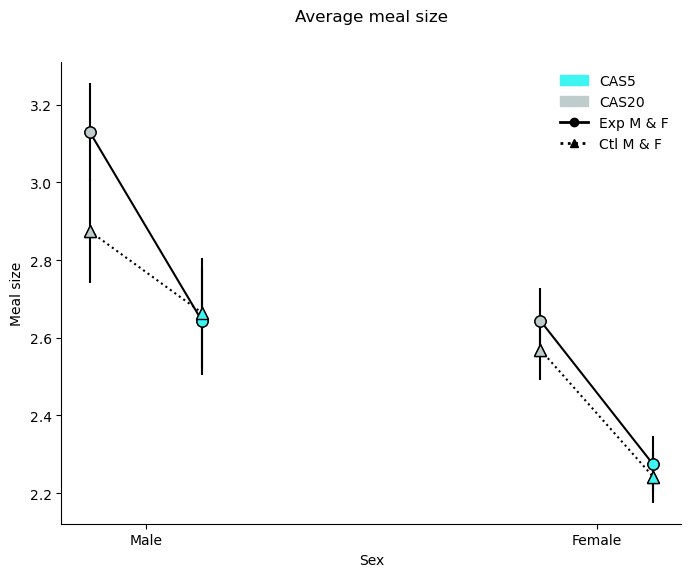

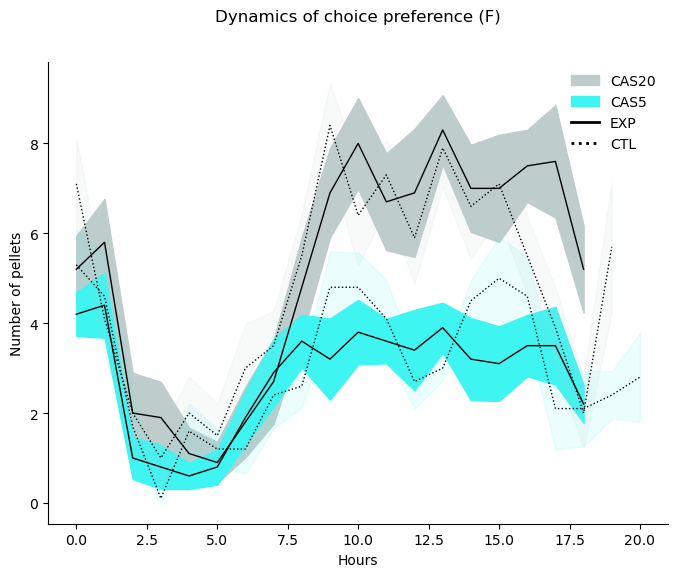

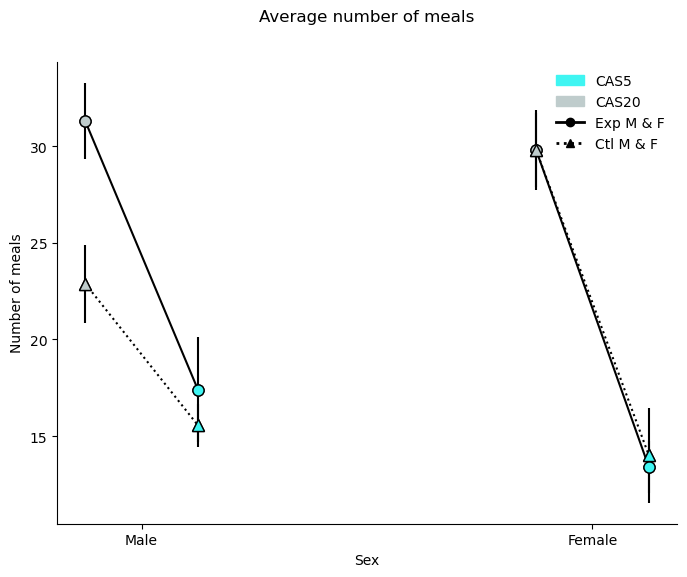

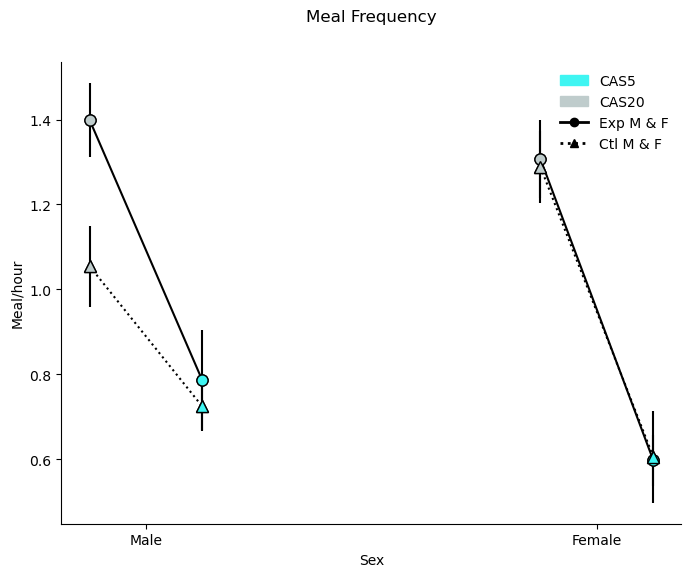

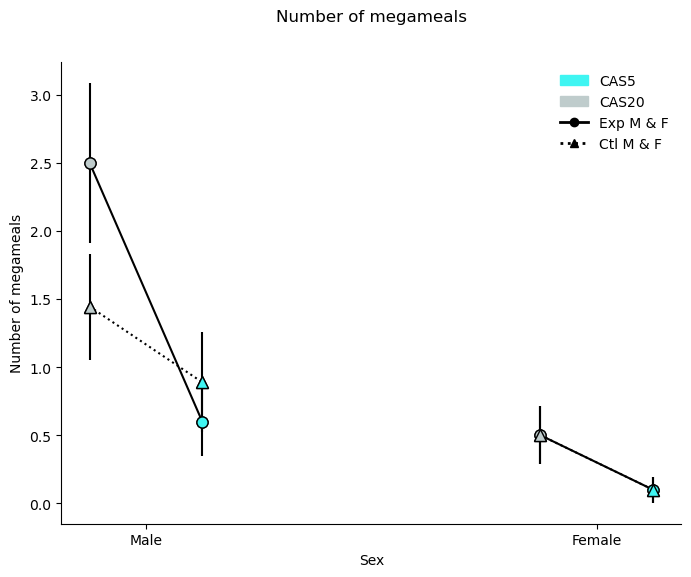

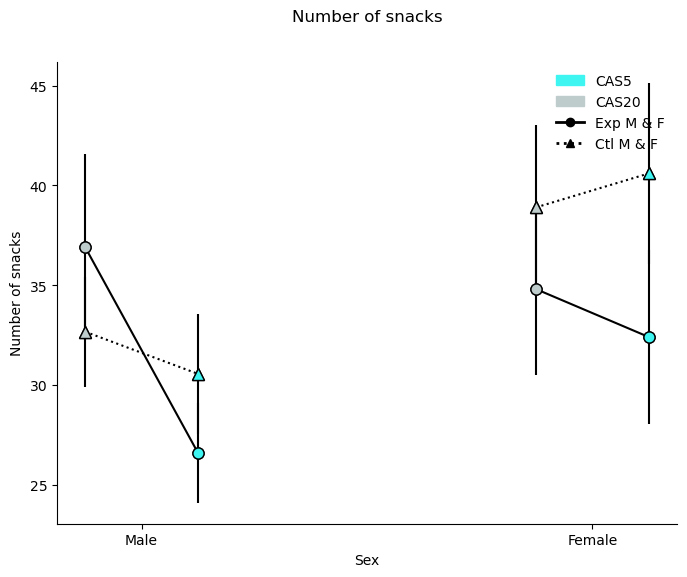

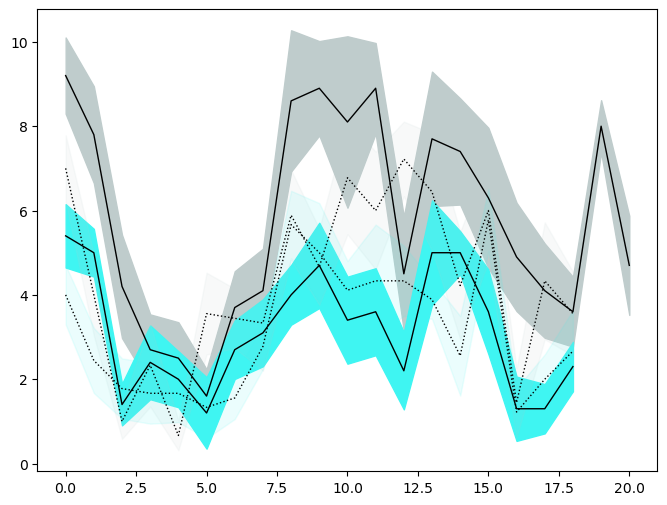

In [36]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import numpy as np



# Define the color values
high_protein_color = (0.749, 0.8, 0.8)  # High protein color
low_protein_color = (0.247, 0.961, 0.949)  # Low protein color
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label):
    ax.plot(x_positions,
            [np.mean(data_exp[0]), np.mean(data_exp[1])],
            linestyle="-", color="black", marker="o", label=exp_label, markersize=8)
    ax.plot(x_positions,
            [np.mean(data_ctl[0]), np.mean(data_ctl[1])],
            linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=8)
    ax.errorbar([x_positions[0]], [np.mean(data_exp[0])],
                yerr=[np.std(data_exp[0])/np.sqrt(len(data_exp[0]))],
                fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_exp[1])],
                yerr=[np.std(data_exp[1])/np.sqrt(len(data_exp[1]))],
                fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[0]], [np.mean(data_ctl[0])],
                yerr=[np.std(data_ctl[0])/np.sqrt(len(data_ctl[0]))],
                fmt='^', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_ctl[1])],
                yerr=[np.std(data_ctl[1])/np.sqrt(len(data_ctl[1]))],
                fmt='^', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot for meal size (new plot)
fig_mealsize, ax_mealsize = plt.subplots(figsize=(8, 6))
x_positions_male = [1, 1.5]
x_positions_female = [3, 3.5]
plot_data_with_markers(ax_mealsize, x_positions_male,
                      [mealsize_cas20_mpr1, mealsize_cas5_mpr1],
                      [mealsize_cas20_mnr1, mealsize_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax_mealsize, x_positions_female,
                      [mealsize_cas20_fpr1, mealsize_cas5_fpr1],
                      [mealsize_cas20_fnr1, mealsize_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax_mealsize.set_xticks([1.25, 3.25])
ax_mealsize.set_xticklabels(["Male", "Female"])
ax_mealsize.set_ylabel("Meal size")
ax_mealsize.set_xlabel("Sex")
ax_mealsize.spines["top"].set_visible(False)
ax_mealsize.spines["right"].set_visible(False)
ax_mealsize.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax_mealsize.set_title("Average meal size", y=1.07)
plt.show()

# Plot for number of pellets (ax1)
fig1, ax1 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax1, CAS20_FPR_C1, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax1, CAS5_FPR_C1, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax1, CAS20_FNR_C1, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax1, CAS5_FNR_C1, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='CAS5')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.set_title("Dynamics of choice preference (F)", y=1.07)
plt.show()

# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_cas20_mpr1, number_of_meals_cas5_mpr1],
                      [number_of_meals_cas20_mnr1, number_of_meals_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_cas20_fpr1, number_of_meals_cas5_fpr1],
                      [number_of_meals_cas20_fnr1, number_of_meals_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax2.set_xticks([1.25, 3.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Sex")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax2.set_title("Average number of meals", y=1.07)
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_cas20_mpr1, meal_frequency_cas5_mpr1],
                      [meal_frequency_cas20_mnr1, meal_frequency_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_cas20_fpr1, meal_frequency_cas5_fpr1],
                      [meal_frequency_cas20_fnr1, meal_frequency_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax3.set_xticks([1.25, 3.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Sex")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax3.set_title("Meal Frequency", y=1.07)
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_cas20_mpr1, NUMBER_OF_MEGA_MEALS_cas5_mpr1],
                      [NUMBER_OF_MEGA_MEALS_cas20_mnr1, NUMBER_OF_MEGA_MEALS_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_cas20_fpr1, NUMBER_OF_MEGA_MEALS_cas5_fpr1],
                      [NUMBER_OF_MEGA_MEALS_cas20_fnr1, NUMBER_OF_MEGA_MEALS_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax4.set_xticks([1.25, 3.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals")
ax4.set_xlabel("Sex")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax4.set_title("Number of megameals", y=1.07)
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_cas20_mpr1, NUMBER_OF_SNACKS_cas5_mpr1],
                      [NUMBER_OF_SNACKS_cas20_mnr1, NUMBER_OF_SNACKS_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_cas20_fpr1, NUMBER_OF_SNACKS_cas5_fpr1],
                      [NUMBER_OF_SNACKS_cas20_fnr1, NUMBER_OF_SNACKS_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax5.set_xticks([1.25, 3.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("Sex")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax6, CAS20_MPR_C1, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, CAS5_MPR_C1, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS20_MNR_C1, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, CAS5_MNR_C1, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)








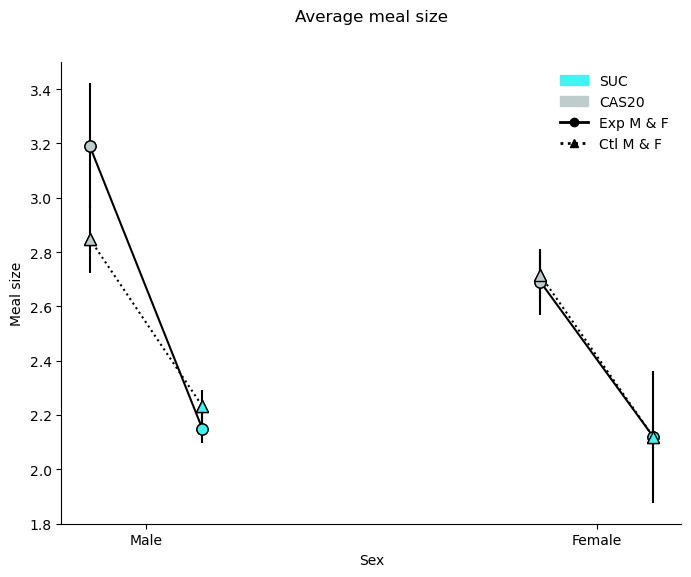

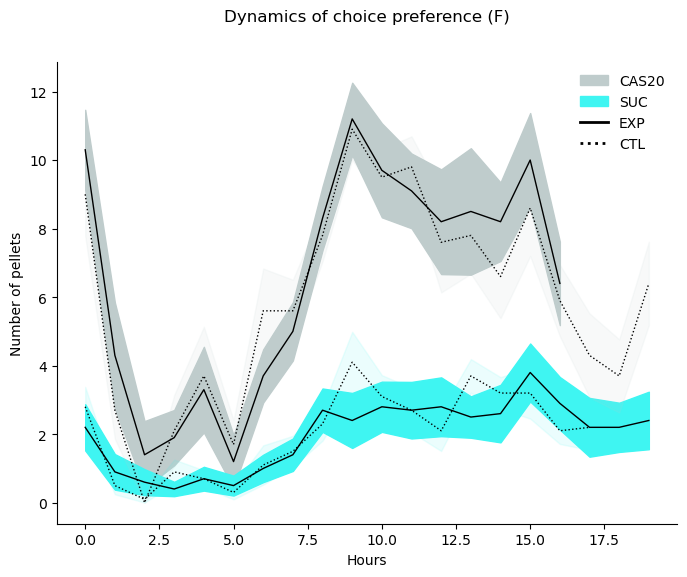

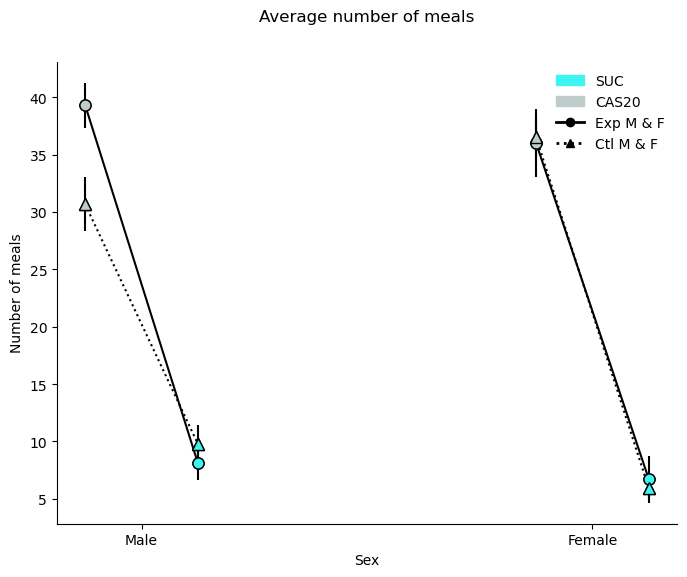

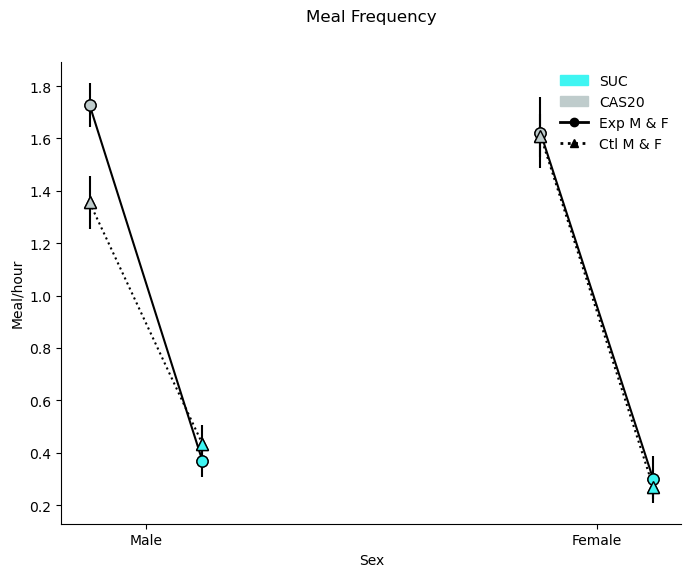

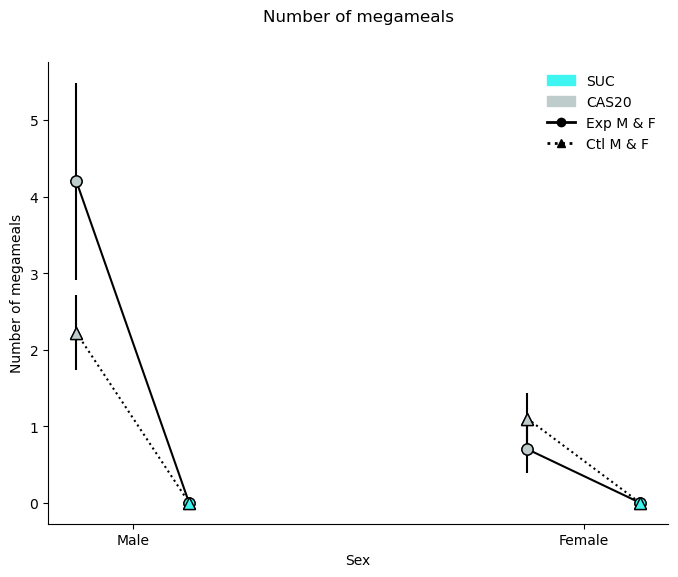

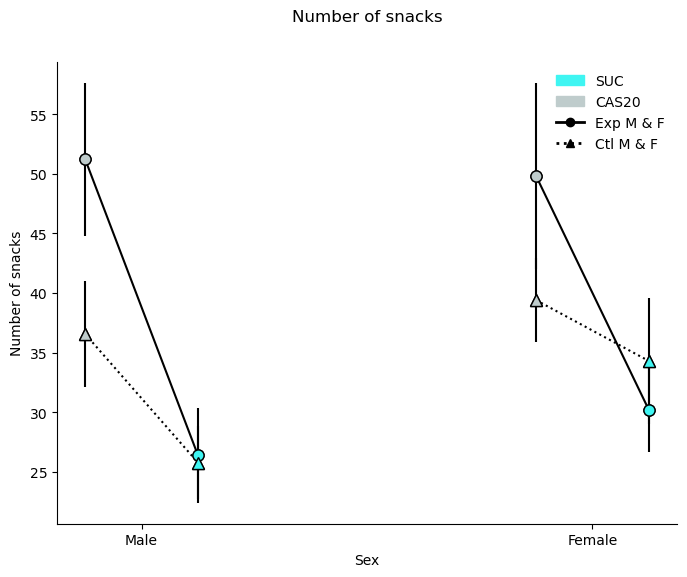

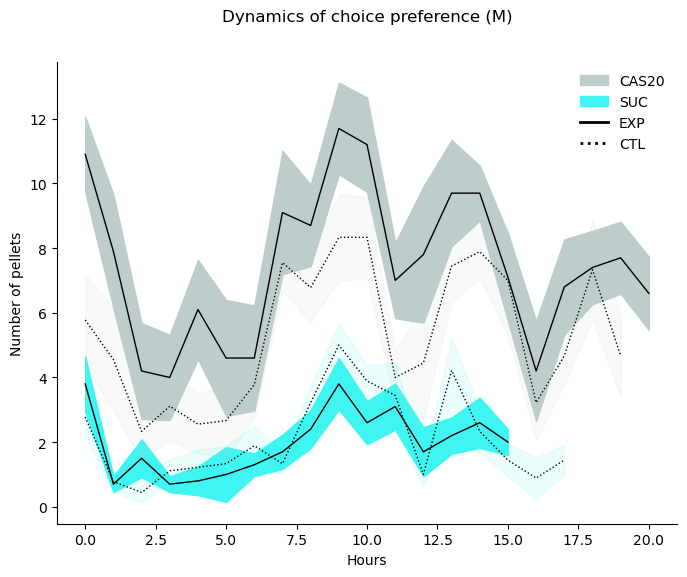

In [27]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import numpy as np

# Define the color values
high_protein_color = (0.749, 0.8, 0.8)  # High protein color
low_protein_color = (0.247, 0.961, 0.949)  # Low protein color
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label):
    ax.plot(x_positions,
            [np.mean(data_exp[0]), np.mean(data_exp[1])],
            linestyle="-", color="black", marker="o", label=exp_label, markersize=8)
    ax.plot(x_positions,
            [np.mean(data_ctl[0]), np.mean(data_ctl[1])],
            linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=8)
    ax.errorbar([x_positions[0]], [np.mean(data_exp[0])],
                yerr=[np.std(data_exp[0])/np.sqrt(len(data_exp[0]))],
                fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_exp[1])],
                yerr=[np.std(data_exp[1])/np.sqrt(len(data_exp[1]))],
                fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[0]], [np.mean(data_ctl[0])],
                yerr=[np.std(data_ctl[0])/np.sqrt(len(data_ctl[0]))],
                fmt='^', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_ctl[1])],
                yerr=[np.std(data_ctl[1])/np.sqrt(len(data_ctl[1]))],
                fmt='^', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot for meal size (new plot)
fig_mealsize, ax_mealsize = plt.subplots(figsize=(8, 6))
x_positions_male = [1, 1.5]
x_positions_female = [3, 3.5]
plot_data_with_markers(ax_mealsize, x_positions_male,
                      [mealsize_cas20_mpr2, mealsize_suc_mpr2],
                      [mealsize_cas20_mnr2, mealsize_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax_mealsize, x_positions_female,
                      [mealsize_cas20_fpr2, mealsize_suc_fpr2],
                      [mealsize_cas20_fnr2, mealsize_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax_mealsize.set_xticks([1.25, 3.25])
ax_mealsize.set_xticklabels(["Male", "Female"])
ax_mealsize.set_ylabel("Meal size")
ax_mealsize.set_xlabel("Sex")
ax_mealsize.spines["top"].set_visible(False)
ax_mealsize.spines["right"].set_visible(False)
ax_mealsize.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax_mealsize.set_title("Average meal size", y=1.07)
plt.show()

# Plot for number of pellets (ax1)
fig1, ax1 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax1, CAS20_FPR_C2, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax1, SUC_FPR_C2, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax1, CAS20_FNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax1, SUC_FNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.set_title("Dynamics of choice preference (F)", y=1.07)
plt.show()

# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_cas20_mpr2, number_of_meals_suc_mpr2],
                      [number_of_meals_cas20_mnr2, number_of_meals_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_cas20_fpr2, number_of_meals_suc_fpr2],
                      [number_of_meals_cas20_fnr2, number_of_meals_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax2.set_xticks([1.25, 3.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Sex")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax2.set_title("Average number of meals", y=1.07)
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_cas20_mpr2, meal_frequency_suc_mpr2],
                      [meal_frequency_cas20_mnr2, meal_frequency_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_cas20_fpr2, meal_frequency_suc_fpr2],
                      [meal_frequency_cas20_fnr2, meal_frequency_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax3.set_xticks([1.25, 3.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Sex")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax3.set_title("Meal Frequency", y=1.07)
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_cas20_mpr2, NUMBER_OF_MEGA_MEALS_suc_mpr2],
                      [NUMBER_OF_MEGA_MEALS_cas20_mnr2, NUMBER_OF_MEGA_MEALS_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_cas20_fpr2, NUMBER_OF_MEGA_MEALS_suc_fpr2],
                      [NUMBER_OF_MEGA_MEALS_cas20_fnr2, NUMBER_OF_MEGA_MEALS_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax4.set_xticks([1.25, 3.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals")
ax4.set_xlabel("Sex")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax4.set_title("Number of megameals", y=1.07)
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_cas20_mpr2, NUMBER_OF_SNACKS_suc_mpr2],
                      [NUMBER_OF_SNACKS_cas20_mnr2, NUMBER_OF_SNACKS_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_cas20_fpr2, NUMBER_OF_SNACKS_suc_fpr2],
                      [NUMBER_OF_SNACKS_cas20_fnr2, NUMBER_OF_SNACKS_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax5.set_xticks([1.25, 3.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("Sex")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax6, CAS20_MPR_C2, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, SUC_MPR_C2, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS20_MNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, SUC_MNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS20')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax6.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax6.set_ylabel("Number of pellets")
ax6.set_xlabel("Hours")
ax6.spines["top"].set_visible(False)
ax6.spines["right"].set_visible(False)
ax6.set_title("Dynamics of choice preference (M)", y=1.07)
plt.show()


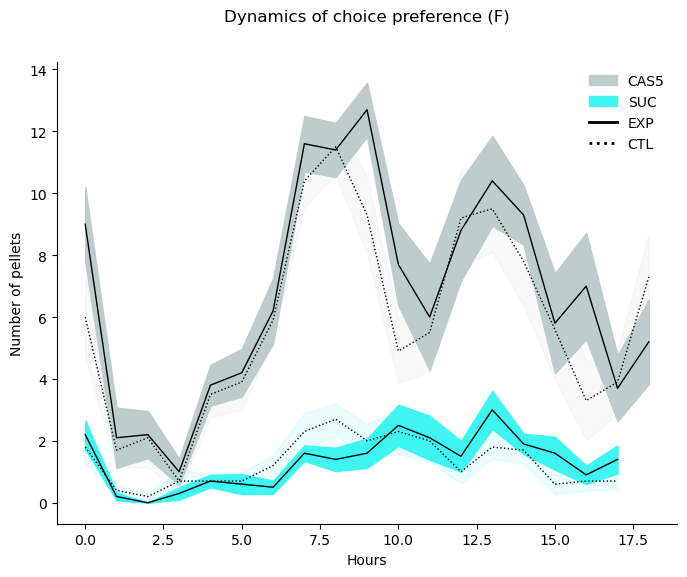

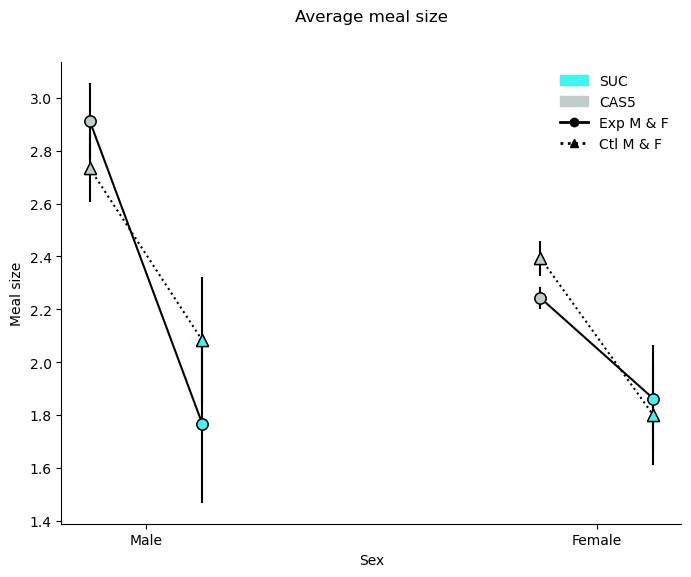

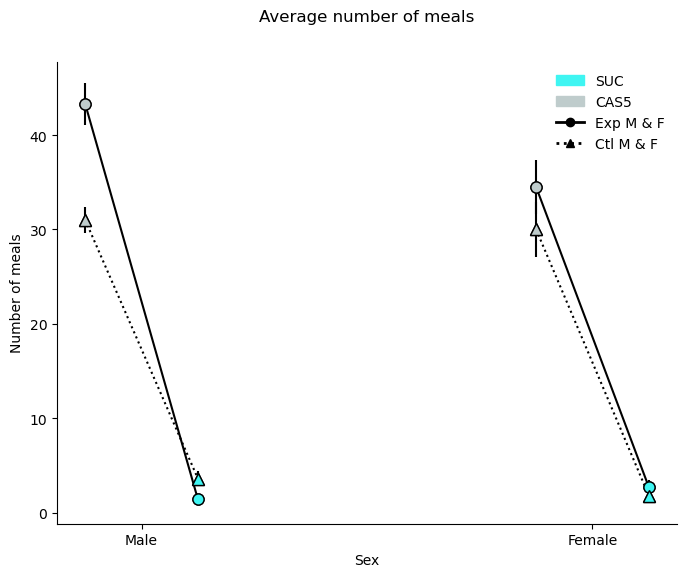

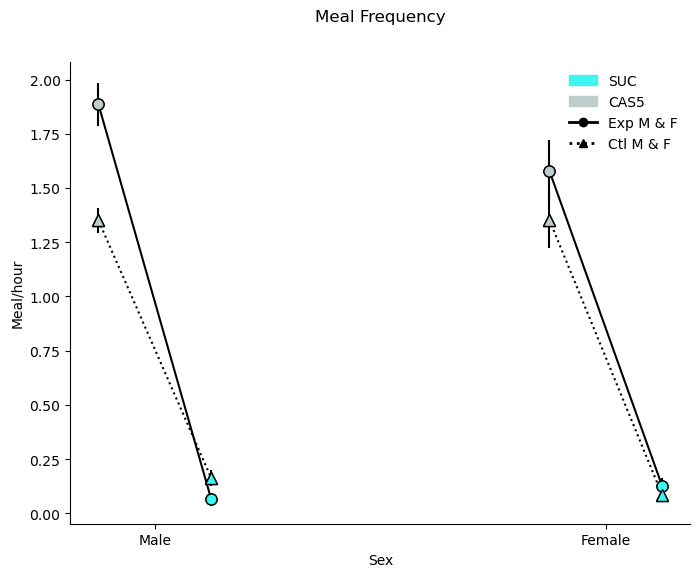

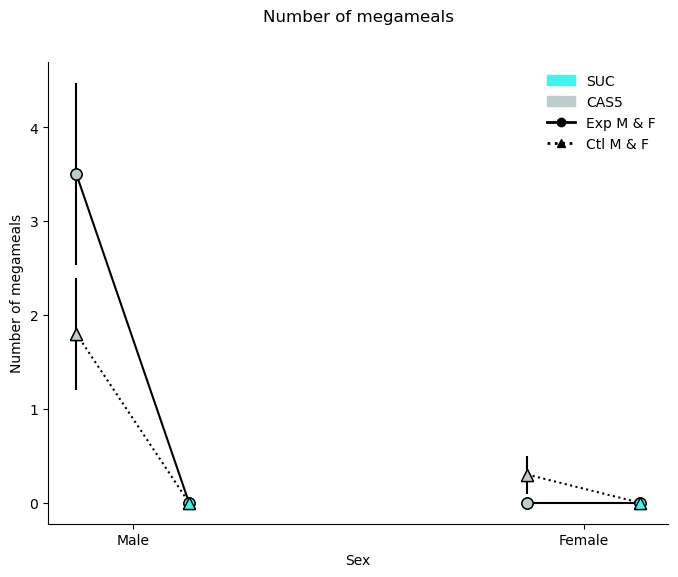

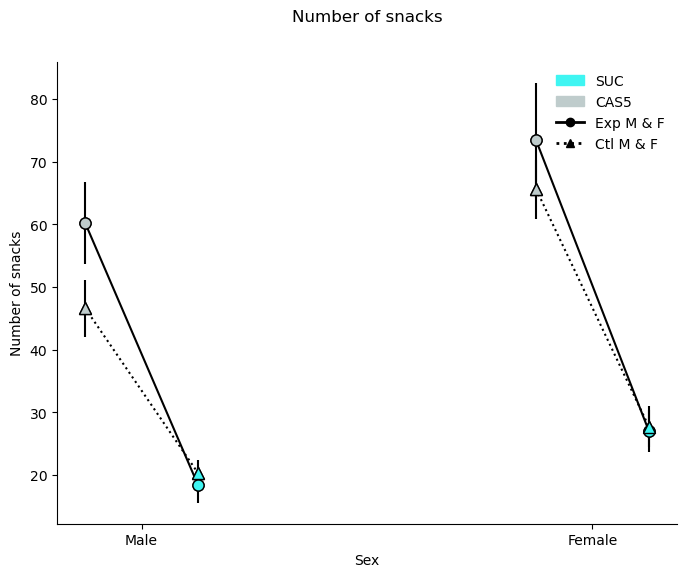

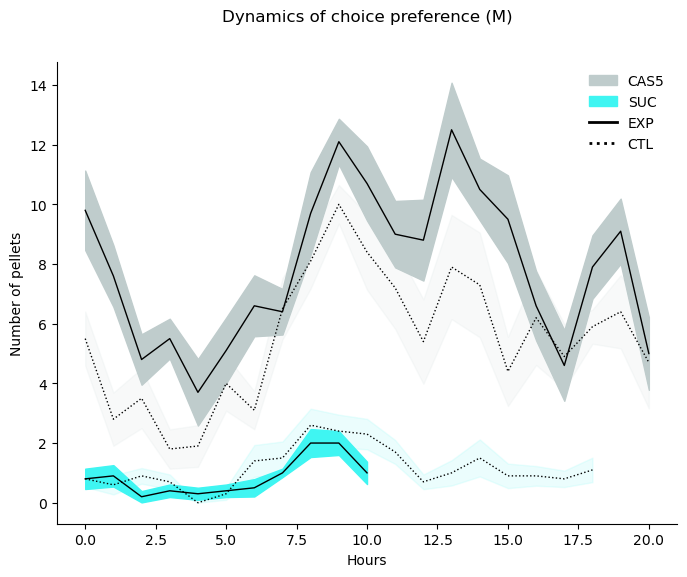

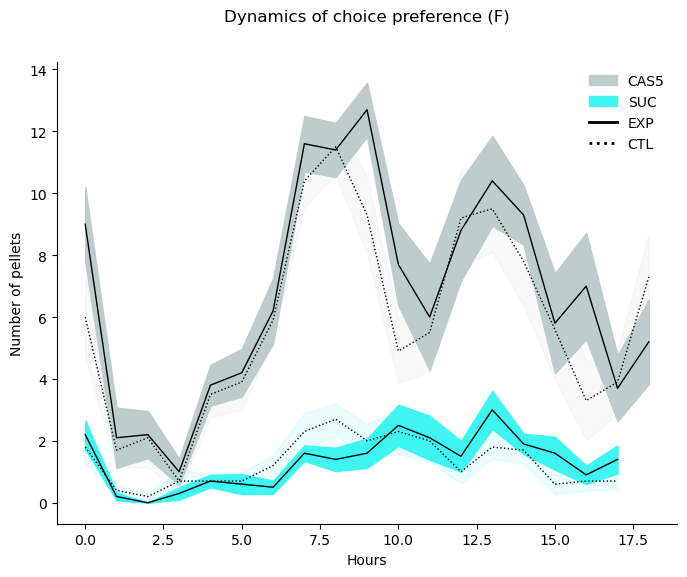

In [31]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import numpy as np

# Define the color values
high_protein_color = (0.749, 0.8, 0.8)  # High protein color
low_protein_color = (0.247, 0.961, 0.949)  # Low protein color
# the last element of the tuple is alpha value
high_protein_color_alpha = (0.749, 0.8, 0.8, 0.1)
low_protein_color_alpha = (0.247, 0.961, 0.949, 0.1)

# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)

# Plot for number of pellets (ax1)
fig1, ax1 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax1, CAS5_FPR_C3, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax1, SUC_FPR_C3, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax1, CAS5_FNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax1, SUC_FNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS5')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.set_title("Dynamics of choice preference (F)", y=1.07)
plt.show()

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label):
    ax.plot(x_positions,
            [np.mean(data_exp[0]), np.mean(data_exp[1])],
            linestyle="-", color="black", marker="o", label=exp_label, markersize=8)
    ax.plot(x_positions,
            [np.mean(data_ctl[0]), np.mean(data_ctl[1])],
            linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=8)
    ax.errorbar([x_positions[0]], [np.mean(data_exp[0])],
                yerr=[np.std(data_exp[0])/np.sqrt(len(data_exp[0]))],
                fmt='o', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_exp[1])],
                yerr=[np.std(data_exp[1])/np.sqrt(len(data_exp[1]))],
                fmt='o', markerfacecolor=low_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[0]], [np.mean(data_ctl[0])],
                yerr=[np.std(data_ctl[0])/np.sqrt(len(data_ctl[0]))],
                fmt='^', markerfacecolor=high_protein_color, ms=8, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_ctl[1])],
                yerr=[np.std(data_ctl[1])/np.sqrt(len(data_ctl[1]))],
                fmt='^', markerfacecolor=low_protein_color, ms=8, color="black")

# Plot for meal size (new plot)
fig_mealsize, ax_mealsize = plt.subplots(figsize=(8, 6))
x_positions_male = [1, 1.5]
x_positions_female = [3, 3.5]
plot_data_with_markers(ax_mealsize, x_positions_male,
                      [mealsize_CAS5_mpr3, mealsize_suc_mpr3],
                      [mealsize_CAS5_mnr3, mealsize_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax_mealsize, x_positions_female,
                      [mealsize_CAS5_fpr3, mealsize_suc_fpr3],
                      [mealsize_CAS5_fnr3, mealsize_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax_mealsize.set_xticks([1.25, 3.25])
ax_mealsize.set_xticklabels(["Male", "Female"])
ax_mealsize.set_ylabel("Meal size")
ax_mealsize.set_xlabel("Sex")
ax_mealsize.spines["top"].set_visible(False)
ax_mealsize.spines["right"].set_visible(False)
ax_mealsize.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax_mealsize.set_title("Average meal size", y=1.07)
plt.show()

# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_CAS5_mpr3, number_of_meals_suc_mpr3],
                      [number_of_meals_CAS5_mnr3, number_of_meals_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_CAS5_fpr3, number_of_meals_suc_fpr3],
                      [number_of_meals_CAS5_fnr3, number_of_meals_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax2.set_xticks([1.25, 3.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("Sex")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax2.set_title("Average number of meals", y=1.07)
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_CAS5_mpr3, meal_frequency_suc_mpr3],
                      [meal_frequency_CAS5_mnr3, meal_frequency_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_CAS5_fpr3, meal_frequency_suc_fpr3],
                      [meal_frequency_CAS5_fnr3, meal_frequency_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax3.set_xticks([1.25, 3.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Meal/hour")
ax3.set_xlabel("Sex")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
ax3.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax3.set_title("Meal Frequency", y=1.07)
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_CAS5_mpr3, NUMBER_OF_MEGA_MEALS_suc_mpr3],
                      [NUMBER_OF_MEGA_MEALS_CAS5_mnr3, NUMBER_OF_MEGA_MEALS_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_CAS5_fpr3, NUMBER_OF_MEGA_MEALS_suc_fpr3],
                      [NUMBER_OF_MEGA_MEALS_CAS5_fnr3, NUMBER_OF_MEGA_MEALS_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax4.set_xticks([1.25, 3.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals")
ax4.set_xlabel("Sex")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax4.set_title("Number of megameals", y=1.07)
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_CAS5_mpr3, NUMBER_OF_SNACKS_suc_mpr3],
                      [NUMBER_OF_SNACKS_CAS5_mnr3, NUMBER_OF_SNACKS_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_CAS5_fpr3, NUMBER_OF_SNACKS_suc_fpr3],
                      [NUMBER_OF_SNACKS_CAS5_fnr3, NUMBER_OF_SNACKS_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax5.set_xticks([1.25, 3.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("Sex")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[mpatches.Patch(color=low_protein_color, label='SUC'), mpatches.Patch(color=high_protein_color, label='CAS5'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax6, CAS5_MPR_C3, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, SUC_MPR_C3, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS5_MNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, SUC_MNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS5')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax6.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax6.set_ylabel("Number of pellets")
ax6.set_xlabel("Hours")
ax6.spines["top"].set_visible(False)
ax6.spines["right"].set_visible(False)
ax6.set_title("Dynamics of choice preference (M)", y=1.07)
plt.show()

# Plot for shaded error (F) (ax7)
fig7, ax7 = plt.subplots(figsize=(8, 6))
plot_shaded_error(ax7, CAS5_FPR_C3, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax7, SUC_FPR_C3, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax7, CAS5_FNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax7, SUC_FNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='CAS5')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='SUC')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax7.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False)

ax7.set_ylabel("Number of pellets")
ax7.set_xlabel("Hours")
ax7.spines["top"].set_visible(False)
ax7.spines["right"].set_visible(False)
ax7.set_title("Dynamics of choice preference (F)", y=1.07)
plt.show()


# <font color = "gold"> PLOTTING FOR POSTER - FROM SESSION 1 to 4 </font >

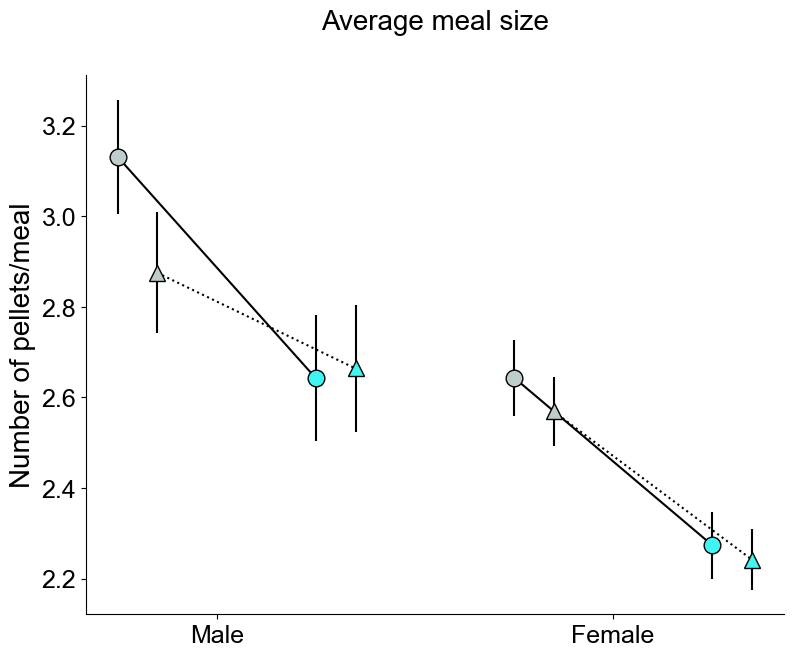

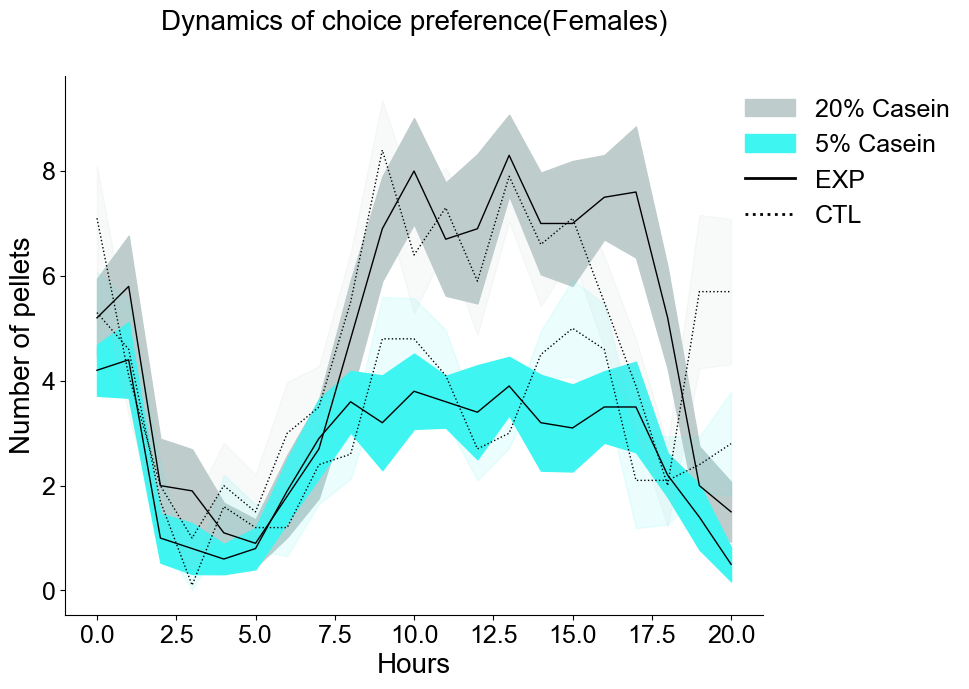

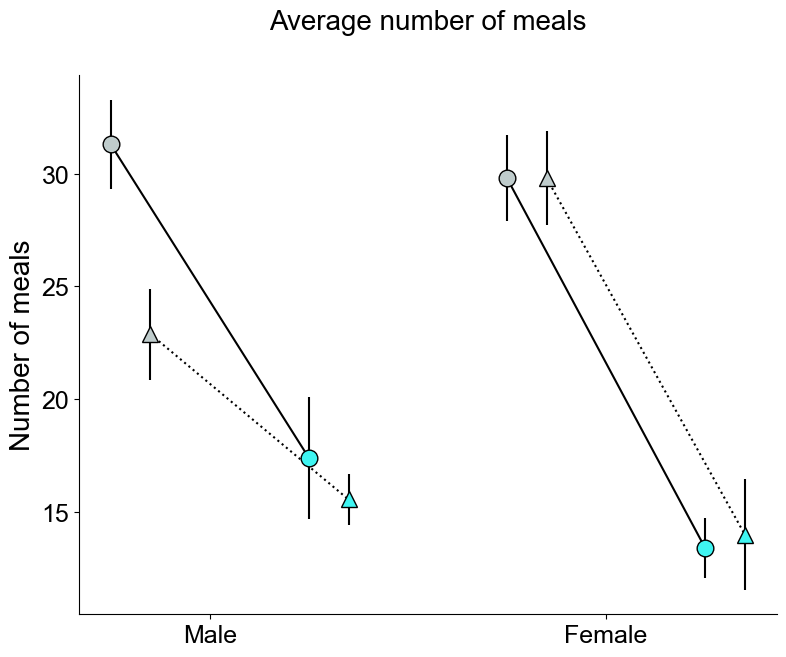

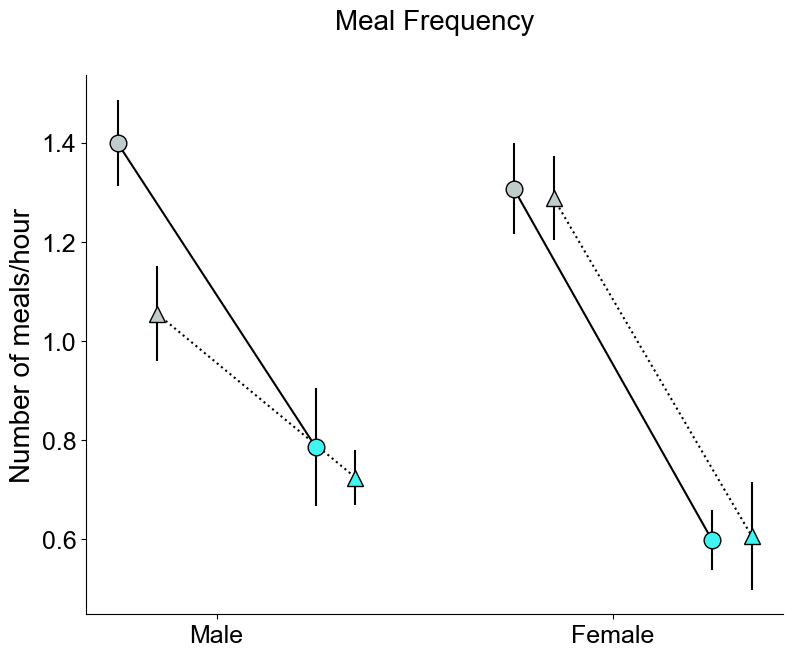

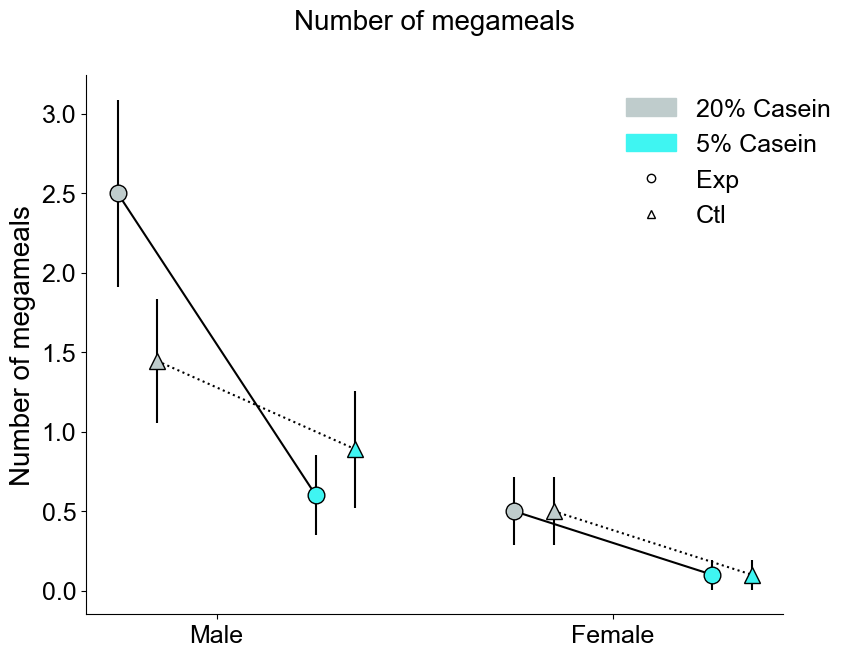

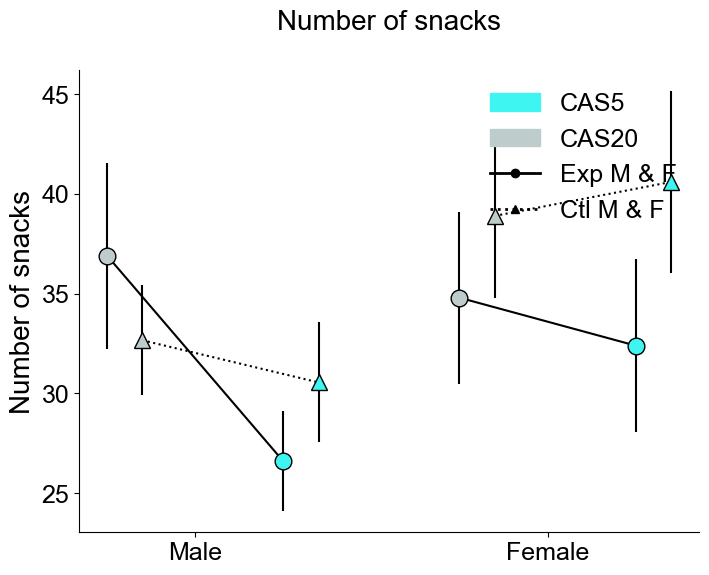

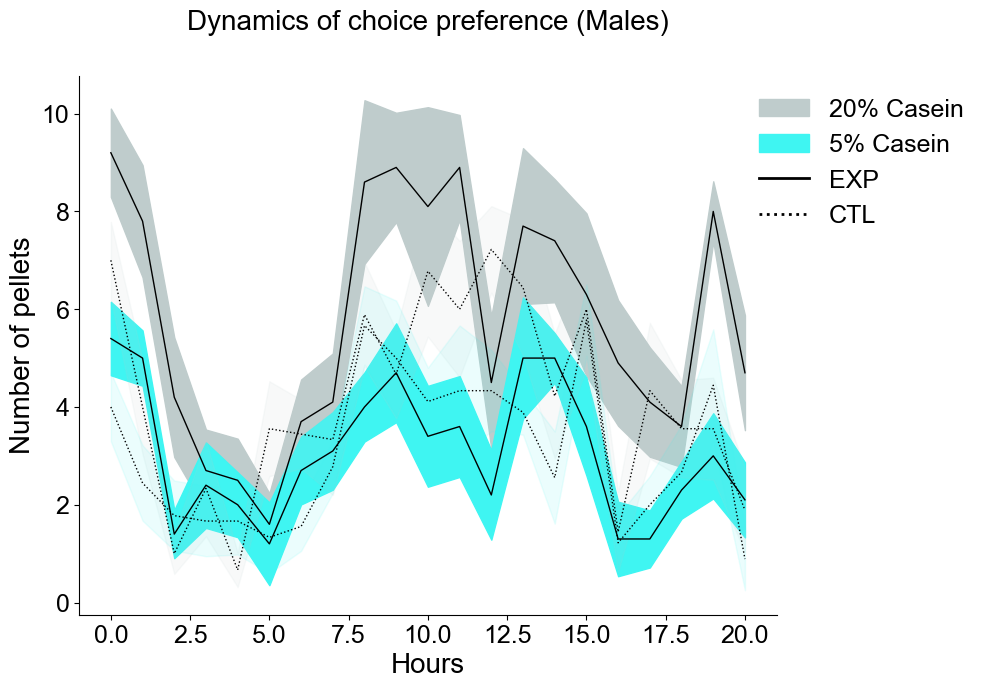

In [47]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import numpy as np

fig_folder = r"../plots\FINAL_PLOTS_FOR_FENS24\C1\\"


# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)


    

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label, gap=0.1):
    # Adjusted positions for control data to create a gap
    ctl_x_positions = [x + gap for x in x_positions]
    
    # Plotting experimental data
    ax.plot(x_positions,
            [np.mean(data_exp[0]), np.mean(data_exp[1])],
            linestyle="-", color="black", marker="o", label=exp_label, markersize=8)
    ax.errorbar([x_positions[0]], [np.mean(data_exp[0])],
                yerr=[np.std(data_exp[0])/np.sqrt(len(data_exp[0]))],
                fmt='o', markerfacecolor=high_protein_color, ms=12, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_exp[1])],
                yerr=[np.std(data_exp[1])/np.sqrt(len(data_exp[1]))],
                fmt='o', markerfacecolor=low_protein_color, ms=12, color="black")

    # Plotting control data with shifted positions
    ax.plot(ctl_x_positions,
            [np.mean(data_ctl[0]), np.mean(data_ctl[1])],
            linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=8)
    ax.errorbar([ctl_x_positions[0]], [np.mean(data_ctl[0])],
                yerr=[np.std(data_ctl[0])/np.sqrt(len(data_ctl[0]))],
                fmt='^', markerfacecolor=high_protein_color, ms=12, color="black")
    ax.errorbar([ctl_x_positions[1]], [np.mean(data_ctl[1])],
                yerr=[np.std(data_ctl[1])/np.sqrt(len(data_ctl[1]))],
                fmt='^', markerfacecolor=low_protein_color, ms=12, color="black")

# Plot for meal size (new plot)
fig_mealsize, ax_mealsize = plt.subplots(figsize=(9, 7))
x_positions_male = [1, 1.5]
x_positions_female = [2, 2.5]
plot_data_with_markers(ax_mealsize, x_positions_male,
                      [mealsize_cas20_mpr1, mealsize_cas5_mpr1],
                      [mealsize_cas20_mnr1, mealsize_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax_mealsize, x_positions_female,
                      [mealsize_cas20_fpr1, mealsize_cas5_fpr1],
                      [mealsize_cas20_fnr1, mealsize_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax_mealsize.set_xticks([1.25, 2.25])
ax_mealsize.set_xticklabels(["Male", "Female"])
ax_mealsize.set_ylabel("Number of pellets/meal")
ax_mealsize.set_xlabel("")
ax_mealsize.spines["top"].set_visible(False)
ax_mealsize.spines["right"].set_visible(False)
# ax_mealsize.legend(handles=[mpatches.Patch(color=high_protein_color, label='20% Casein'), mpatches.Patch(color=low_protein_color, label='5% Casein'), Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor= "none"), Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor= "none")], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax_mealsize.set_title("Average meal size", y=1.07)
fig_mealsize.savefig(fig_folder + "C1_MEAL_SIZE.PDF", bbox_inches='tight')
plt.show()

# Plot for number of pellets (ax1)
fig1, ax1 = plt.subplots(figsize=(9, 7))
plot_shaded_error(ax1, CAS20_FPR_C1, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax1, CAS5_FPR_C1, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax1, CAS20_FNR_C1, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax1, CAS5_FNR_C1, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='20% Casein')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='5% Casein')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax1.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False, bbox_to_anchor=(1.3, 1))

ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.set_title("Dynamics of choice preference(Females)", y=1.07)
fig1.savefig(fig_folder + "C1_DYNAMICS_FEMALES.PDF", bbox_inches='tight')
plt.show()


# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_cas20_mpr1, number_of_meals_cas5_mpr1],
                      [number_of_meals_cas20_mnr1, number_of_meals_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_cas20_fpr1, number_of_meals_cas5_fpr1],
                      [number_of_meals_cas20_fnr1, number_of_meals_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax2.set_xticks([1.25, 2.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
# ax2.legend(handles=[mpatches.Patch(color=high_protein_color, label='20% Casein'), mpatches.Patch(color=low_protein_color, label='5% Casein'), Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor= "none"), Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")], loc='upper right', frameon=False,bbox_to_anchor=(1.2, 1))
ax2.set_title("Average number of meals", y=1.07)
fig2.savefig(fig_folder + "C1_N_meals.PDF", bbox_inches='tight')
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_cas20_mpr1, meal_frequency_cas5_mpr1],
                      [meal_frequency_cas20_mnr1, meal_frequency_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_cas20_fpr1, meal_frequency_cas5_fpr1],
                      [meal_frequency_cas20_fnr1, meal_frequency_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax3.set_xticks([1.25, 2.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Number of meals/hour")
ax3.set_xlabel("")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
# ax3.legend(handles=[mpatches.Patch(color=high_protein_color, label='20% Casein'), mpatches.Patch(color=low_protein_color, label='5% Casein'), Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor= "none"), Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl',markerfacecolor= "none")], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax3.set_title("Meal Frequency", y=1.07)
fig3.savefig(fig_folder + "C1_MEAL_FREQUENCY.PDF", bbox_inches='tight')
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_cas20_mpr1, NUMBER_OF_MEGA_MEALS_cas5_mpr1],
                      [NUMBER_OF_MEGA_MEALS_cas20_mnr1, NUMBER_OF_MEGA_MEALS_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_cas20_fpr1, NUMBER_OF_MEGA_MEALS_cas5_fpr1],
                      [NUMBER_OF_MEGA_MEALS_cas20_fnr1, NUMBER_OF_MEGA_MEALS_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax4.set_xticks([1.25, 2.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals" )
ax4.set_xlabel("")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[mpatches.Patch(color=high_protein_color, label='20% Casein'), mpatches.Patch(color=low_protein_color, label='5% Casein'), Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor="none"), Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")], loc='upper right', frameon=False,bbox_to_anchor=(1.1, 1))
ax4.set_title("Number of megameals", y=1.07)
fig4.savefig(fig_folder + "C1_N_megameals.PDF", bbox_inches='tight')
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(8, 6))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_cas20_mpr1, NUMBER_OF_SNACKS_cas5_mpr1],
                      [NUMBER_OF_SNACKS_cas20_mnr1, NUMBER_OF_SNACKS_cas5_mnr1],
                      high_protein_color, low_protein_color, "Exp M", "Ctl M")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_cas20_fpr1, NUMBER_OF_SNACKS_cas5_fpr1],
                      [NUMBER_OF_SNACKS_cas20_fnr1, NUMBER_OF_SNACKS_cas5_fnr1],
                      high_protein_color, low_protein_color, "Exp F", "Ctl F")

ax5.set_xticks([1.25,2.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[mpatches.Patch(color=low_protein_color, label='CAS5'), mpatches.Patch(color=high_protein_color, label='CAS20'), Line2D([0], [0], color='black', lw=2, linestyle='-', marker='o', label='Exp M & F'), Line2D([0], [0], color='black', lw=2, linestyle=':', marker='^', label='Ctl M & F')], loc='upper right', frameon=False)
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(9, 7))
plot_shaded_error(ax6, CAS20_MPR_C1, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, CAS5_MPR_C1, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS20_MNR_C1, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, CAS5_MNR_C1, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='20% Casein')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='5% Casein')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax6.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False, bbox_to_anchor=(1.3, 1))

ax6.set_ylabel("Number of pellets")
ax6.set_xlabel("Hours")
ax6.spines["top"].set_visible(False)
ax6.spines["right"].set_visible(False)
ax6.set_title("Dynamics of choice preference (Males)", y=1.07)
fig6.savefig(fig_folder + "C1_DYNAMICS_MALES.PDF", bbox_inches='tight')
plt.show()

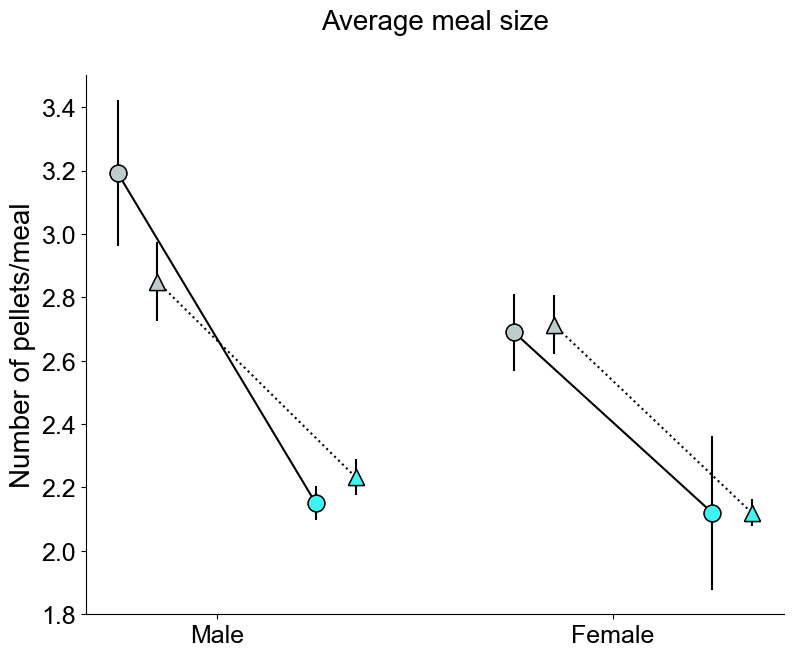

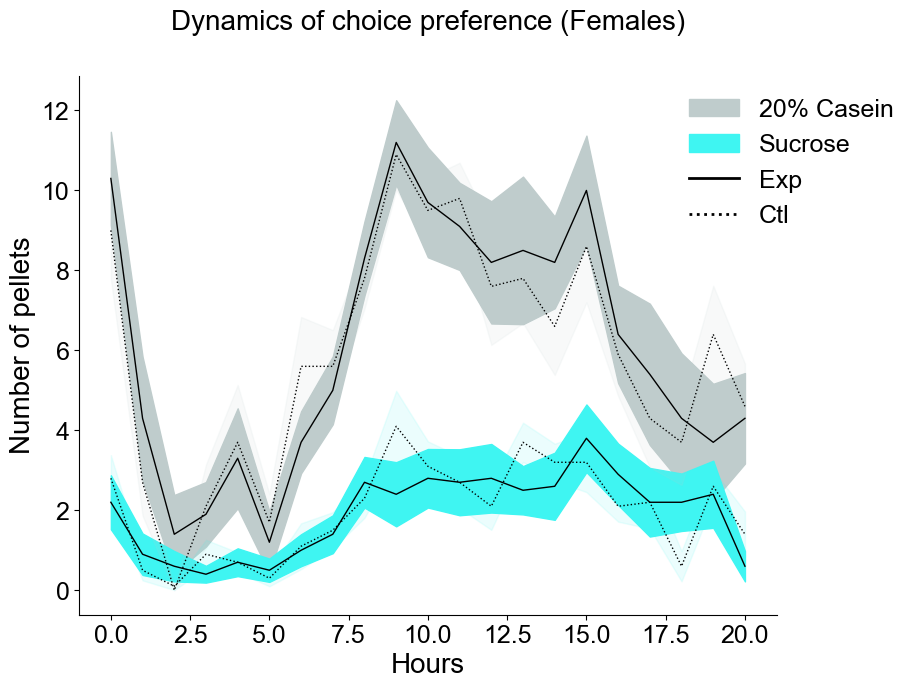

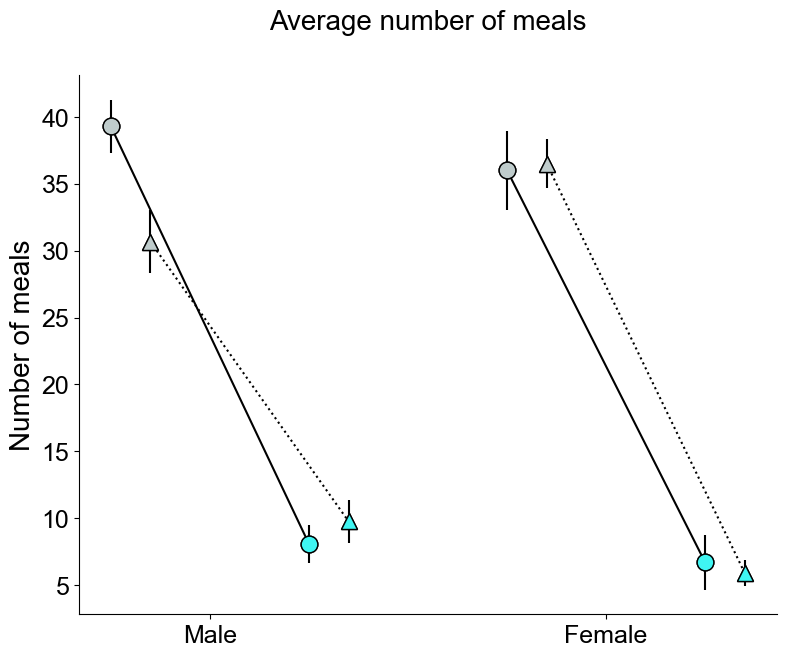

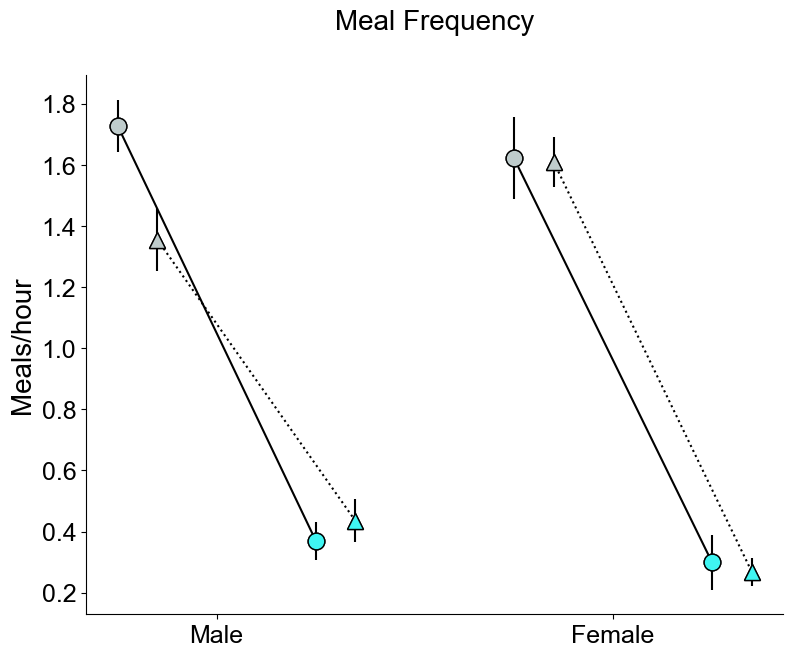

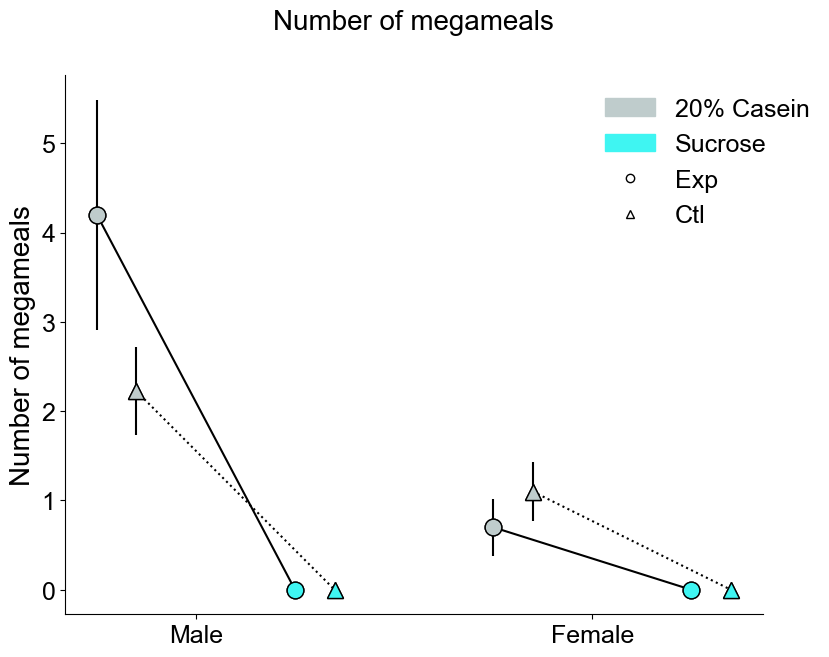

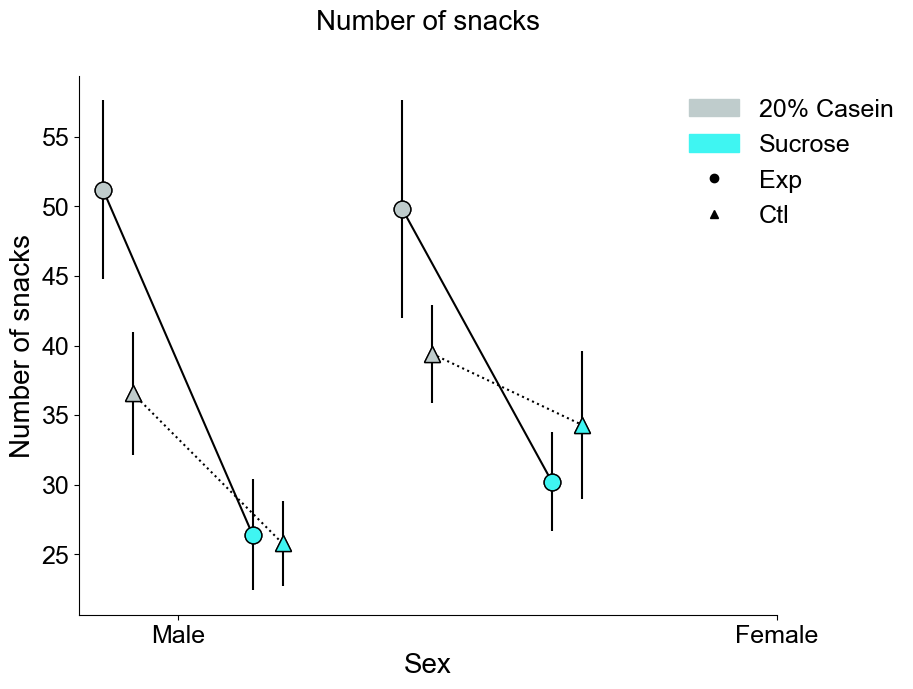

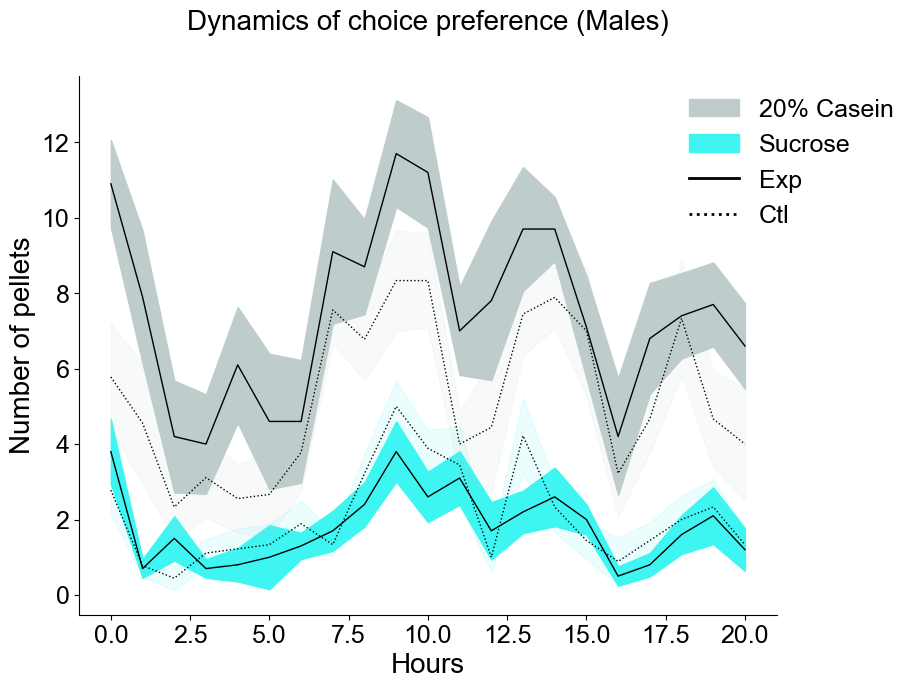

In [51]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import numpy as np

fig_folder = r"../plots/FINAL_PLOTS_FOR_FENS24/C2/"

# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label, gap=0.1):
    ctl_x_positions = [x + gap for x in x_positions]
    
    ax.plot(x_positions, [np.mean(data_exp[0]), np.mean(data_exp[1])], linestyle="-", color="black", marker="o", label=exp_label, markersize=12)
    ax.errorbar([x_positions[0]], [np.mean(data_exp[0])], yerr=[np.std(data_exp[0])/np.sqrt(len(data_exp[0]))], fmt='o', markerfacecolor=high_protein_color, ms=12, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_exp[1])], yerr=[np.std(data_exp[1])/np.sqrt(len(data_exp[1]))], fmt='o', markerfacecolor=low_protein_color, ms=12, color="black")

    ax.plot(ctl_x_positions, [np.mean(data_ctl[0]), np.mean(data_ctl[1])], linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=12)
    ax.errorbar([ctl_x_positions[0]], [np.mean(data_ctl[0])], yerr=[np.std(data_ctl[0])/np.sqrt(len(data_ctl[0]))], fmt='^', markerfacecolor=high_protein_color, ms=12, color="black")
    ax.errorbar([ctl_x_positions[1]], [np.mean(data_ctl[1])], yerr=[np.std(data_ctl[1])/np.sqrt(len(data_ctl[1]))], fmt='^', markerfacecolor=low_protein_color, ms=12, color="black")

# Plot for meal size (new plot)
fig_mealsize, ax_mealsize = plt.subplots(figsize=(9, 7))
x_positions_male = [1, 1.5]
x_positions_female = [2, 2.5]
plot_data_with_markers(ax_mealsize, x_positions_male,
                      [mealsize_cas20_mpr2, mealsize_suc_mpr2],
                      [mealsize_cas20_mnr2, mealsize_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax_mealsize, x_positions_female,
                      [mealsize_cas20_fpr2, mealsize_suc_fpr2],
                      [mealsize_cas20_fnr2, mealsize_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax_mealsize.set_xticks([1.25, 2.25])
ax_mealsize.set_xticklabels(["Male", "Female"])
ax_mealsize.set_ylabel("Number of pellets/meal")
ax_mealsize.set_xlabel("")
ax_mealsize.spines["top"].set_visible(False)
ax_mealsize.spines["right"].set_visible(False)
# ax_mealsize.legend(handles=[
#     mpatches.Patch(color=high_protein_color, label='20% Casein'),
#     mpatches.Patch(color=low_protein_color, label='Sucrose'),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor="none"),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
# ], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax_mealsize.set_title("Average meal size", y=1.07)
fig_mealsize.savefig(fig_folder + "C2_mealsize.pdf", bbox_inches='tight')
plt.show()

# Plot for number of pellets (ax1)
fig1, ax1 = plt.subplots(figsize=(9, 7))
plot_shaded_error(ax1, CAS20_FPR_C2, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax1, SUC_FPR_C2, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax1, CAS20_FNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax1, SUC_FNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

ax1.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='20% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='-', label='Exp'),
    Line2D([0], [0], color='black', lw=2, linestyle=':', label='Ctl')
], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))

ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.set_title("Dynamics of choice preference (Females)", y=1.07)
fig1.savefig(fig_folder + "C2_Dynamics_females.pdf", bbox_inches='tight')
plt.show()

# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_cas20_mpr2, number_of_meals_suc_mpr2],
                      [number_of_meals_cas20_mnr2, number_of_meals_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_cas20_fpr2, number_of_meals_suc_fpr2],
                      [number_of_meals_cas20_fnr2, number_of_meals_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax2.set_xticks([1.25, 2.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
# ax2.legend(handles=[
#     mpatches.Patch(color=high_protein_color, label='20% Casein'),
#     mpatches.Patch(color=low_protein_color, label='Sucrose'),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label="Exp",markerfacecolor="none"),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
# ], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax2.set_title("Average number of meals", y=1.07)
fig2.savefig(fig_folder + "C2_nmeals.pdf", bbox_inches='tight')
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_cas20_mpr2, meal_frequency_suc_mpr2],
                      [meal_frequency_cas20_mnr2, meal_frequency_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_cas20_fpr2, meal_frequency_suc_fpr2],
                      [meal_frequency_cas20_fnr2, meal_frequency_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax3.set_xticks([1.25, 2.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Meals/hour")
ax3.set_xlabel("")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
# ax3.legend(handles=[
#     mpatches.Patch(color=high_protein_color, label='20% Casein'),
#     mpatches.Patch(color=low_protein_color, label='Sucrose'),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp' , markerfacecolor="none"),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
# ], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax3.set_title("Meal Frequency", y=1.07)
fig3.savefig(fig_folder + "C2_meal_frequency.pdf", bbox_inches='tight')
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_cas20_mpr2, NUMBER_OF_MEGA_MEALS_suc_mpr2],
                      [NUMBER_OF_MEGA_MEALS_cas20_mnr2, NUMBER_OF_MEGA_MEALS_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_cas20_fpr2, NUMBER_OF_MEGA_MEALS_suc_fpr2],
                      [NUMBER_OF_MEGA_MEALS_cas20_fnr2, NUMBER_OF_MEGA_MEALS_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax4.set_xticks([1.25, 2.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals")
ax4.set_xlabel("")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='20% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor="none"),
    Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
], loc='upper right', frameon=False, bbox_to_anchor=(1.1, 1))
ax4.set_title("Number of megameals", y=1.07)
fig4.savefig(fig_folder + "C2_nmegameals.pdf", bbox_inches='tight')
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_cas20_mpr2, NUMBER_OF_SNACKS_suc_mpr2],
                      [NUMBER_OF_SNACKS_cas20_mnr2, NUMBER_OF_SNACKS_suc_mnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_cas20_fpr2, NUMBER_OF_SNACKS_suc_fpr2],
                      [NUMBER_OF_SNACKS_cas20_fnr2, NUMBER_OF_SNACKS_suc_fnr2],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax5.set_xticks([1.25, 3.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("Sex")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='20% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp'),
    Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl')
], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(9, 7))
plot_shaded_error(ax6, CAS20_MPR_C2, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, SUC_MPR_C2, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS20_MNR_C2, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, SUC_MNR_C2, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

ax6.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='20% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='-', label='Exp'),
    Line2D([0], [0], color='black', lw=2, linestyle=':', label='Ctl')
], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))

ax6.set_ylabel("Number of pellets")
ax6.set_xlabel("Hours")
ax6.spines["top"].set_visible(False)
ax6.spines["right"].set_visible(False)
ax6.set_title("Dynamics of choice preference (Males)", y=1.07)
fig6.savefig(fig_folder + "C2_dynamics_males.pdf", bbox_inches='tight')
plt.show()


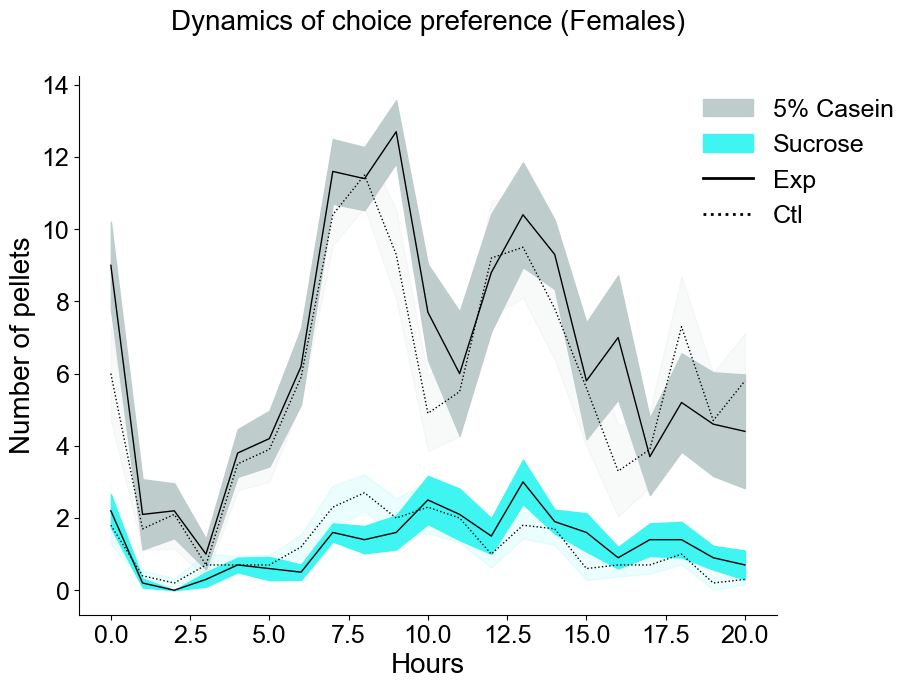

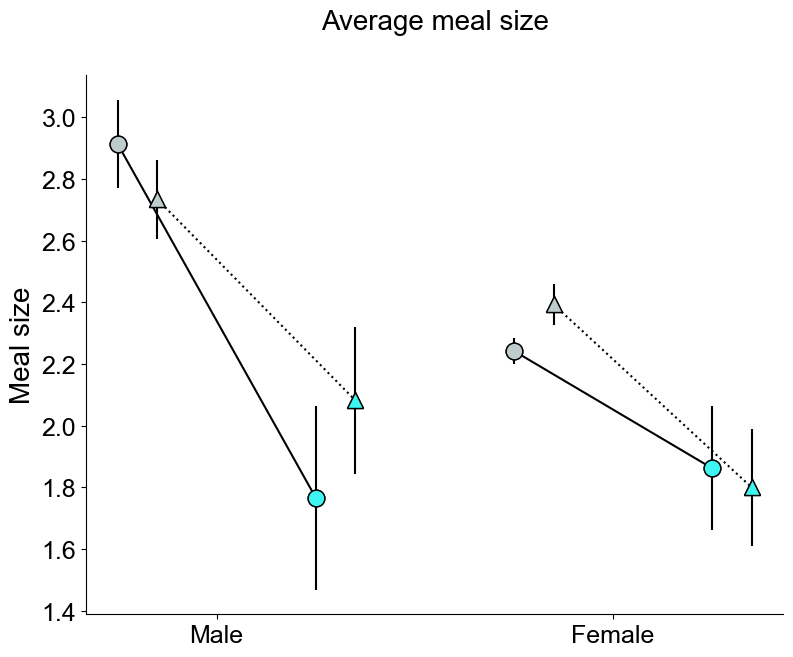

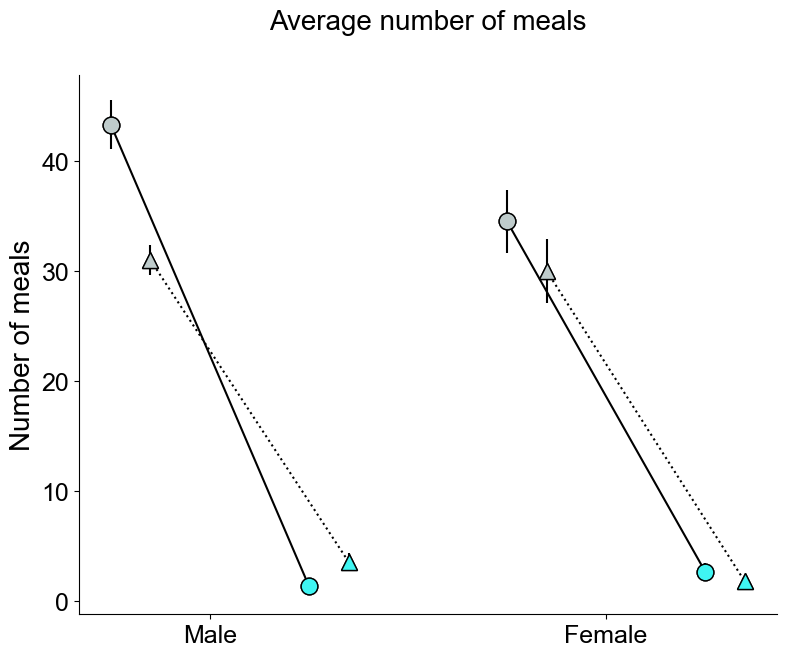

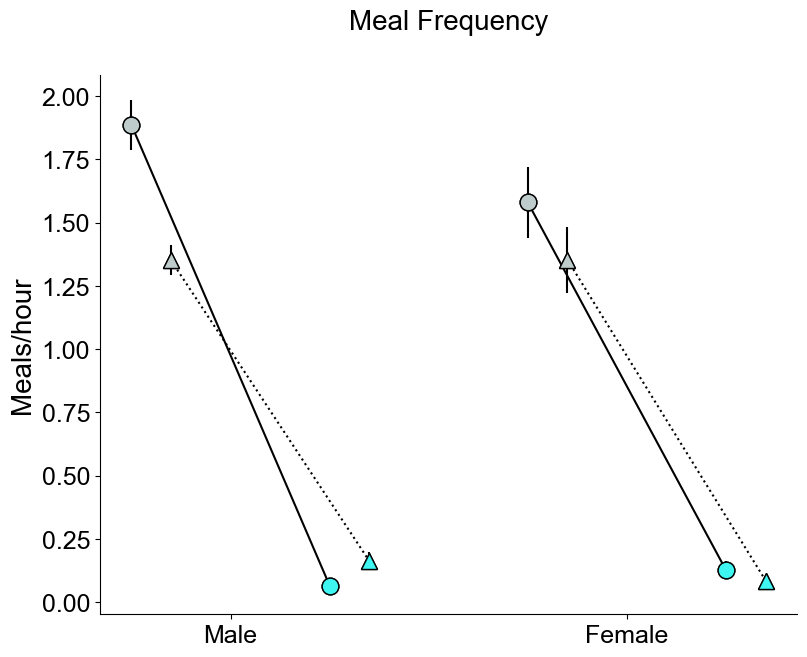

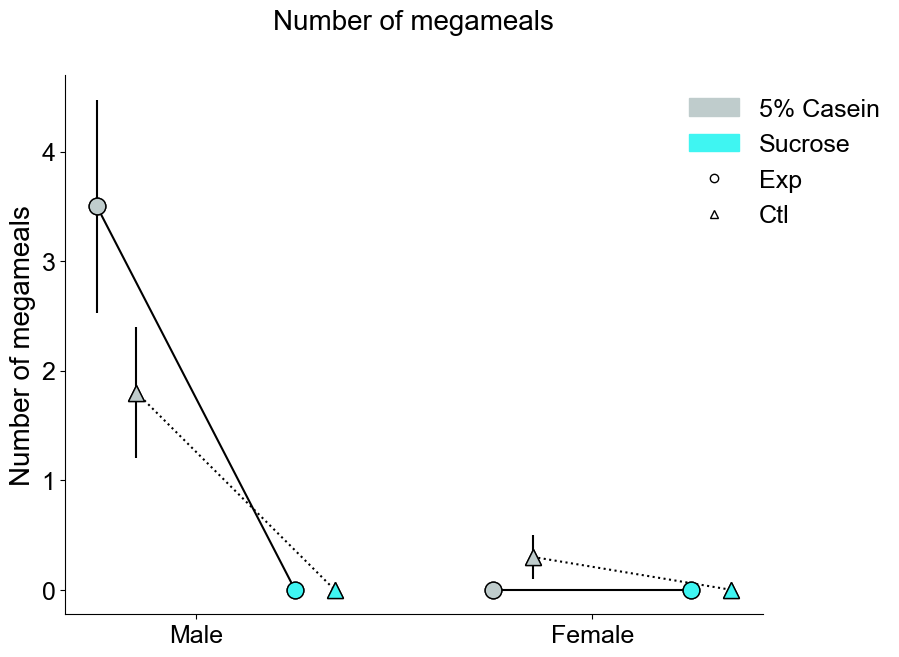

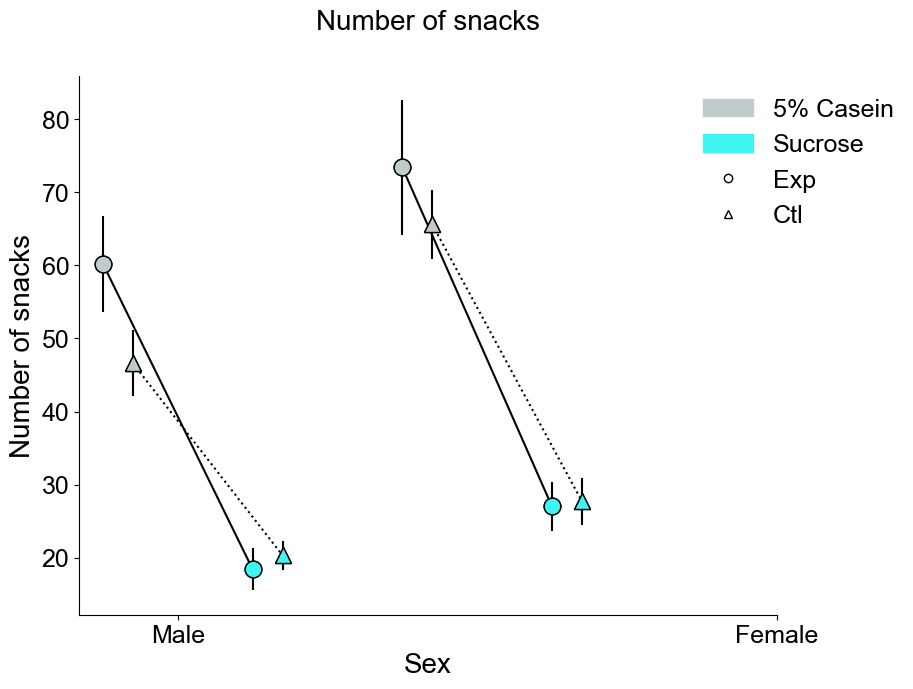

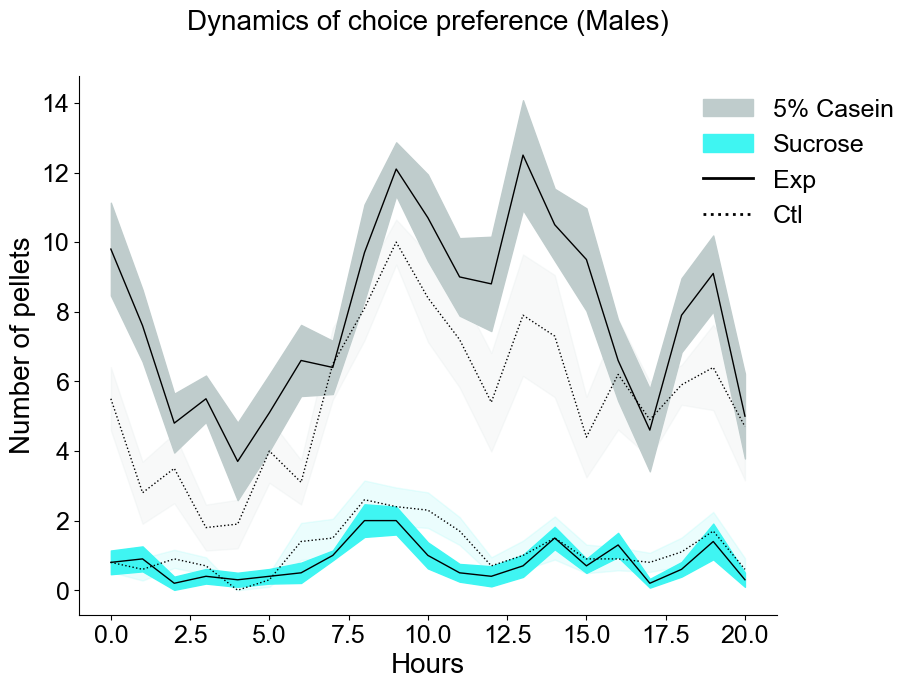

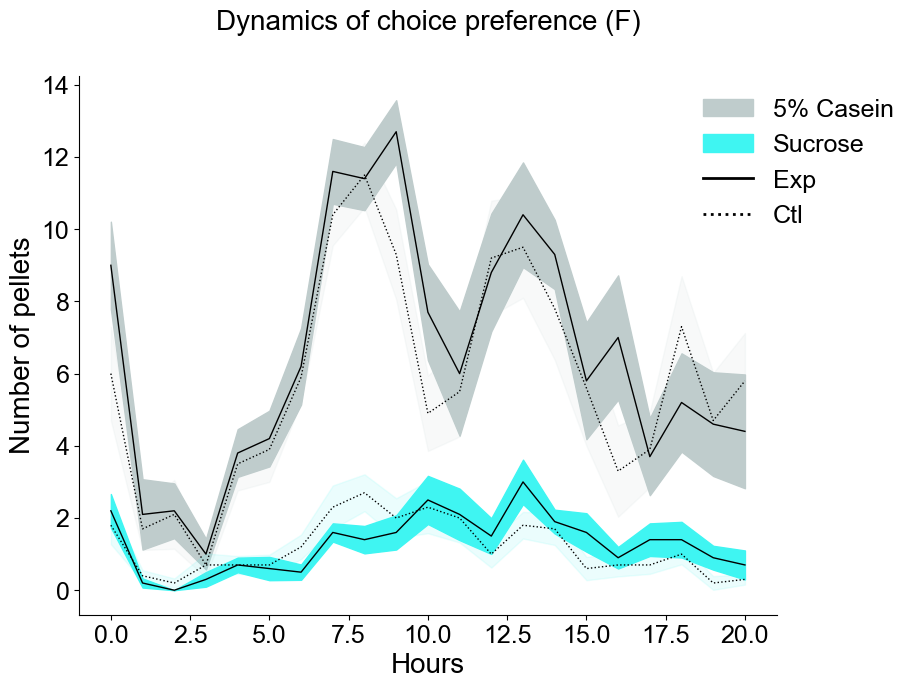

In [54]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import numpy as np

fig_folder = r"../plots\FINAL_PLOTS_FOR_FENS24\C3\\"

# Function to plot shaded error
def plot_shaded_error(ax, data, linecolor, errorcolor, linestyle='-', alpha=1.0):
    tp.shadedError(ax, data, linecolor=linecolor, errorcolor=errorcolor, linestyle=linestyle, alpha=alpha)

# Function to plot data with markers
def plot_data_with_markers(ax, x_positions, data_exp, data_ctl, high_protein_color, low_protein_color, exp_label, ctl_label, gap=0.1):
    ctl_x_positions = [x + gap for x in x_positions]
    
    ax.plot(x_positions, [np.mean(data_exp[0]), np.mean(data_exp[1])], linestyle="-", color="black", marker="o", label=exp_label, markersize=12)
    ax.errorbar([x_positions[0]], [np.mean(data_exp[0])], yerr=[np.std(data_exp[0])/np.sqrt(len(data_exp[0]))], fmt='o', markerfacecolor=high_protein_color, ms=12, color="black")
    ax.errorbar([x_positions[1]], [np.mean(data_exp[1])], yerr=[np.std(data_exp[1])/np.sqrt(len(data_exp[1]))], fmt='o', markerfacecolor=low_protein_color, ms=12, color="black")

    ax.plot(ctl_x_positions, [np.mean(data_ctl[0]), np.mean(data_ctl[1])], linestyle="dotted", color="black", marker='^', label=ctl_label, markersize=12)
    ax.errorbar([ctl_x_positions[0]], [np.mean(data_ctl[0])], yerr=[np.std(data_ctl[0])/np.sqrt(len(data_ctl[0]))], fmt='^', markerfacecolor=high_protein_color, ms=12, color="black")
    ax.errorbar([ctl_x_positions[1]], [np.mean(data_ctl[1])], yerr=[np.std(data_ctl[1])/np.sqrt(len(data_ctl[1]))], fmt='^', markerfacecolor=low_protein_color, ms=12, color="black")

# Plot for number of pellets (ax1)
fig1, ax1 = plt.subplots(figsize=(9, 7))
plot_shaded_error(ax1, CAS5_FPR_C3, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax1, SUC_FPR_C3, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax1, CAS5_FNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax1, SUC_FNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

ax1.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='5% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='-', label='Exp', markerfacecolor="none"),
    Line2D([0], [0], color='black', lw=2, linestyle=':', label='Ctl', markerfacecolor="none")
], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))

ax1.set_ylabel("Number of pellets")
ax1.set_xlabel("Hours")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.set_title("Dynamics of choice preference (Females)", y=1.07)
fig1.savefig(fig_folder + "C3_DYNAMICS_Females.pdf", bbox_inches='tight')
plt.show()

# Plot for meal size (new plot)
fig_mealsize, ax_mealsize = plt.subplots(figsize=(9, 7))
x_positions_male = [1, 1.5]
x_positions_female = [2, 2.5]
plot_data_with_markers(ax_mealsize, x_positions_male,
                      [mealsize_CAS5_mpr3, mealsize_suc_mpr3],
                      [mealsize_CAS5_mnr3, mealsize_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax_mealsize, x_positions_female,
                      [mealsize_CAS5_fpr3, mealsize_suc_fpr3],
                      [mealsize_CAS5_fnr3, mealsize_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax_mealsize.set_xticks([1.25, 2.25])
ax_mealsize.set_xticklabels(["Male", "Female"])
ax_mealsize.set_ylabel("Meal size")
ax_mealsize.set_xlabel("")
ax_mealsize.spines["top"].set_visible(False)
ax_mealsize.spines["right"].set_visible(False)
# ax_mealsize.legend(handles=[
#     mpatches.Patch(color=high_protein_color, label='5% Casein'),
#     mpatches.Patch(color=low_protein_color, label='Sucrose'),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor="none"),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
# ], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax_mealsize.set_title("Average meal size", y=1.07)
fig_mealsize.savefig(fig_folder + "C3_MEALSIZE.pdf", bbox_inches='tight')
plt.show()

# Plot for number of meals (ax2)
fig2, ax2 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax2, x_positions_male,
                      [number_of_meals_CAS5_mpr3, number_of_meals_suc_mpr3],
                      [number_of_meals_CAS5_mnr3, number_of_meals_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax2, x_positions_female,
                      [number_of_meals_CAS5_fpr3, number_of_meals_suc_fpr3],
                      [number_of_meals_CAS5_fnr3, number_of_meals_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax2.set_xticks([1.25, 2.25])
ax2.set_xticklabels(["Male", "Female"])
ax2.set_ylabel("Number of meals")
ax2.set_xlabel("")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
# ax2.legend(handles=[
#     mpatches.Patch(color=high_protein_color, label='5% Casein'),
#     mpatches.Patch(color=low_protein_color, label='Sucrose'),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor="none"),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
# ], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax2.set_title("Average number of meals", y=1.07)
fig2.savefig(fig_folder + "C3_NMEALS.pdf", bbox_inches='tight')
plt.show()

# Plot for meal frequency (ax3)
fig3, ax3 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax3, x_positions_male,
                      [meal_frequency_CAS5_mpr3, meal_frequency_suc_mpr3],
                      [meal_frequency_CAS5_mnr3, meal_frequency_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax3, x_positions_female,
                      [meal_frequency_CAS5_fpr3, meal_frequency_suc_fpr3],
                      [meal_frequency_CAS5_fnr3, meal_frequency_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax3.set_xticks([1.25, 2.25])
ax3.set_xticklabels(["Male", "Female"])
ax3.set_ylabel("Meals/hour")
ax3.set_xlabel("")
ax3.spines["top"].set_visible(False)
ax3.spines["right"].set_visible(False)
# ax3.legend(handles=[
#     mpatches.Patch(color=high_protein_color, label='5% Casein'),
#     mpatches.Patch(color=low_protein_color, label='Sucrose'),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor="none"),
#     Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
# ], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax3.set_title("Meal Frequency", y=1.07)
fig3.savefig(fig_folder + "C3_MEAL_FREQUENCY.pdf", bbox_inches='tight')
plt.show()

# Plot for number of megameals (ax4)
fig4, ax4 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax4, x_positions_male,
                      [NUMBER_OF_MEGA_MEALS_CAS5_mpr3, NUMBER_OF_MEGA_MEALS_suc_mpr3],
                      [NUMBER_OF_MEGA_MEALS_CAS5_mnr3, NUMBER_OF_MEGA_MEALS_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax4, x_positions_female,
                      [NUMBER_OF_MEGA_MEALS_CAS5_fpr3, NUMBER_OF_MEGA_MEALS_suc_fpr3],
                      [NUMBER_OF_MEGA_MEALS_CAS5_fnr3, NUMBER_OF_MEGA_MEALS_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax4.set_xticks([1.25, 2.25])
ax4.set_xticklabels(["Male", "Female"])
ax4.set_ylabel("Number of megameals")
ax4.set_xlabel("")
ax4.spines["top"].set_visible(False)
ax4.spines["right"].set_visible(False)
ax4.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='5% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor="none"),
    Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax4.set_title("Number of megameals", y=1.07)
fig4.savefig(fig_folder + "C3_N_MEGAMEALS.pdf", bbox_inches='tight')
plt.show()

# Plot for number of snacks (ax5)
fig5, ax5 = plt.subplots(figsize=(9, 7))
plot_data_with_markers(ax5, x_positions_male,
                      [NUMBER_OF_SNACKS_CAS5_mpr3, NUMBER_OF_SNACKS_suc_mpr3],
                      [NUMBER_OF_SNACKS_CAS5_mnr3, NUMBER_OF_SNACKS_suc_mnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")
plot_data_with_markers(ax5, x_positions_female,
                      [NUMBER_OF_SNACKS_CAS5_fpr3, NUMBER_OF_SNACKS_suc_fpr3],
                      [NUMBER_OF_SNACKS_CAS5_fnr3, NUMBER_OF_SNACKS_suc_fnr3],
                      high_protein_color, low_protein_color, "Exp", "Ctl")

ax5.set_xticks([1.25, 3.25])
ax5.set_xticklabels(["Male", "Female"])
ax5.set_ylabel("Number of snacks")
ax5.set_xlabel("Sex")
ax5.spines["top"].set_visible(False)
ax5.spines["right"].set_visible(False)
ax5.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='5% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='', marker='o', label='Exp', markerfacecolor="none"),
    Line2D([0], [0], color='black', lw=2, linestyle='', marker='^', label='Ctl', markerfacecolor="none")
], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))
ax5.set_title("Number of snacks", y=1.07)
plt.show()

# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(9, 7))
plot_shaded_error(ax6, CAS5_MPR_C3, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, SUC_MPR_C3, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS5_MNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, SUC_MNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

ax6.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='5% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='-', label='Exp', markerfacecolor="none"),
    Line2D([0], [0], color='black', lw=2, linestyle=':', label='Ctl', markerfacecolor="none")
], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))

ax6.set_ylabel("Number of pellets")
ax6.set_xlabel("Hours")
ax6.spines["top"].set_visible(False)
ax6.spines["right"].set_visible(False)
ax6.set_title("Dynamics of choice preference (Males)", y=1.07)
fig6.savefig(fig_folder + "C3_DYNAMICS_MALES.pdf", bbox_inches='tight')

plt.show()

# Plot for shaded error (F) (ax7)
fig7, ax7 = plt.subplots(figsize=(9, 7))
plot_shaded_error(ax7, CAS5_FPR_C3, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax7, SUC_FPR_C3, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax7, CAS5_FNR_C3, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax7, SUC_FNR_C3, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

ax7.legend(handles=[
    mpatches.Patch(color=high_protein_color, label='5% Casein'),
    mpatches.Patch(color=low_protein_color, label='Sucrose'),
    Line2D([0], [0], color='black', lw=2, linestyle='-', label='Exp', markerfacecolor="none"),
    Line2D([0], [0], color='black', lw=2, linestyle=':', label='Ctl', markerfacecolor="none")
], loc='upper right', frameon=False, bbox_to_anchor=(1.2, 1))

ax7.set_ylabel("Number of pellets")
ax7.set_xlabel("Hours")
ax7.spines["top"].set_visible(False)
ax7.spines["right"].set_visible(False)
ax7.set_title("Dynamics of choice preference (F)", y=1.07)
plt.show()


In [ ]:
# Plot for shaded error (M) (ax6)
fig6, ax6 = plt.subplots(figsize=(3.9,2.6))
plot_shaded_error(ax6, CAS20_MPR_C1, linecolor="black", errorcolor=high_protein_color)
plot_shaded_error(ax6, CAS5_MPR_C1, linecolor="black", errorcolor=low_protein_color)
plot_shaded_error(ax6, CAS20_MNR_C1, linecolor="black", errorcolor=high_protein_color_alpha, linestyle="dotted", alpha=0.1)
plot_shaded_error(ax6, CAS5_MNR_C1, linecolor="black", errorcolor=low_protein_color_alpha, linestyle="dotted", alpha=0.1)

high_protein_patch = mpatches.Patch(color=high_protein_color, label='20% Casein')
low_protein_patch = mpatches.Patch(color=low_protein_color, label='5% Casein')
solid_line = Line2D([0], [0], color='black', lw=2, linestyle='-', label='EXP')
dotted_line = Line2D([0], [0], color='black', lw=2, linestyle=':', label='CTL')
ax6.legend(handles=[high_protein_patch, low_protein_patch, solid_line, dotted_line], loc='upper right', frameon=False, bbox_to_anchor=(1.5, 1), handlelength=1)